# ECE-6524 / CS-6524 Deep Learning
### Project Assignment 2 

In this assignment, **you will implement the following:**
1. GAN / LSGAN loss functions and training code for MNIST dataset.
2. Train GAN / LSGAN with DCGAN architectures for MNIST dataset.

This assignment is inspired and adapted from UIUC CS498 and Stanford CS231n.
## Submission guideline
1. Click the Save button at the top of the Jupyter Notebook.
2. Please make sure to have entered your Virginia Tech PID below.
3. Select Cell -> All Output -> Clear. This will clear all the outputs from all cells (but will keep the content of cells).
4. Select Cell -> Run All. This will run all the cells in order.
5. Once you've rerun everything, select File -> Download as -> PDF via LaTeX
6. Look at the PDF file and make sure all your solutions are displayed correctly there. 
7. Zip all the files along with this notebook (Please don't include the data).
8. Name your PDF file as Assignment2_[YOUR ID NUMBER].
9. Submit your zipped file and the PDF **INDEPENDENTLY**.
10. **PLEASE DO NOT ZIP YOUR DATASET. NOTEBOOK/CODE/PDF ONLY.**

**While you are encouraged to discuss with your peers, <span style="color:blue">all work submitted is expected to be your own.</span> <span style="color:red">If you use any information from other resources (e.g. online materials), you are required to cite it below you VT PID. Any violation will result in a 0 mark for the assignment.</span>**

### Please Write Your VT PID Here: 906270197
### Reference (if any):


# Generative Adversarial Networks (GANs)

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$


# Section 1. Generative Adversarial Networks on MNIST Dataset [55 pts]

In this section, you will need to:
1. Implement two different types of loss functions (GAN / LSGAN) for generative adversarial networks. 
2. Implement Generator and Discriminator for your GAN model.
3. Training codes for your GAN models.
3. Train and verify your model on MNIST dataset.

Now, let's get started!

In [0]:
import tensorflow as tf
from tensorflow.keras import layers
import numpy as np
import os
from functools import partial
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    return tf.random.uniform([batch_size, dim], minval=-1, maxval=1)

NOISE_DIM = 100
batch_size = 128

## Section 1.1. Vanilla GAN loss functions

### Section 1.1.1 GAN Loss [10 pts]

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [0]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss.
 
    Inputs:
    - logits_real: Tensor of shape (N,) giving scores for the real data.
    - logits_fake: Tensor of shape (N,) giving scores for the fake data.
    - N is the Batch size
 
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    
    """
 
    loss = None
    
    ####################################
    #          YOUR CODE HERE          #
    ####################################
    cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    real_loss = cross_entropy(tf.ones_like(logits_real), logits_real)
    fake_loss = cross_entropy(tf.zeros_like(logits_fake), logits_fake)
    loss = real_loss + fake_loss
    
    ##########       END      ##########
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss.

    Inputs:
    - logits_fake: Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing the (scalar) loss for the generator.
    """

    loss = None
    ####################################
    #          YOUR CODE HERE          #
    ####################################
    cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    loss = cross_entropy(tf.ones_like(logits_fake), logits_fake)

    
    ##########       END      ##########
    return loss

### Section 1.1.2 Implement Discriminator and Generator models for GAN [10 pts]

#### Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [0]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
          tf.keras.layers.Dense(256, input_shape=(784,), activation= partial(tf.nn.leaky_relu, alpha = 0.01)),
          tf.keras.layers.Dense(256, activation=partial(tf.nn.leaky_relu, alpha = 0.01)),
          tf.keras.layers.Dense(1)])
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    
    return model

## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [0]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    tf.keras.layers.Dense(1024, input_shape=(noise_dim,), activation='relu'),
    tf.keras.layers.Dense(1024, activation='relu'),
    tf.keras.layers.Dense(784, activation=tf.nn.tanh)])
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    print(model.summary)
    return model

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [0]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

11493376/11490434 [==============================] - 0s 0us/step
[5 0 4 1 9 2 1 3 1 4 3 5 3 6 1 7]
(128, 784)


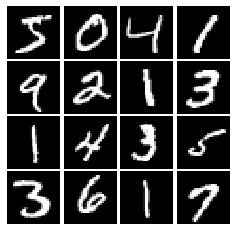

In [6]:
# show a batch
mnist = MNIST(batch_size=16) 
print(mnist.y[:16])
print(mnist.X[:batch_size].shape)
show_images(mnist.X[:16])

## Section 1.1.3 Training code [15 pts]
### Training a GAN!

You can't train a model without a proper training code. Implement the GAN training procedure here following the [original GAN paper](https://arxiv.org/pdf/1406.2661.pdf) and the course slides in the cell below. Note that this code would be reused in the subsequent section, so make sure that it is correctly implemented.

In [0]:
# a giant helper function
def train(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=100):
    """
    Train loop for GAN.

    The loop will consist of two steps: a discriminator step and a generator step.

    (1) In the discriminator step, first step is to sample noise to generate a fake data batch using the generator. 
    Calculate the discriminator output for real and fake data, and use the output to compute discriminator loss. 
    In code 'd_total_error' is the total discriminator loss.
    
    (2) For the generator step, first step is to sample noise to generate a fake data batch. 
    Get the discriminator output for the fake data batch and use this to compute the generator loss. 
    In code 'g_error' is the generator loss. 
    
    Use the sample_noise function to sample random noise, and the discriminator_loss
    and generator_loss functions for their respective loss computations

    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        i = 1
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                ##########################################
                # your code   # Discriminator step       #
                generate = G
                noise_image = sample_noise(batch_size, NOISE_DIM)
                fake_image = generate(noise_image)
                mnist_data = preprocess_img(real_data)
                discriminate = D
                fake_data = discriminate(fake_image)
                real_data = discriminate(mnist_data)
                d_total_error = discriminator_loss(real_data, fake_data)
                ##########################################
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                ##########################################
                # your code # Generator step             #
                noise_image = sample_noise(batch_size, NOISE_DIM)
                fake_image = generate(noise_image)
                fake_data = discriminate(fake_image)
                g_error = generator_loss(fake_data)
                ##########################################
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_image.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
            i += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

### Section 1.1.4 Training on MNIST [5 pts]
#### Train your GAN!
Run the cell belowe to train your GAN model. You should expect results that resemble the following if your loss function and training loop implementations are correct:

<bound method Network.summary of <tensorflow.python.keras.engine.sequential.Sequential object at 0x7f7470f57978>>
Epoch: 0, Iter: 0, D: 1.972, G:0.6999
Instructions for updating:
Use tf.identity instead.


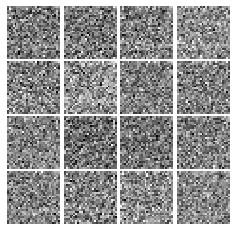

Epoch: 0, Iter: 20, D: 0.5774, G:0.9494


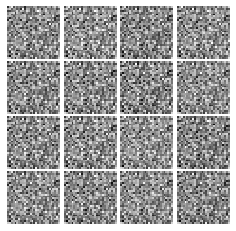

Epoch: 0, Iter: 40, D: 0.6094, G:0.9263


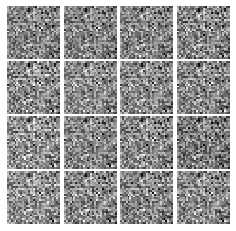

Epoch: 0, Iter: 60, D: 2.204, G:0.2456


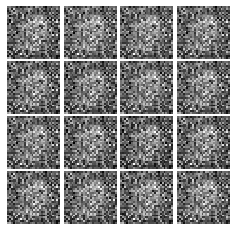

Epoch: 0, Iter: 80, D: 1.292, G:1.138


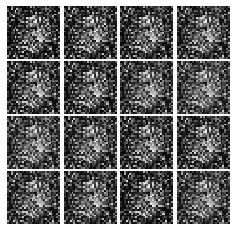

Epoch: 0, Iter: 100, D: 1.535, G:0.8878


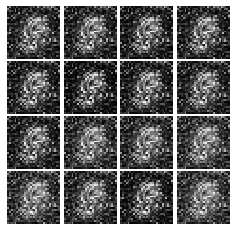

Epoch: 0, Iter: 120, D: 0.8667, G:1.482


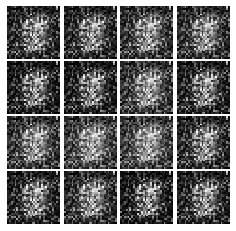

Epoch: 0, Iter: 140, D: 1.652, G:0.8219


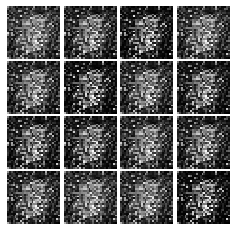

Epoch: 0, Iter: 160, D: 1.467, G:0.8662


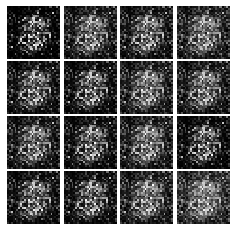

Epoch: 0, Iter: 180, D: 0.9325, G:1.54


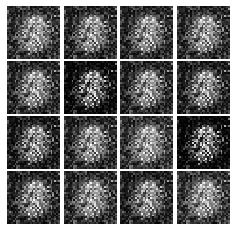

Epoch: 0, Iter: 200, D: 1.182, G:1.115


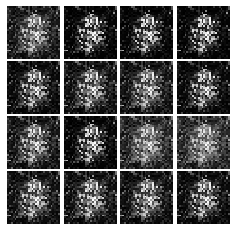

Epoch: 0, Iter: 220, D: 1.511, G:1.382


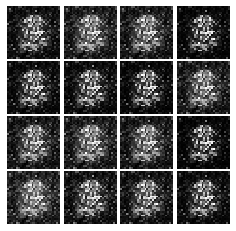

Epoch: 0, Iter: 240, D: 1.983, G:1.12


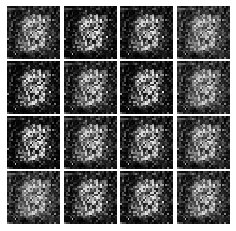

Epoch: 0, Iter: 260, D: 1.295, G:1.153


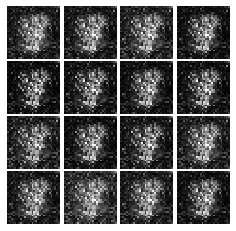

Epoch: 0, Iter: 280, D: 0.8204, G:1.412


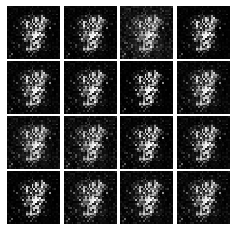

Epoch: 0, Iter: 300, D: 0.9593, G:1.339


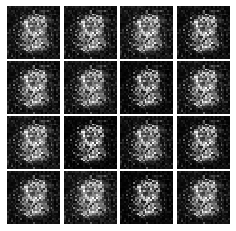

Epoch: 0, Iter: 320, D: 1.398, G:1.381


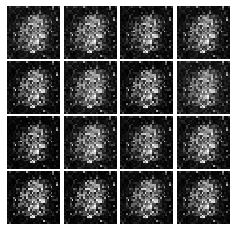

Epoch: 0, Iter: 340, D: 1.164, G:1.14


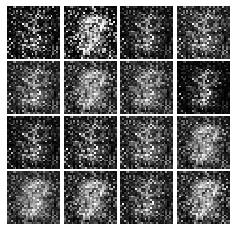

Epoch: 0, Iter: 360, D: 1.512, G:3.008


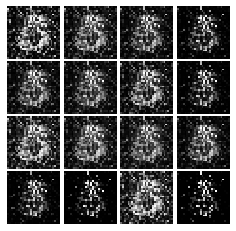

Epoch: 0, Iter: 380, D: 1.146, G:1.408


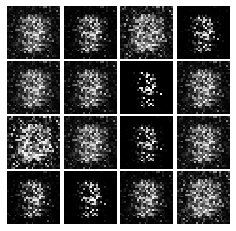

Epoch: 0, Iter: 400, D: 0.9606, G:1.78


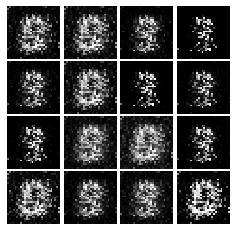

Epoch: 0, Iter: 420, D: 1.062, G:1.395


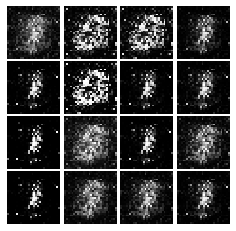

Epoch: 0, Iter: 440, D: 1.343, G:1.028


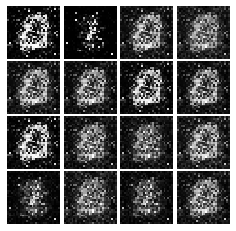

Epoch: 0, Iter: 460, D: 0.9531, G:1.276


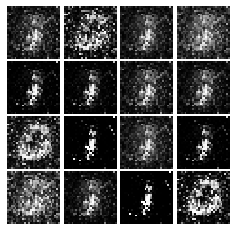

Epoch: 1, Iter: 480, D: 1.72, G:0.762


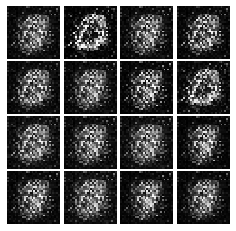

Epoch: 1, Iter: 500, D: 0.7312, G:1.448


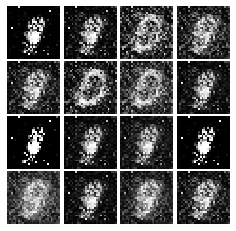

Epoch: 1, Iter: 520, D: 1.079, G:1.209


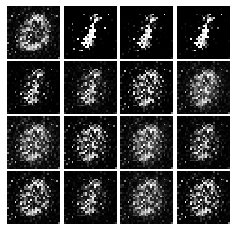

Epoch: 1, Iter: 540, D: 1.298, G:1.579


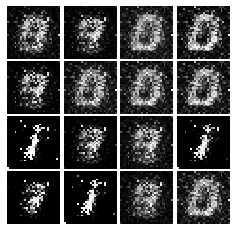

Epoch: 1, Iter: 560, D: 0.9871, G:1.552


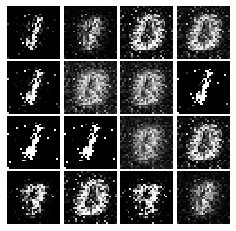

Epoch: 1, Iter: 580, D: 1.169, G:1.333


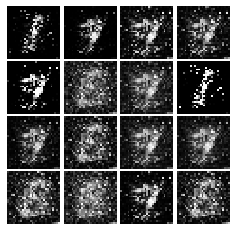

Epoch: 1, Iter: 600, D: 1.131, G:2.539


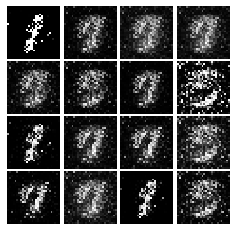

Epoch: 1, Iter: 620, D: 0.9788, G:1.564


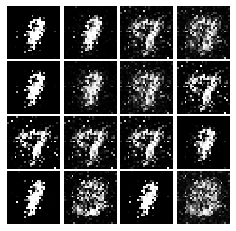

Epoch: 1, Iter: 640, D: 1.107, G:1.247


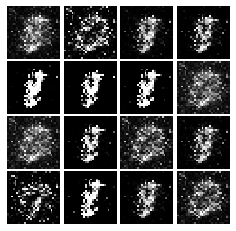

Epoch: 1, Iter: 660, D: 1.052, G:1.594


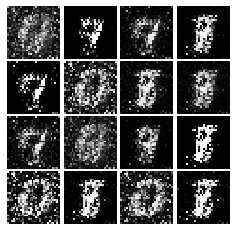

Epoch: 1, Iter: 680, D: 2.407, G:1.539


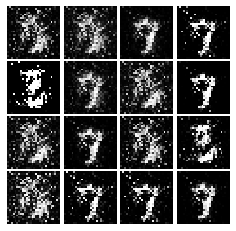

Epoch: 1, Iter: 700, D: 0.9713, G:1.574


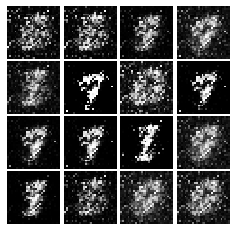

Epoch: 1, Iter: 720, D: 0.9389, G:1.069


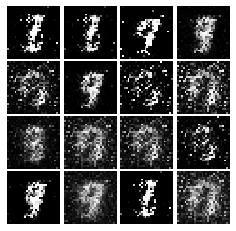

Epoch: 1, Iter: 740, D: 1.327, G:0.4693


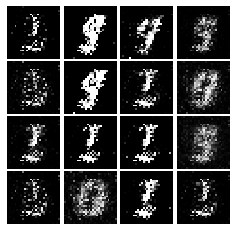

Epoch: 1, Iter: 760, D: 1.143, G:0.8842


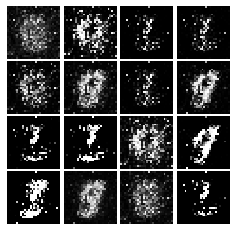

Epoch: 1, Iter: 780, D: 0.7294, G:3.248


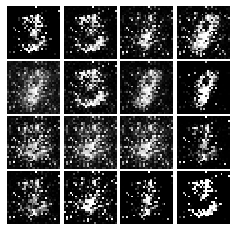

Epoch: 1, Iter: 800, D: 1.185, G:1.444


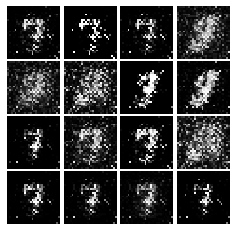

Epoch: 1, Iter: 820, D: 1.068, G:1.517


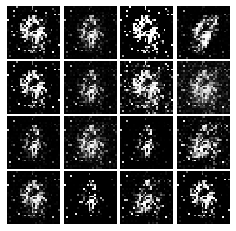

Epoch: 1, Iter: 840, D: 1.107, G:1.561


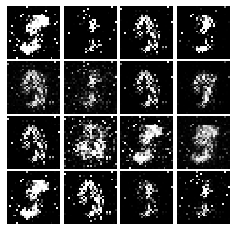

Epoch: 1, Iter: 860, D: 1.056, G:1.408


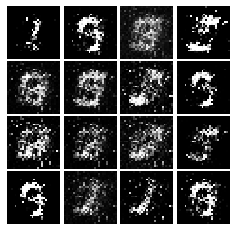

Epoch: 1, Iter: 880, D: 1.142, G:1.478


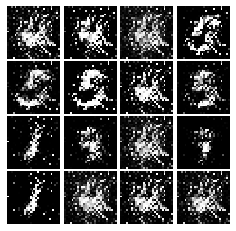

Epoch: 1, Iter: 900, D: 1.227, G:1.324


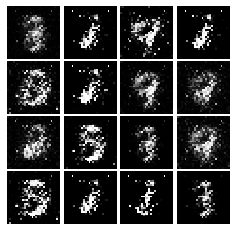

Epoch: 1, Iter: 920, D: 1.268, G:0.8232


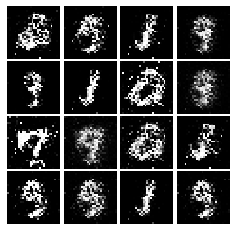

Epoch: 2, Iter: 940, D: 1.218, G:0.7541


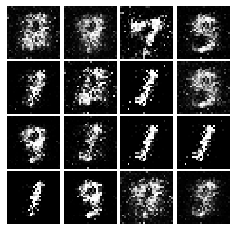

Epoch: 2, Iter: 960, D: 0.9593, G:1.326


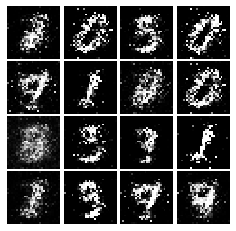

Epoch: 2, Iter: 980, D: 1.036, G:1.18


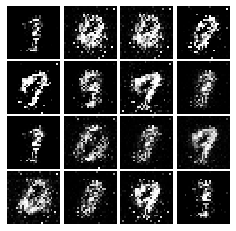

Epoch: 2, Iter: 1000, D: 1.216, G:1.396


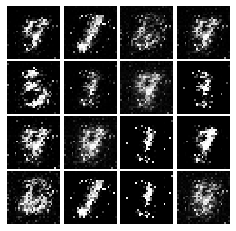

Epoch: 2, Iter: 1020, D: 1.095, G:0.7211


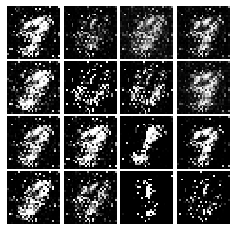

Epoch: 2, Iter: 1040, D: 1.363, G:1.947


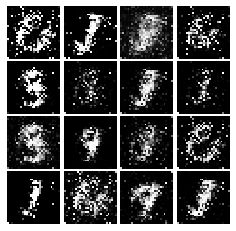

Epoch: 2, Iter: 1060, D: 1.1, G:1.1


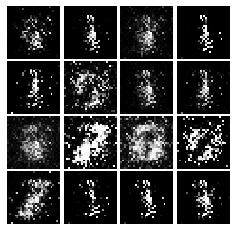

Epoch: 2, Iter: 1080, D: 1.164, G:1.716


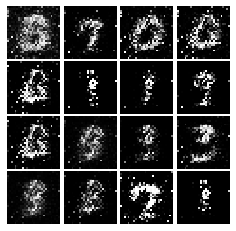

Epoch: 2, Iter: 1100, D: 1.173, G:1.208


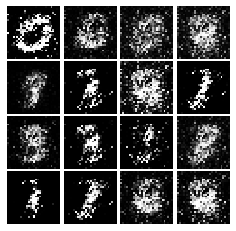

Epoch: 2, Iter: 1120, D: 1.225, G:0.949


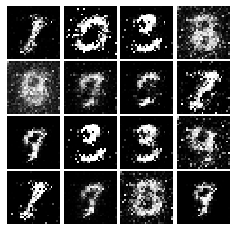

Epoch: 2, Iter: 1140, D: 1.284, G:1.11


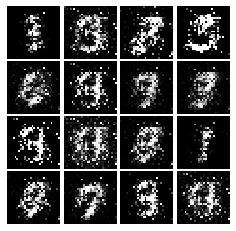

Epoch: 2, Iter: 1160, D: 1.284, G:1.084


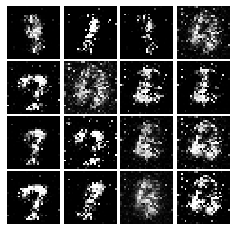

Epoch: 2, Iter: 1180, D: 1.251, G:0.2586


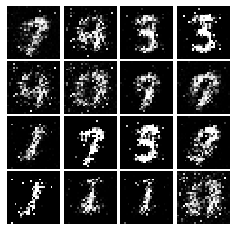

Epoch: 2, Iter: 1200, D: 1.21, G:0.9911


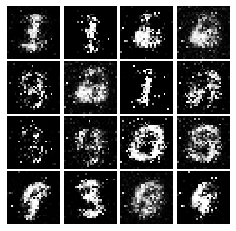

Epoch: 2, Iter: 1220, D: 1.115, G:1.136


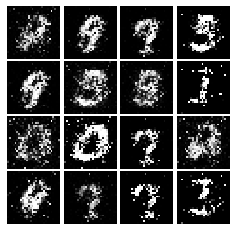

Epoch: 2, Iter: 1240, D: 1.619, G:0.5346


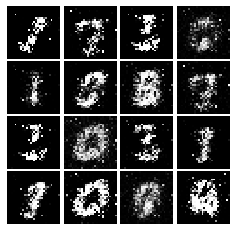

Epoch: 2, Iter: 1260, D: 1.258, G:0.9788


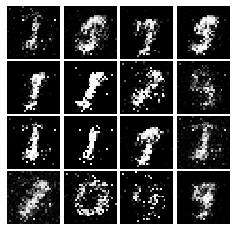

Epoch: 2, Iter: 1280, D: 1.145, G:1.344


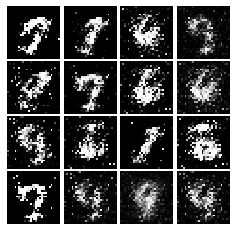

Epoch: 2, Iter: 1300, D: 1.188, G:1.002


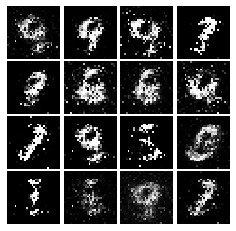

Epoch: 2, Iter: 1320, D: 1.088, G:1.381


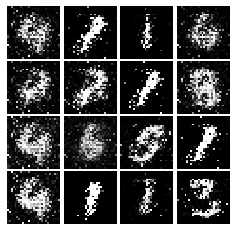

Epoch: 2, Iter: 1340, D: 1.248, G:1.298


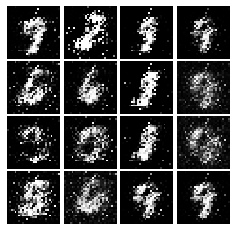

Epoch: 2, Iter: 1360, D: 1.12, G:1.275


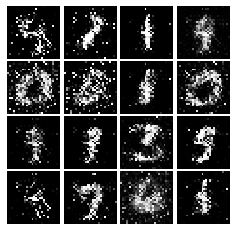

Epoch: 2, Iter: 1380, D: 1.73, G:1.376


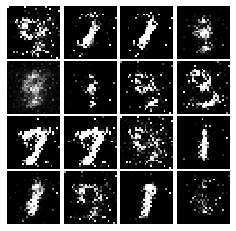

Epoch: 2, Iter: 1400, D: 1.14, G:0.9306


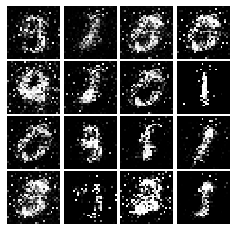

Epoch: 3, Iter: 1420, D: 1.489, G:0.4727


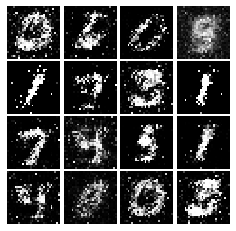

Epoch: 3, Iter: 1440, D: 1.22, G:0.92


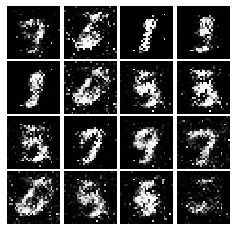

Epoch: 3, Iter: 1460, D: 1.186, G:1.002


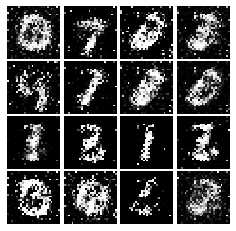

Epoch: 3, Iter: 1480, D: 1.307, G:1.237


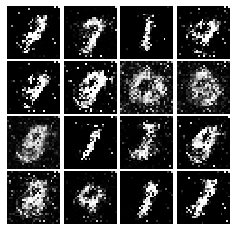

Epoch: 3, Iter: 1500, D: 1.243, G:1.07


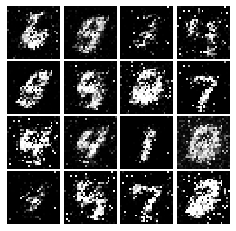

Epoch: 3, Iter: 1520, D: 1.266, G:2.186


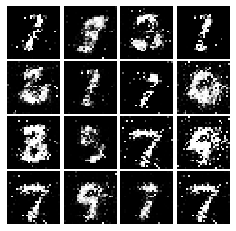

Epoch: 3, Iter: 1540, D: 1.248, G:0.9421


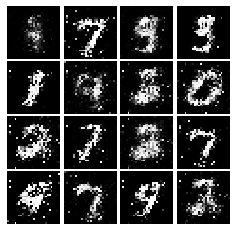

Epoch: 3, Iter: 1560, D: 1.215, G:0.9133


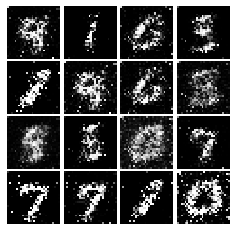

Epoch: 3, Iter: 1580, D: 1.211, G:0.9392


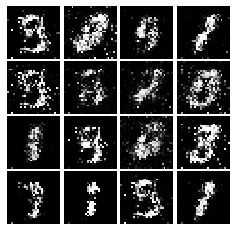

Epoch: 3, Iter: 1600, D: 1.368, G:0.9381


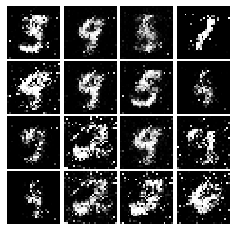

Epoch: 3, Iter: 1620, D: 1.26, G:0.9335


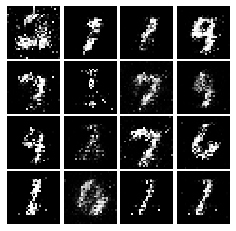

Epoch: 3, Iter: 1640, D: 1.253, G:0.8818


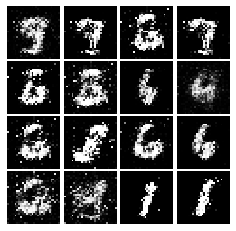

Epoch: 3, Iter: 1660, D: 1.128, G:1.323


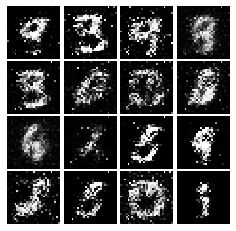

Epoch: 3, Iter: 1680, D: 1.317, G:1.063


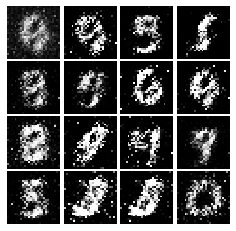

Epoch: 3, Iter: 1700, D: 1.489, G:0.7425


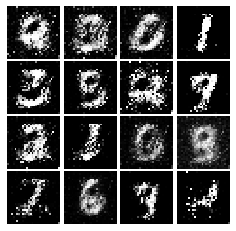

Epoch: 3, Iter: 1720, D: 1.198, G:0.8204


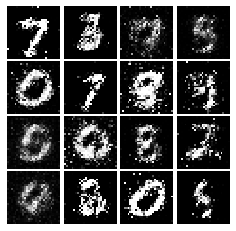

Epoch: 3, Iter: 1740, D: 1.275, G:0.825


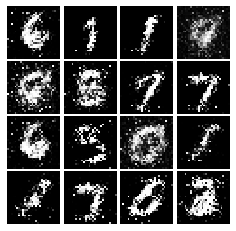

Epoch: 3, Iter: 1760, D: 1.127, G:0.8292


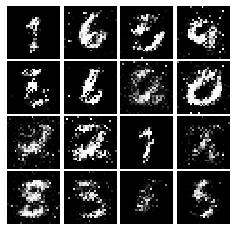

Epoch: 3, Iter: 1780, D: 1.223, G:0.8089


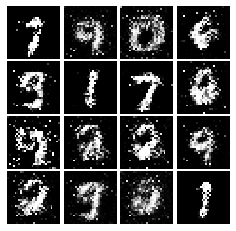

Epoch: 3, Iter: 1800, D: 1.413, G:0.8847


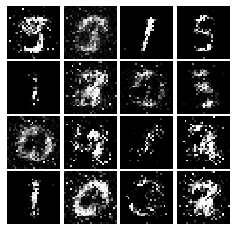

Epoch: 3, Iter: 1820, D: 1.355, G:0.811


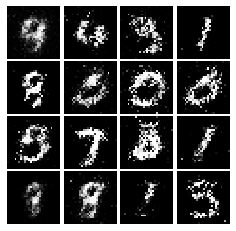

Epoch: 3, Iter: 1840, D: 1.394, G:0.9027


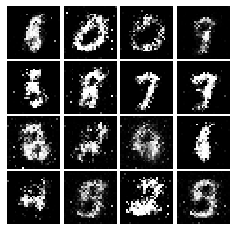

Epoch: 3, Iter: 1860, D: 1.296, G:1.011


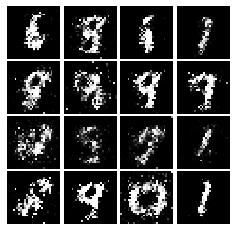

Epoch: 4, Iter: 1880, D: 1.146, G:1.041


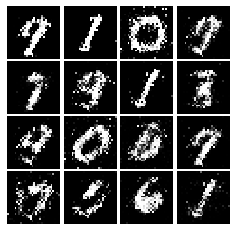

Epoch: 4, Iter: 1900, D: 1.312, G:0.8716


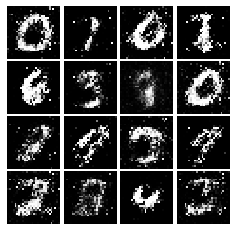

Epoch: 4, Iter: 1920, D: 1.295, G:0.9417


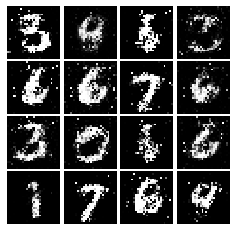

Epoch: 4, Iter: 1940, D: 1.23, G:0.8268


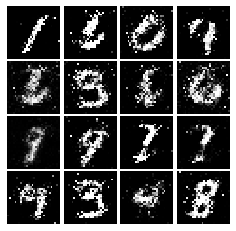

Epoch: 4, Iter: 1960, D: 1.305, G:0.8594


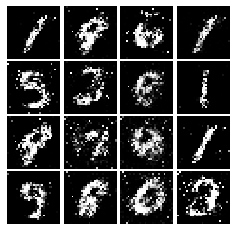

Epoch: 4, Iter: 1980, D: 1.31, G:0.9003


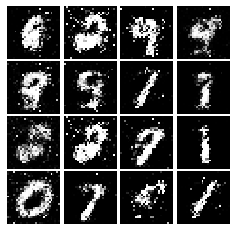

Epoch: 4, Iter: 2000, D: 1.29, G:0.8527


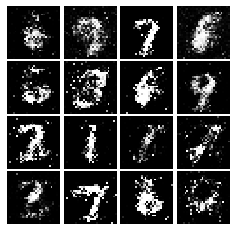

Epoch: 4, Iter: 2020, D: 1.291, G:0.8732


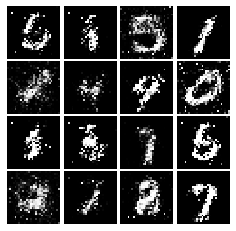

Epoch: 4, Iter: 2040, D: 1.399, G:0.8617


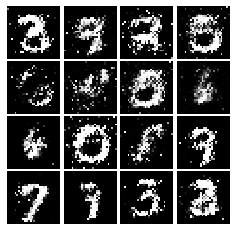

Epoch: 4, Iter: 2060, D: 1.281, G:0.8093


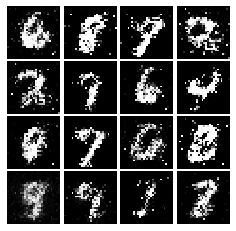

Epoch: 4, Iter: 2080, D: 1.313, G:0.8799


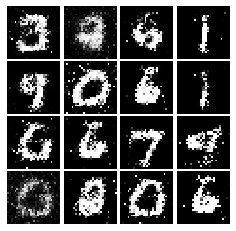

Epoch: 4, Iter: 2100, D: 1.352, G:0.8598


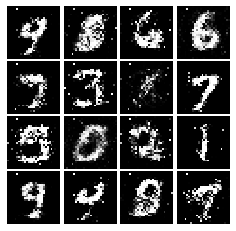

Epoch: 4, Iter: 2120, D: 1.335, G:0.7629


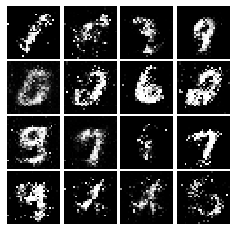

Epoch: 4, Iter: 2140, D: 1.37, G:0.6755


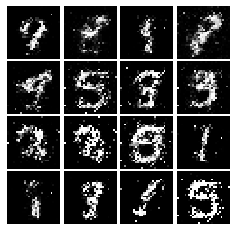

Epoch: 4, Iter: 2160, D: 1.364, G:0.8183


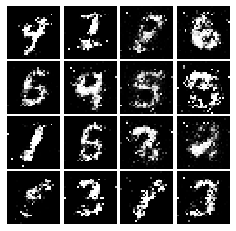

Epoch: 4, Iter: 2180, D: 1.239, G:0.8473


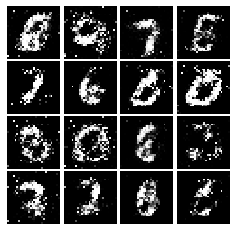

Epoch: 4, Iter: 2200, D: 1.262, G:0.922


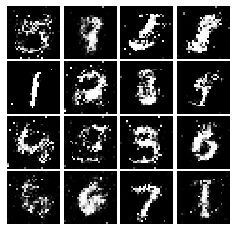

Epoch: 4, Iter: 2220, D: 1.374, G:0.8436


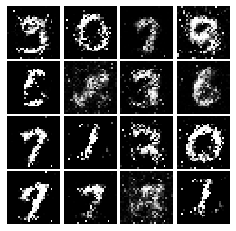

Epoch: 4, Iter: 2240, D: 1.296, G:0.9176


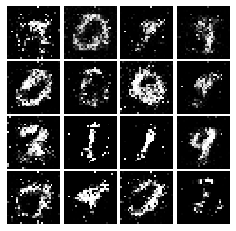

Epoch: 4, Iter: 2260, D: 1.253, G:0.9157


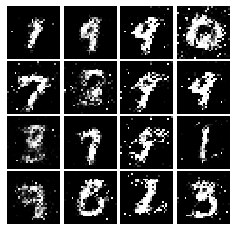

Epoch: 4, Iter: 2280, D: 1.231, G:0.9699


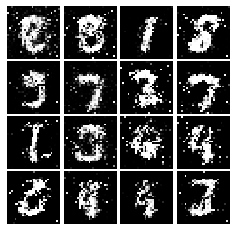

Epoch: 4, Iter: 2300, D: 1.321, G:0.9506


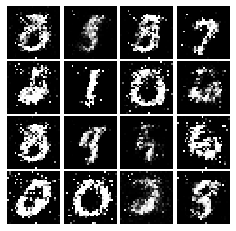

Epoch: 4, Iter: 2320, D: 1.279, G:0.9973


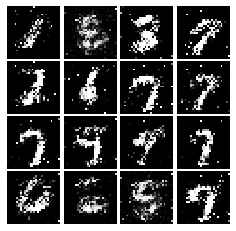

Epoch: 4, Iter: 2340, D: 1.278, G:0.904


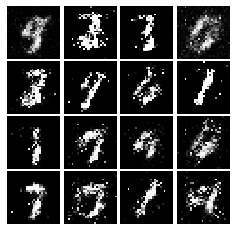

Epoch: 5, Iter: 2360, D: 1.239, G:1.012


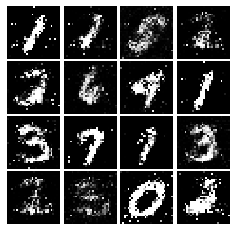

Epoch: 5, Iter: 2380, D: 1.175, G:0.9084


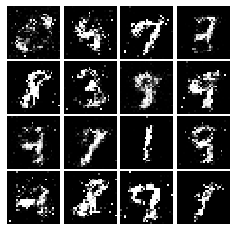

Epoch: 5, Iter: 2400, D: 1.308, G:0.9994


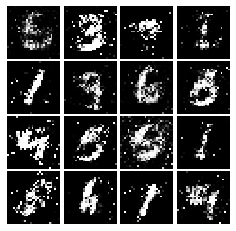

Epoch: 5, Iter: 2420, D: 1.135, G:0.9965


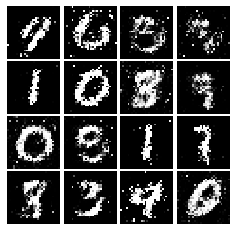

Epoch: 5, Iter: 2440, D: 1.239, G:0.7966


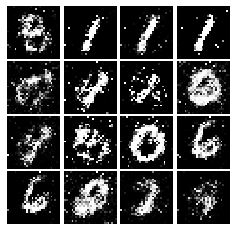

Epoch: 5, Iter: 2460, D: 1.192, G:0.9778


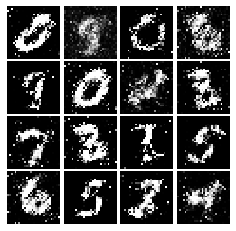

Epoch: 5, Iter: 2480, D: 1.241, G:0.8912


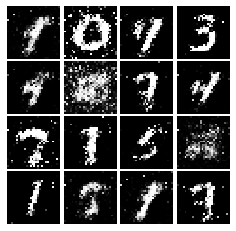

Epoch: 5, Iter: 2500, D: 1.192, G:0.9


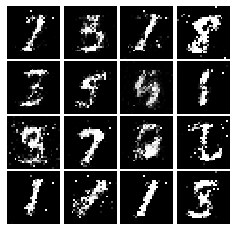

Epoch: 5, Iter: 2520, D: 1.428, G:0.8229


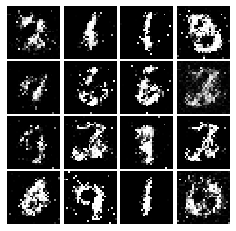

Epoch: 5, Iter: 2540, D: 1.39, G:0.8635


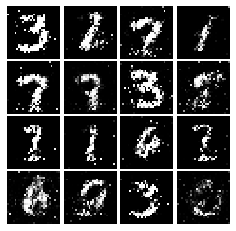

Epoch: 5, Iter: 2560, D: 1.381, G:0.9291


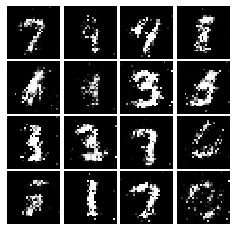

Epoch: 5, Iter: 2580, D: 1.212, G:0.9962


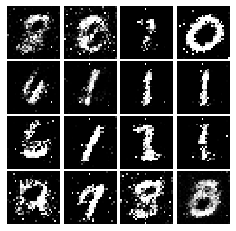

Epoch: 5, Iter: 2600, D: 1.527, G:0.6999


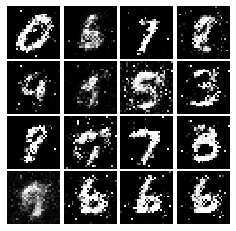

Epoch: 5, Iter: 2620, D: 1.252, G:0.952


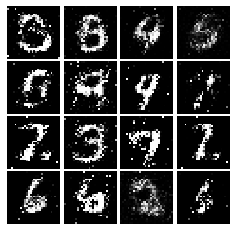

Epoch: 5, Iter: 2640, D: 1.246, G:0.8711


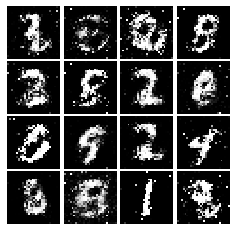

Epoch: 5, Iter: 2660, D: 1.203, G:0.8258


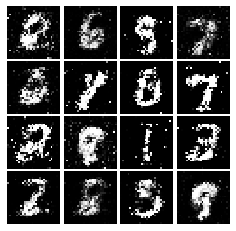

Epoch: 5, Iter: 2680, D: 1.572, G:0.8129


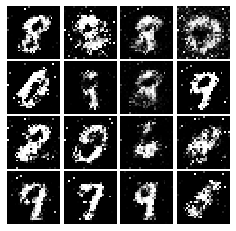

Epoch: 5, Iter: 2700, D: 1.353, G:0.8958


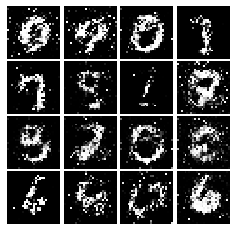

Epoch: 5, Iter: 2720, D: 1.293, G:0.8825


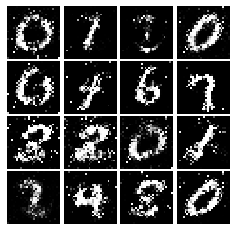

Epoch: 5, Iter: 2740, D: 1.315, G:0.795


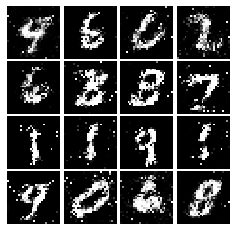

Epoch: 5, Iter: 2760, D: 1.293, G:0.7949


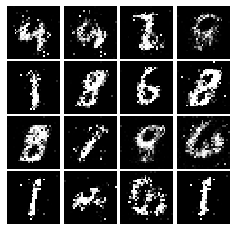

Epoch: 5, Iter: 2780, D: 1.341, G:0.8116


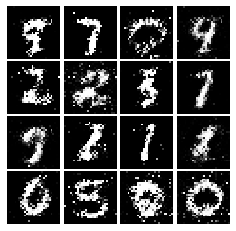

Epoch: 5, Iter: 2800, D: 1.352, G:0.8265


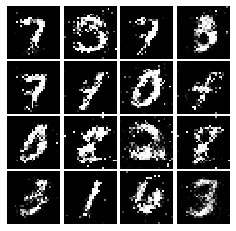

Epoch: 6, Iter: 2820, D: 1.342, G:0.9131


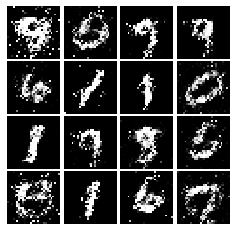

Epoch: 6, Iter: 2840, D: 1.352, G:1.045


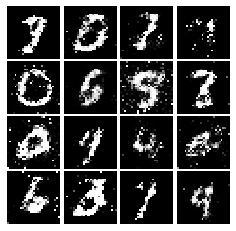

Epoch: 6, Iter: 2860, D: 1.266, G:0.8403


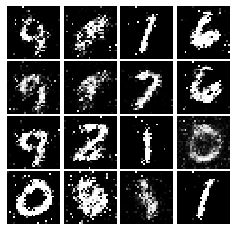

Epoch: 6, Iter: 2880, D: 1.151, G:0.831


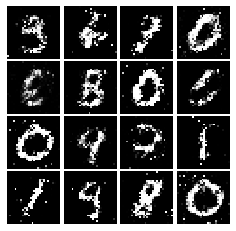

Epoch: 6, Iter: 2900, D: 1.297, G:0.8174


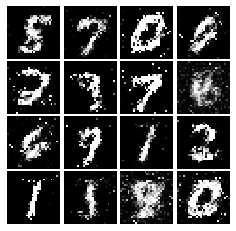

Epoch: 6, Iter: 2920, D: 1.308, G:0.8087


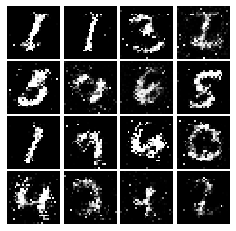

Epoch: 6, Iter: 2940, D: 1.238, G:0.9094


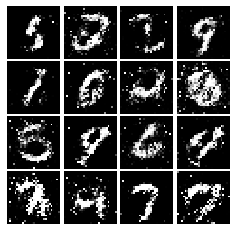

Epoch: 6, Iter: 2960, D: 1.299, G:0.7988


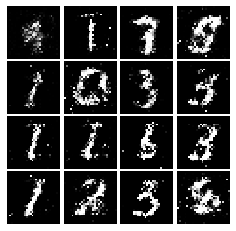

Epoch: 6, Iter: 2980, D: 1.309, G:0.842


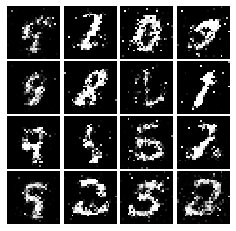

Epoch: 6, Iter: 3000, D: 1.344, G:0.8551


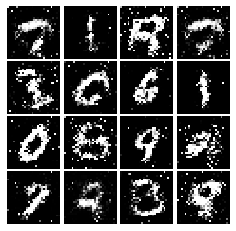

Epoch: 6, Iter: 3020, D: 1.37, G:0.8428


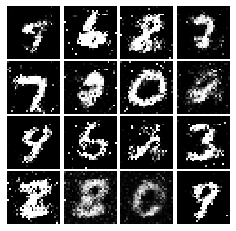

Epoch: 6, Iter: 3040, D: 1.287, G:0.8746


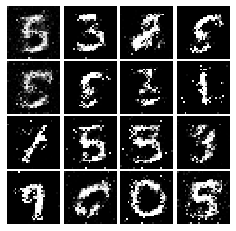

Epoch: 6, Iter: 3060, D: 1.345, G:0.8524


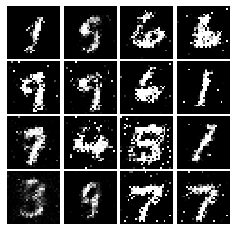

Epoch: 6, Iter: 3080, D: 1.276, G:0.8399


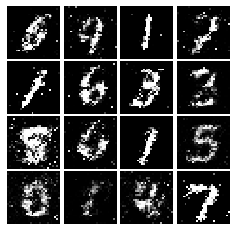

Epoch: 6, Iter: 3100, D: 1.268, G:0.7439


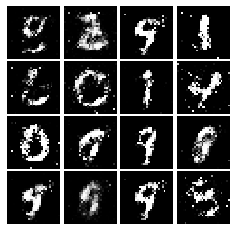

Epoch: 6, Iter: 3120, D: 1.341, G:0.8684


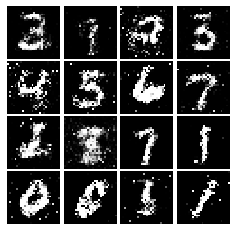

Epoch: 6, Iter: 3140, D: 1.313, G:0.9389


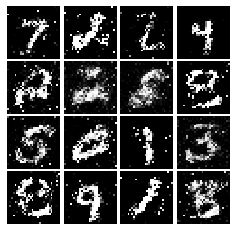

Epoch: 6, Iter: 3160, D: 1.257, G:0.881


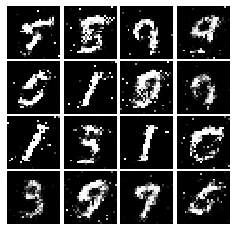

Epoch: 6, Iter: 3180, D: 1.263, G:0.8246


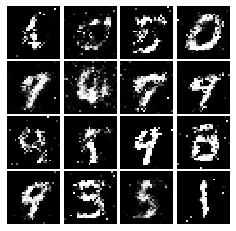

Epoch: 6, Iter: 3200, D: 1.242, G:0.8187


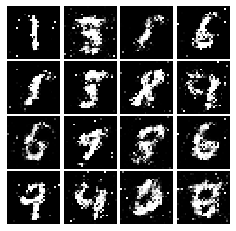

Epoch: 6, Iter: 3220, D: 1.309, G:0.7955


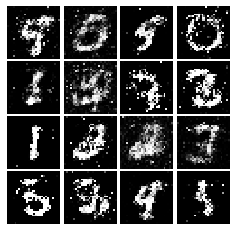

Epoch: 6, Iter: 3240, D: 1.271, G:0.855


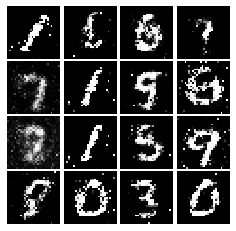

Epoch: 6, Iter: 3260, D: 1.329, G:0.8699


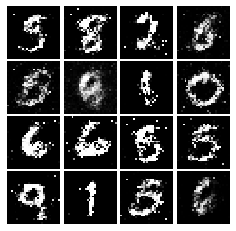

Epoch: 6, Iter: 3280, D: 1.422, G:0.7637


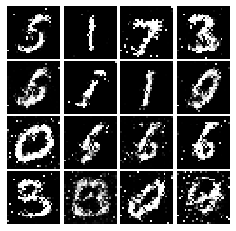

Epoch: 7, Iter: 3300, D: 1.293, G:0.9422


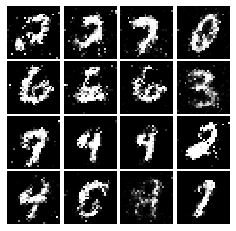

Epoch: 7, Iter: 3320, D: 1.291, G:0.8415


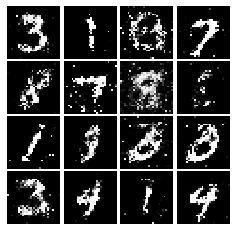

Epoch: 7, Iter: 3340, D: 1.248, G:0.9187


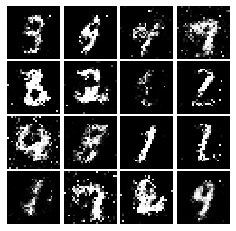

Epoch: 7, Iter: 3360, D: 1.404, G:0.7873


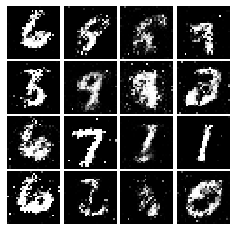

Epoch: 7, Iter: 3380, D: 1.319, G:0.7799


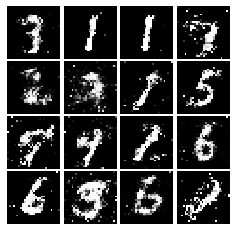

Epoch: 7, Iter: 3400, D: 1.358, G:0.8006


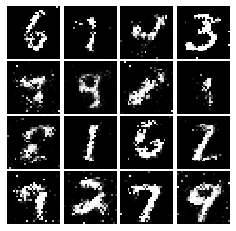

Epoch: 7, Iter: 3420, D: 1.332, G:0.836


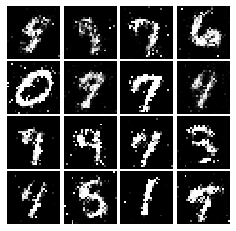

Epoch: 7, Iter: 3440, D: 1.338, G:0.828


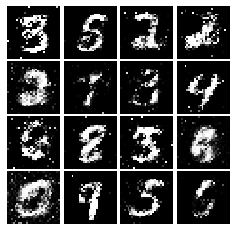

Epoch: 7, Iter: 3460, D: 1.339, G:0.7774


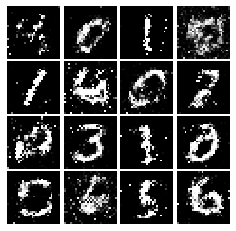

Epoch: 7, Iter: 3480, D: 1.377, G:0.7603


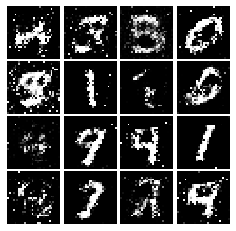

Epoch: 7, Iter: 3500, D: 1.303, G:0.8813


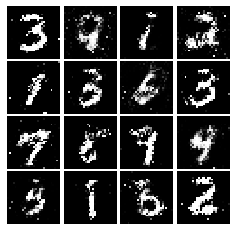

Epoch: 7, Iter: 3520, D: 1.357, G:0.8329


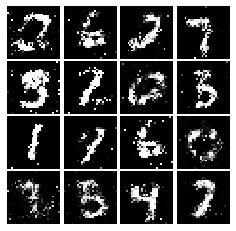

Epoch: 7, Iter: 3540, D: 1.312, G:0.8972


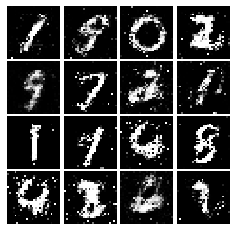

Epoch: 7, Iter: 3560, D: 1.299, G:0.8356


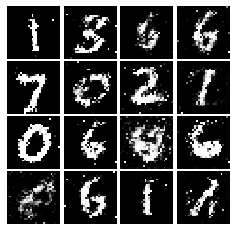

Epoch: 7, Iter: 3580, D: 1.294, G:0.8491


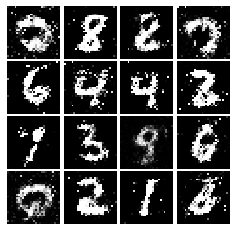

Epoch: 7, Iter: 3600, D: 1.402, G:0.9405


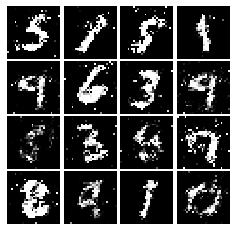

Epoch: 7, Iter: 3620, D: 1.221, G:0.8163


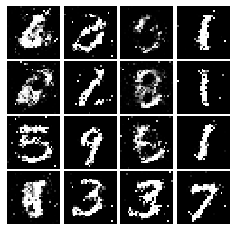

Epoch: 7, Iter: 3640, D: 1.341, G:0.8421


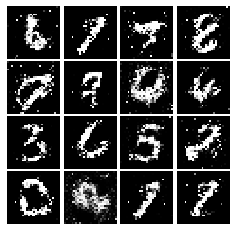

Epoch: 7, Iter: 3660, D: 1.305, G:0.8386


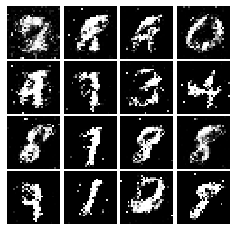

Epoch: 7, Iter: 3680, D: 1.333, G:0.8204


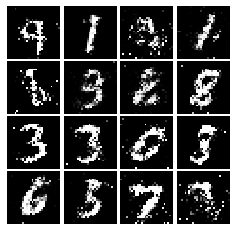

Epoch: 7, Iter: 3700, D: 1.396, G:0.8906


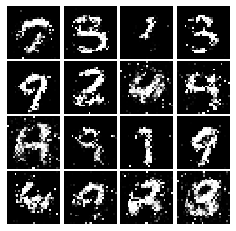

Epoch: 7, Iter: 3720, D: 1.343, G:0.8051


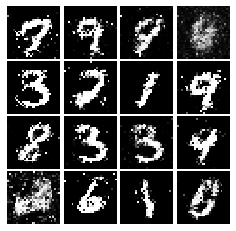

Epoch: 7, Iter: 3740, D: 1.347, G:0.7572


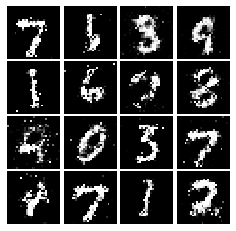

Epoch: 8, Iter: 3760, D: 1.335, G:0.8289


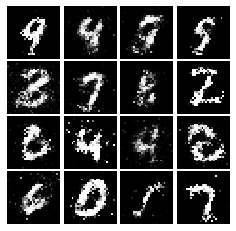

Epoch: 8, Iter: 3780, D: 1.45, G:0.8423


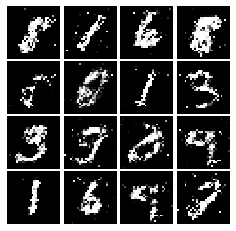

Epoch: 8, Iter: 3800, D: 1.262, G:0.8147


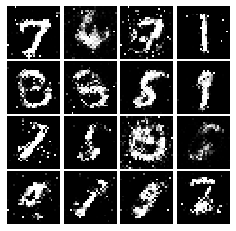

Epoch: 8, Iter: 3820, D: 1.297, G:0.9007


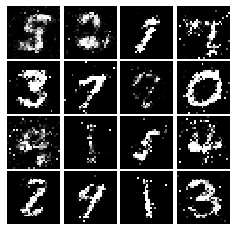

Epoch: 8, Iter: 3840, D: 1.361, G:0.8216


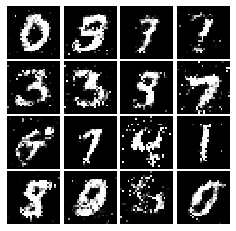

Epoch: 8, Iter: 3860, D: 1.299, G:0.7474


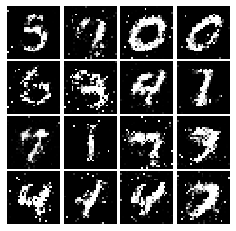

Epoch: 8, Iter: 3880, D: 1.237, G:0.919


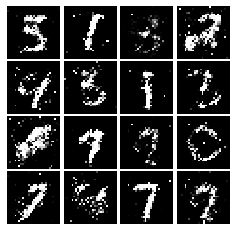

Epoch: 8, Iter: 3900, D: 1.431, G:0.8059


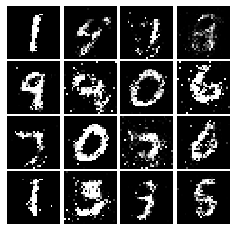

Epoch: 8, Iter: 3920, D: 1.337, G:0.8844


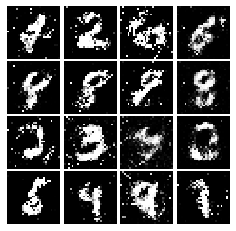

Epoch: 8, Iter: 3940, D: 1.362, G:0.8221


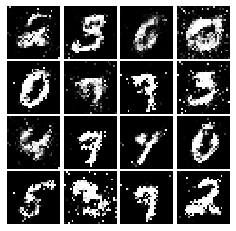

Epoch: 8, Iter: 3960, D: 1.298, G:0.7673


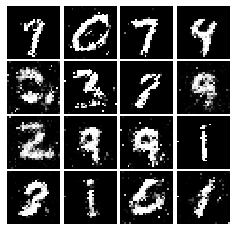

Epoch: 8, Iter: 3980, D: 1.332, G:0.8407


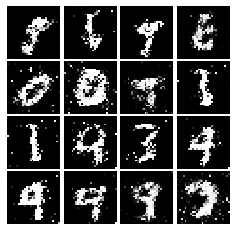

Epoch: 8, Iter: 4000, D: 1.324, G:0.808


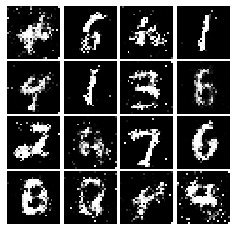

Epoch: 8, Iter: 4020, D: 1.299, G:0.804


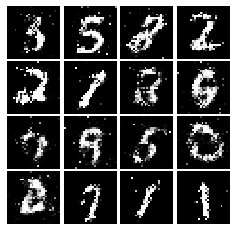

Epoch: 8, Iter: 4040, D: 1.343, G:0.8208


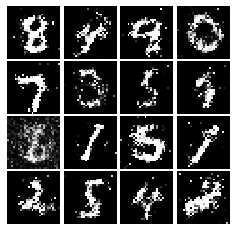

Epoch: 8, Iter: 4060, D: 1.239, G:0.8473


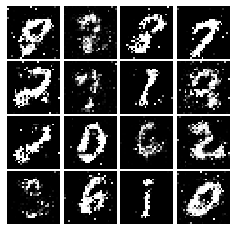

Epoch: 8, Iter: 4080, D: 1.414, G:0.9186


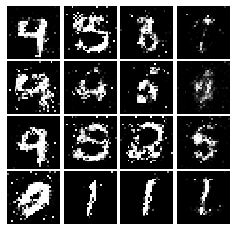

Epoch: 8, Iter: 4100, D: 1.309, G:0.8453


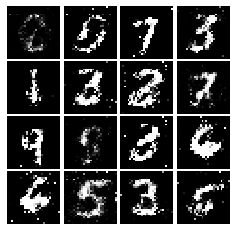

Epoch: 8, Iter: 4120, D: 1.266, G:0.8535


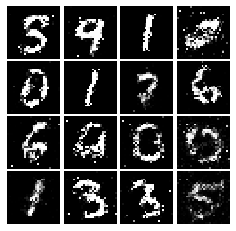

Epoch: 8, Iter: 4140, D: 1.32, G:0.8346


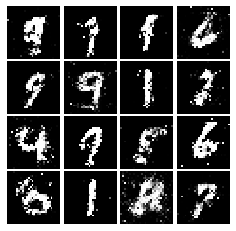

Epoch: 8, Iter: 4160, D: 1.271, G:0.8292


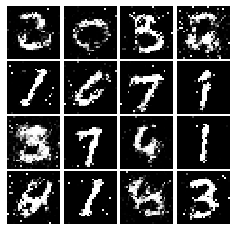

Epoch: 8, Iter: 4180, D: 1.418, G:0.8179


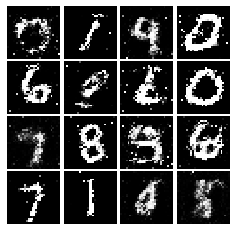

Epoch: 8, Iter: 4200, D: 1.243, G:0.9079


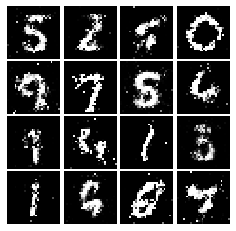

Epoch: 8, Iter: 4220, D: 1.348, G:0.8306


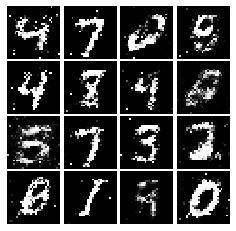

Epoch: 9, Iter: 4240, D: 1.331, G:0.7872


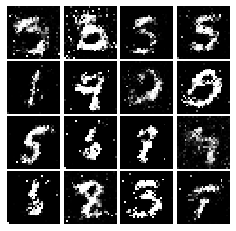

Epoch: 9, Iter: 4260, D: 1.423, G:0.7476


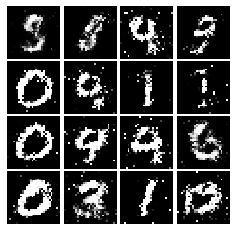

Epoch: 9, Iter: 4280, D: 1.418, G:0.7743


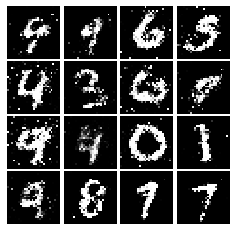

Epoch: 9, Iter: 4300, D: 1.338, G:0.7531


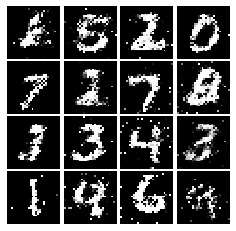

Epoch: 9, Iter: 4320, D: 1.304, G:0.7897


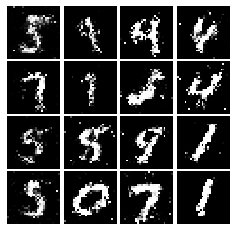

Epoch: 9, Iter: 4340, D: 1.251, G:0.8477


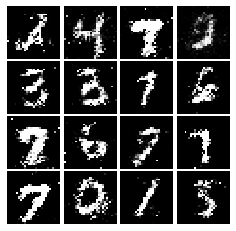

Epoch: 9, Iter: 4360, D: 1.364, G:0.7983


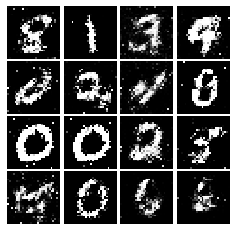

Epoch: 9, Iter: 4380, D: 1.449, G:0.7317


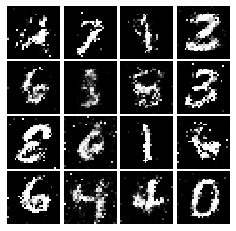

Epoch: 9, Iter: 4400, D: 1.278, G:0.8355


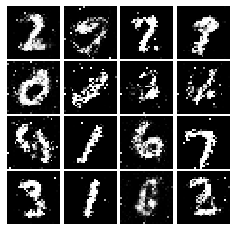

Epoch: 9, Iter: 4420, D: 1.265, G:0.7795


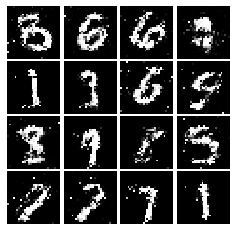

Epoch: 9, Iter: 4440, D: 1.333, G:0.7838


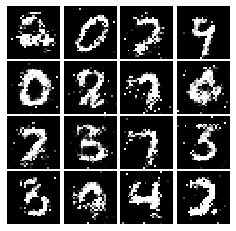

Epoch: 9, Iter: 4460, D: 1.301, G:0.7222


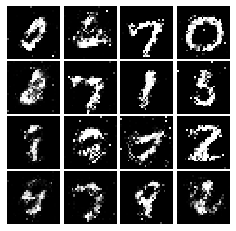

Epoch: 9, Iter: 4480, D: 1.289, G:0.8613


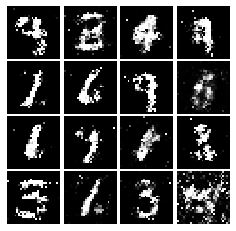

Epoch: 9, Iter: 4500, D: 1.36, G:0.769


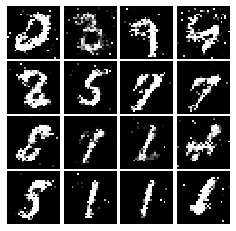

Epoch: 9, Iter: 4520, D: 1.336, G:0.8609


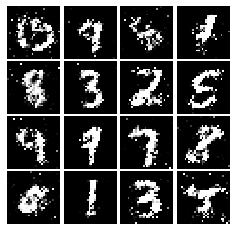

Epoch: 9, Iter: 4540, D: 1.338, G:0.7783


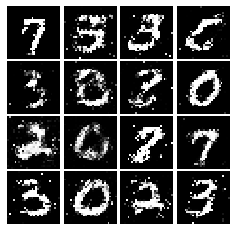

Epoch: 9, Iter: 4560, D: 1.33, G:0.7899


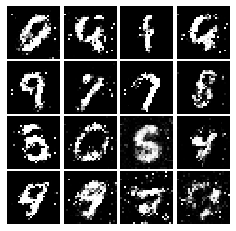

Epoch: 9, Iter: 4580, D: 1.309, G:0.7957


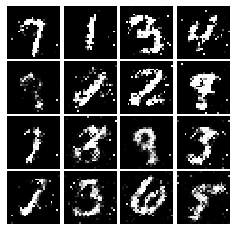

Epoch: 9, Iter: 4600, D: 1.334, G:0.7999


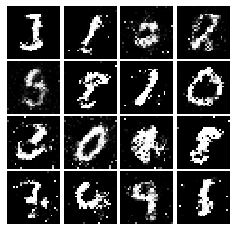

Epoch: 9, Iter: 4620, D: 1.305, G:0.7235


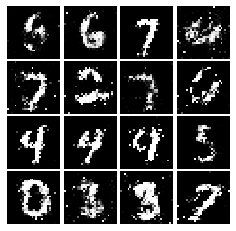

Epoch: 9, Iter: 4640, D: 1.296, G:0.9177


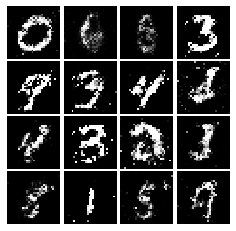

Epoch: 9, Iter: 4660, D: 1.316, G:0.7241


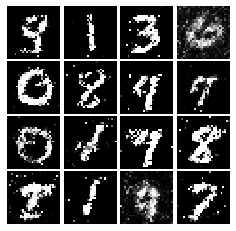

Epoch: 9, Iter: 4680, D: 1.28, G:0.8022


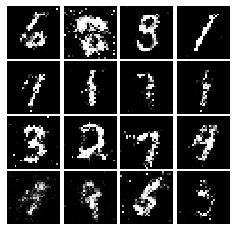

Final images


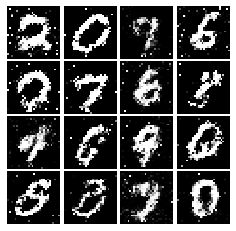

In [11]:
D = discriminator()
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver = tf.keras.optimizers.Adam(learning_rate=1e-3, beta_1=0.5, beta_2=0.999)
G_solver = tf.keras.optimizers.Adam(learning_rate=1e-3, beta_1=0.5, beta_2=0.999)
    
# Run it!
train(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

## Section 1.2 Least-square GAN Loss
### Section 1.2.1 LSGAN Loss [10 pts]
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alernative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$
Fill in the `ls_discriminator_loss` and `ls_generator_loss` in the cell below.

**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`scores_real` and `scores_fake`).

In [0]:
def ls_discriminator_loss(logits_real, logits_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.

    Inputs:
    - logits_real: Tensor of shape (N,) giving scores for the real data.
    - logits_fake: Tensor of shape (N,) giving scores for the fake data.
    - N is the Batch size
 
    Outputs:
    - loss: A Tensor containing the loss.
    """
 
    loss = None
    
    ####################################
    # your code here. 
    ####################################
    loss = 0.5*tf.reduce_mean(tf.pow(logits_real-1,2)) + 0.5*tf.reduce_mean(tf.pow(logits_fake,2))

    ##########       END      ##########
    return loss

def ls_generator_loss(logits_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
 
    Inputs:
    - logits_fake: TensorFlow Tensor of shape (N,) giving scores for the fake data.
 
    Outputs:
    - loss: A TensorFlow Tensor containing the loss.
    """

    loss = None
 
    ####################################
    #          YOUR CODE HERE          #
    ####################################
    loss = 0.5*tf.reduce_mean(tf.pow(logits_fake-1,2))
    
    ##########       END      ##########
    return loss    

### Section 1.2.2 Train LSGAN [5 pts]
Similarly, train your LSGAN on MNIST dataset. You should expect results that resemble the following if your loss function and training loop implementations are correct:

<img src="files/gan_samples/mnist_ls.jpg" width=300>

<bound method Network.summary of <tensorflow.python.keras.engine.sequential.Sequential object at 0x7f1db0038588>>
Epoch: 0, Iter: 0, D: 1.284, G:0.418
Instructions for updating:
Use tf.identity instead.


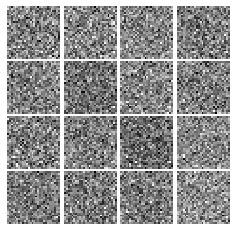

Epoch: 0, Iter: 20, D: 0.143, G:1.083


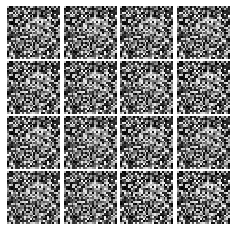

Epoch: 0, Iter: 40, D: 0.04876, G:1.09


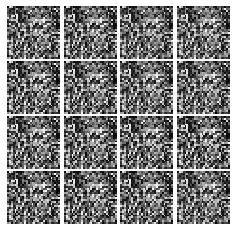

Epoch: 0, Iter: 60, D: 0.01146, G:0.5902


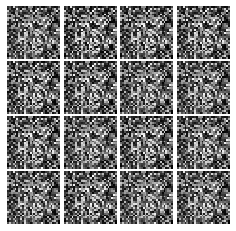

Epoch: 0, Iter: 80, D: 0.03455, G:0.5112


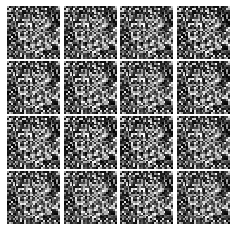

Epoch: 0, Iter: 100, D: 0.1315, G:1.004


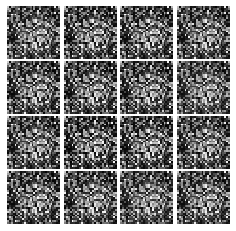

Epoch: 0, Iter: 120, D: 0.7451, G:0.01571


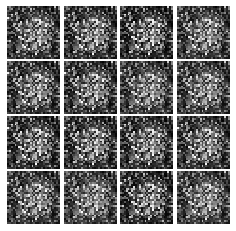

Epoch: 0, Iter: 140, D: 0.6204, G:0.3317


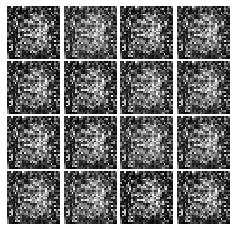

Epoch: 0, Iter: 160, D: 0.1107, G:0.8349


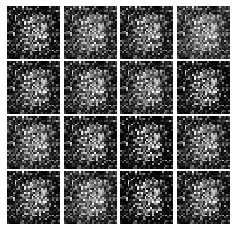

Epoch: 0, Iter: 180, D: 0.1955, G:0.1077


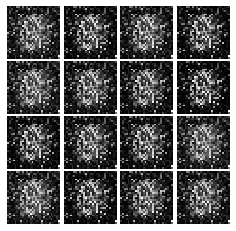

Epoch: 0, Iter: 200, D: 0.1184, G:0.5568


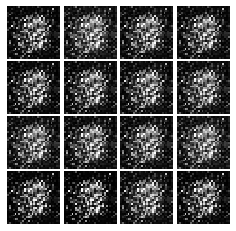

Epoch: 0, Iter: 220, D: 0.7274, G:0.6182


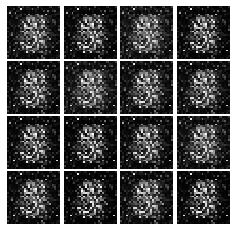

Epoch: 0, Iter: 240, D: 0.1438, G:0.4464


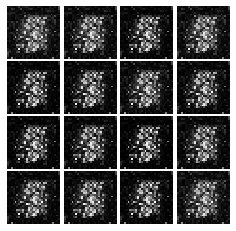

Epoch: 0, Iter: 260, D: 0.4159, G:0.1183


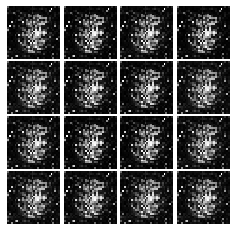

Epoch: 0, Iter: 280, D: 0.1271, G:0.2052


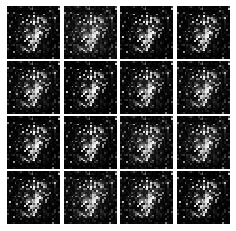

Epoch: 0, Iter: 300, D: 0.1501, G:0.5051


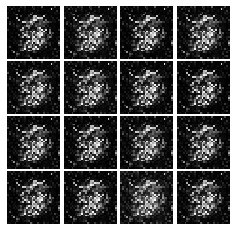

Epoch: 0, Iter: 320, D: 0.1474, G:0.2938


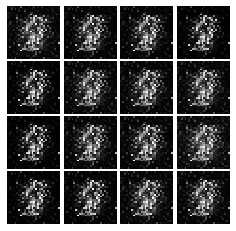

Epoch: 0, Iter: 340, D: 0.2217, G:0.3198


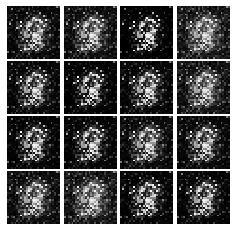

Epoch: 0, Iter: 360, D: 0.1219, G:0.3965


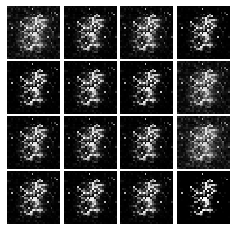

Epoch: 0, Iter: 380, D: 0.1225, G:0.6445


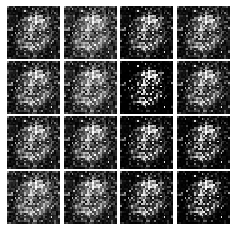

Epoch: 0, Iter: 400, D: 0.2967, G:0.4942


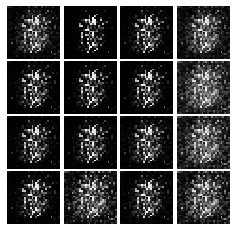

Epoch: 0, Iter: 420, D: 0.253, G:0.6792


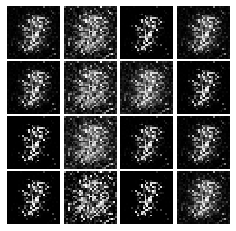

Epoch: 0, Iter: 440, D: 0.15, G:0.3788


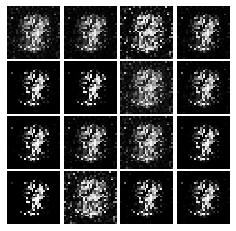

Epoch: 0, Iter: 460, D: 0.1878, G:0.2663


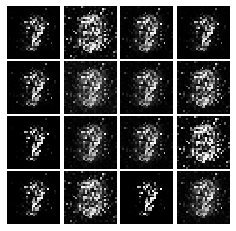

Epoch: 1, Iter: 480, D: 0.1346, G:0.163


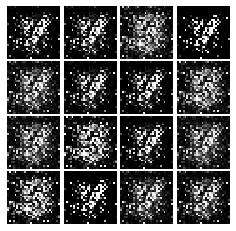

Epoch: 1, Iter: 500, D: 0.09668, G:0.5812


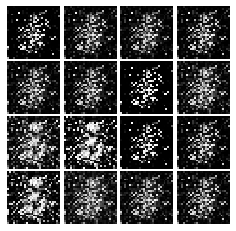

Epoch: 1, Iter: 520, D: 0.108, G:0.3523


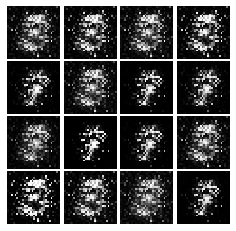

Epoch: 1, Iter: 540, D: 0.2095, G:0.8952


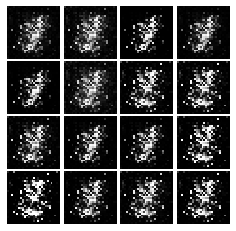

Epoch: 1, Iter: 560, D: 0.1721, G:0.341


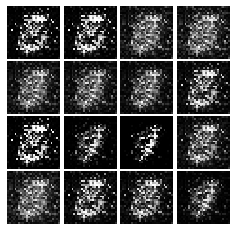

Epoch: 1, Iter: 580, D: 0.08847, G:0.3048


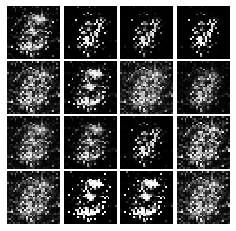

Epoch: 1, Iter: 600, D: 0.2395, G:0.2206


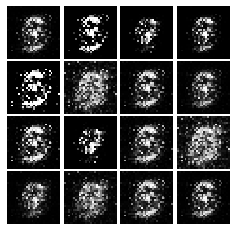

Epoch: 1, Iter: 620, D: 0.1416, G:0.1934


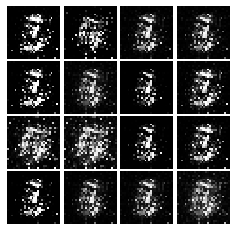

Epoch: 1, Iter: 640, D: 0.1225, G:0.438


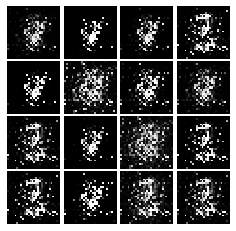

Epoch: 1, Iter: 660, D: 0.1511, G:0.2688


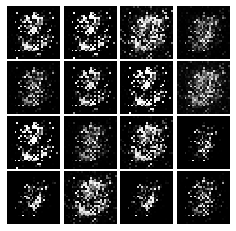

Epoch: 1, Iter: 680, D: 0.06334, G:0.4514


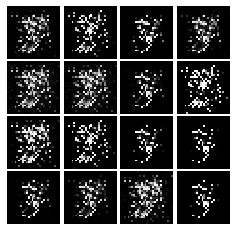

Epoch: 1, Iter: 700, D: 0.0961, G:0.3624


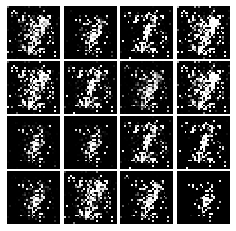

Epoch: 1, Iter: 720, D: 0.2286, G:0.3774


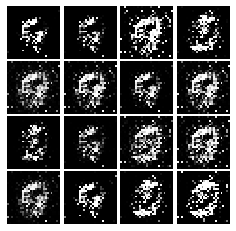

Epoch: 1, Iter: 740, D: 0.2356, G:0.06629


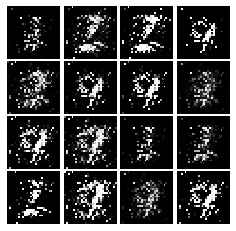

Epoch: 1, Iter: 760, D: 0.1504, G:0.5947


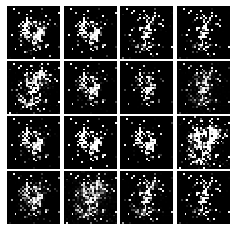

Epoch: 1, Iter: 780, D: 0.1141, G:0.4403


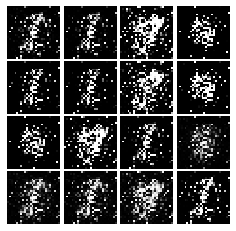

Epoch: 1, Iter: 800, D: 0.09062, G:1.308


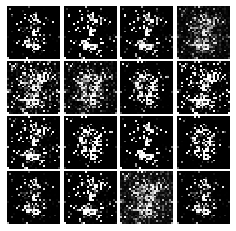

Epoch: 1, Iter: 820, D: 0.1508, G:0.3844


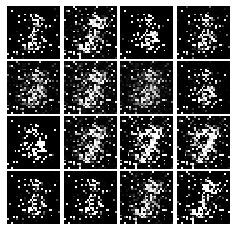

Epoch: 1, Iter: 840, D: 0.1942, G:0.04474


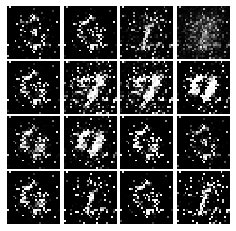

Epoch: 1, Iter: 860, D: 0.1759, G:0.3583


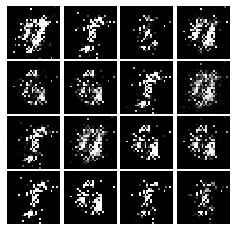

Epoch: 1, Iter: 880, D: 0.06621, G:0.8566


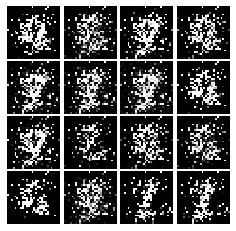

Epoch: 1, Iter: 900, D: 0.0969, G:0.05633


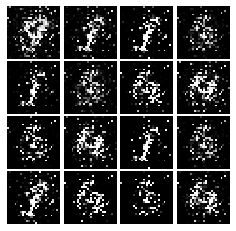

Epoch: 1, Iter: 920, D: 0.08182, G:0.6244


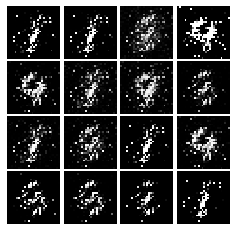

Epoch: 2, Iter: 940, D: 0.1379, G:0.4255


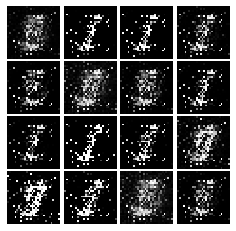

Epoch: 2, Iter: 960, D: 0.1341, G:0.4517


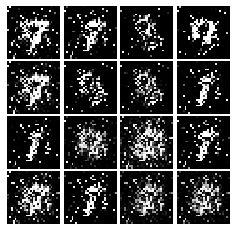

Epoch: 2, Iter: 980, D: 0.1164, G:0.5572


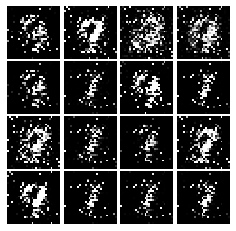

Epoch: 2, Iter: 1000, D: 0.1497, G:0.433


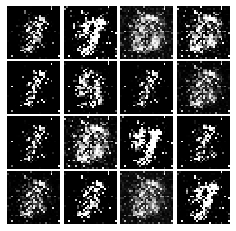

Epoch: 2, Iter: 1020, D: 0.4174, G:0.09661


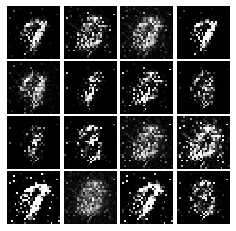

Epoch: 2, Iter: 1040, D: 0.09539, G:0.326


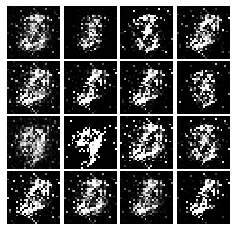

Epoch: 2, Iter: 1060, D: 0.1531, G:0.08626


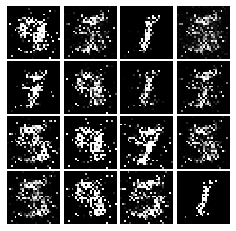

Epoch: 2, Iter: 1080, D: 0.2946, G:0.3949


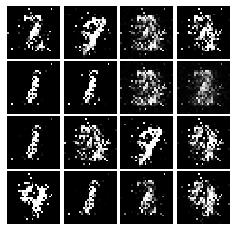

Epoch: 2, Iter: 1100, D: 0.1385, G:0.1762


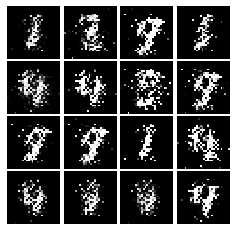

Epoch: 2, Iter: 1120, D: 0.1209, G:0.5629


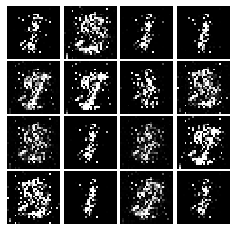

Epoch: 2, Iter: 1140, D: 0.1236, G:0.2862


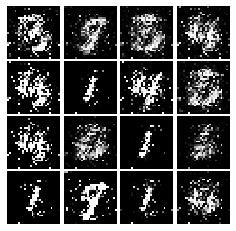

Epoch: 2, Iter: 1160, D: 0.1385, G:0.2949


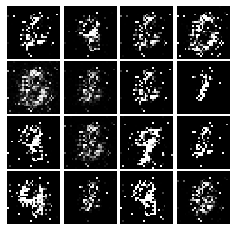

Epoch: 2, Iter: 1180, D: 0.1643, G:0.2805


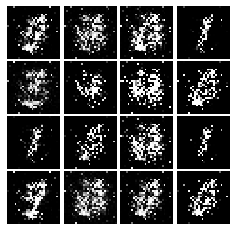

Epoch: 2, Iter: 1200, D: 0.1992, G:0.3587


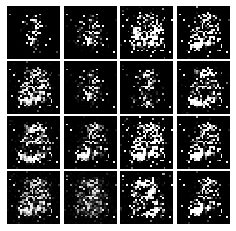

Epoch: 2, Iter: 1220, D: 0.1298, G:0.2331


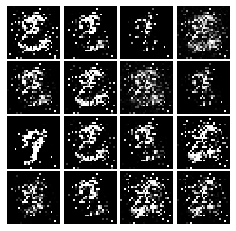

Epoch: 2, Iter: 1240, D: 0.1621, G:0.227


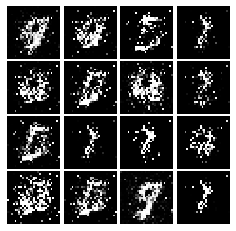

Epoch: 2, Iter: 1260, D: 0.1594, G:0.3036


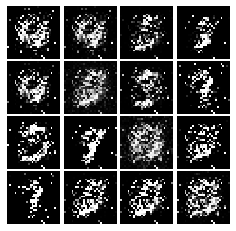

Epoch: 2, Iter: 1280, D: 0.1794, G:0.206


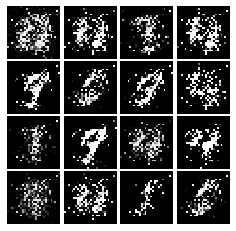

Epoch: 2, Iter: 1300, D: 0.1127, G:0.8231


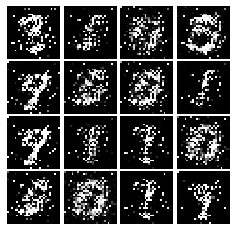

Epoch: 2, Iter: 1320, D: 0.4412, G:0.08277


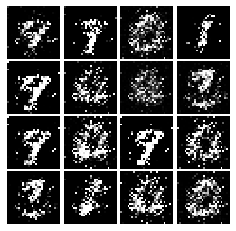

Epoch: 2, Iter: 1340, D: 0.2438, G:0.4076


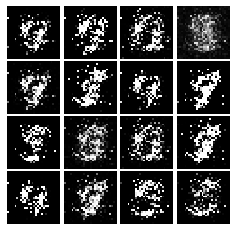

Epoch: 2, Iter: 1360, D: 0.1859, G:0.2693


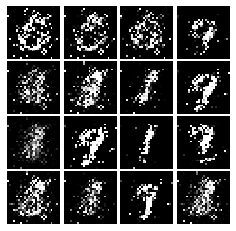

Epoch: 2, Iter: 1380, D: 0.1789, G:0.2191


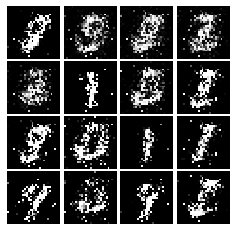

Epoch: 2, Iter: 1400, D: 0.162, G:0.283


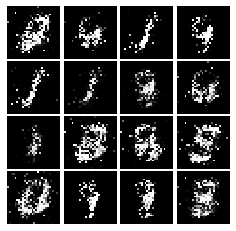

Epoch: 3, Iter: 1420, D: 0.1519, G:0.3561


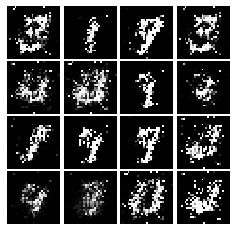

Epoch: 3, Iter: 1440, D: 0.1406, G:0.2761


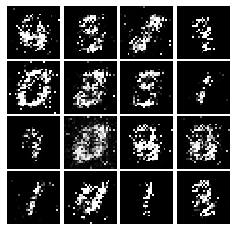

Epoch: 3, Iter: 1460, D: 0.1903, G:0.1909


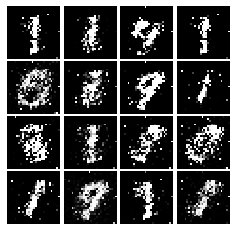

Epoch: 3, Iter: 1480, D: 0.1724, G:0.3029


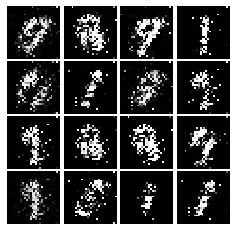

Epoch: 3, Iter: 1500, D: 0.1762, G:0.2739


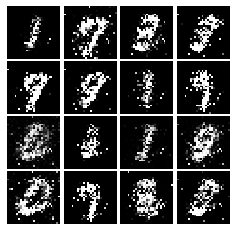

Epoch: 3, Iter: 1520, D: 0.1476, G:0.3836


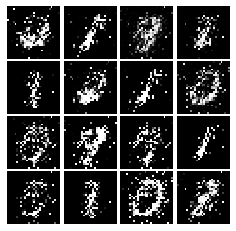

Epoch: 3, Iter: 1540, D: 0.153, G:0.3599


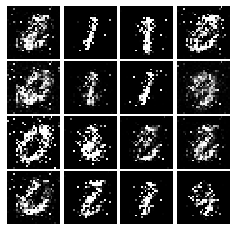

Epoch: 3, Iter: 1560, D: 0.1998, G:0.2465


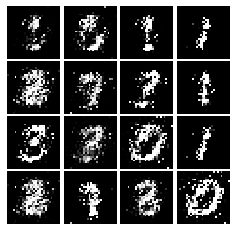

Epoch: 3, Iter: 1580, D: 0.1585, G:0.4428


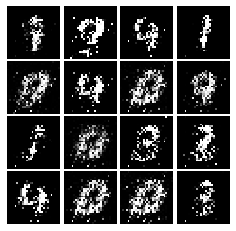

Epoch: 3, Iter: 1600, D: 0.1811, G:0.209


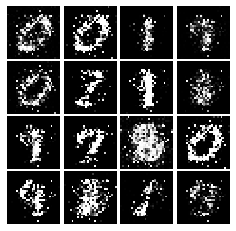

Epoch: 3, Iter: 1620, D: 0.1902, G:0.2428


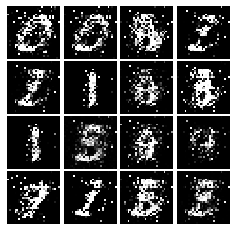

Epoch: 3, Iter: 1640, D: 0.1771, G:0.2533


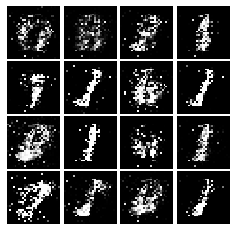

Epoch: 3, Iter: 1660, D: 0.1486, G:0.2849


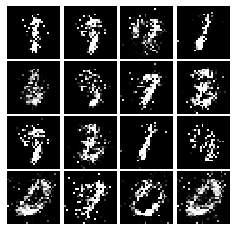

Epoch: 3, Iter: 1680, D: 0.1913, G:0.2153


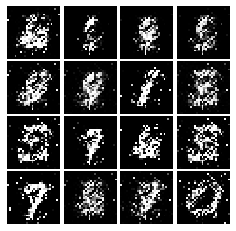

Epoch: 3, Iter: 1700, D: 0.1638, G:0.314


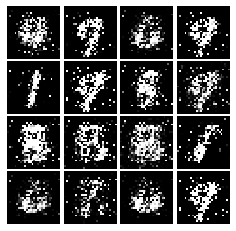

Epoch: 3, Iter: 1720, D: 0.1575, G:0.2323


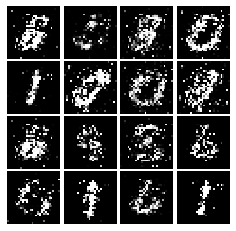

Epoch: 3, Iter: 1740, D: 0.1592, G:0.2601


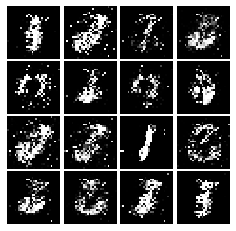

Epoch: 3, Iter: 1760, D: 0.1723, G:0.2821


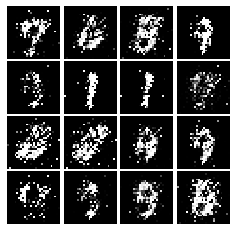

Epoch: 3, Iter: 1780, D: 0.1846, G:0.2604


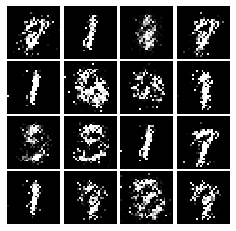

Epoch: 3, Iter: 1800, D: 0.1819, G:0.2262


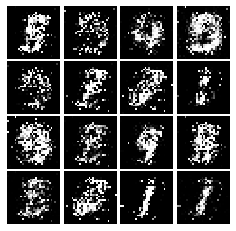

Epoch: 3, Iter: 1820, D: 0.229, G:0.1875


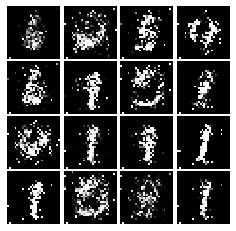

Epoch: 3, Iter: 1840, D: 0.2179, G:0.2182


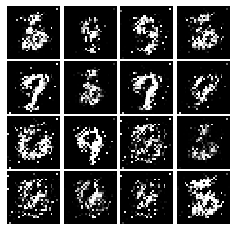

Epoch: 3, Iter: 1860, D: 0.1923, G:0.226


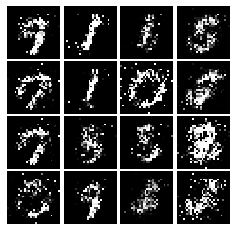

Epoch: 4, Iter: 1880, D: 0.1744, G:0.3325


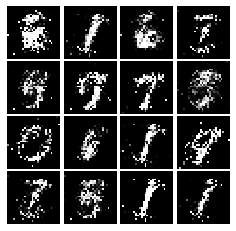

Epoch: 4, Iter: 1900, D: 0.2065, G:0.6096


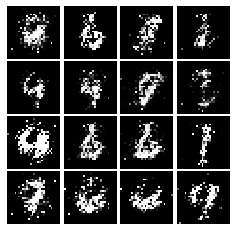

Epoch: 4, Iter: 1920, D: 0.2001, G:0.1789


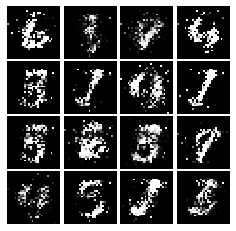

Epoch: 4, Iter: 1940, D: 0.2015, G:0.1872


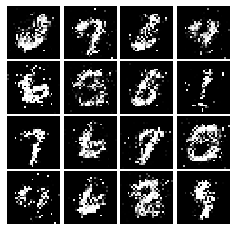

Epoch: 4, Iter: 1960, D: 0.2046, G:0.1874


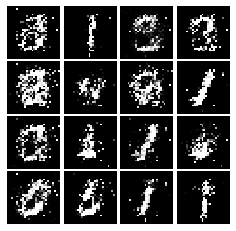

Epoch: 4, Iter: 1980, D: 0.2036, G:0.206


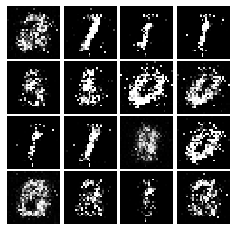

Epoch: 4, Iter: 2000, D: 0.2163, G:0.2031


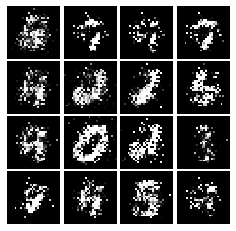

Epoch: 4, Iter: 2020, D: 0.2307, G:0.2716


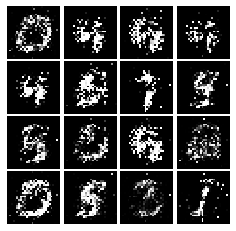

Epoch: 4, Iter: 2040, D: 0.2234, G:0.23


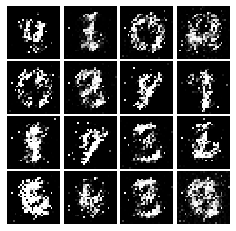

Epoch: 4, Iter: 2060, D: 0.2413, G:0.2076


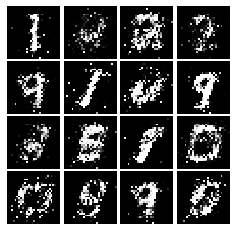

Epoch: 4, Iter: 2080, D: 0.2369, G:0.2166


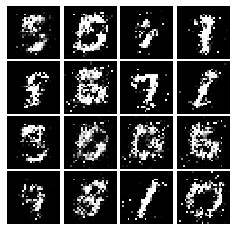

Epoch: 4, Iter: 2100, D: 0.213, G:0.1907


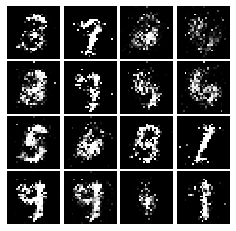

Epoch: 4, Iter: 2120, D: 0.2256, G:0.1933


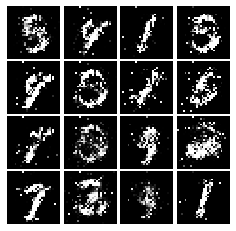

Epoch: 4, Iter: 2140, D: 0.185, G:0.5299


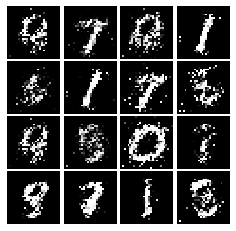

Epoch: 4, Iter: 2160, D: 0.2103, G:0.1851


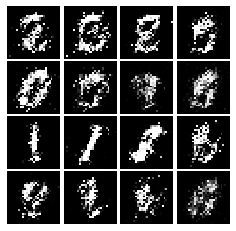

Epoch: 4, Iter: 2180, D: 0.2435, G:0.1857


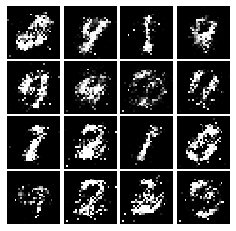

Epoch: 4, Iter: 2200, D: 0.1989, G:0.1883


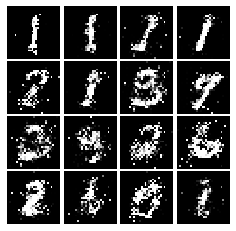

Epoch: 4, Iter: 2220, D: 0.2504, G:0.1973


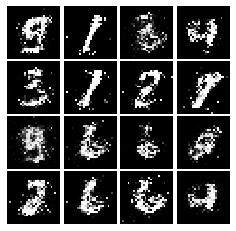

Epoch: 4, Iter: 2240, D: 0.201, G:0.2071


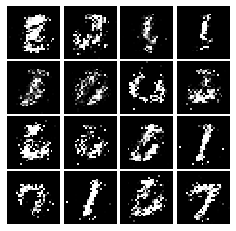

Epoch: 4, Iter: 2260, D: 0.2212, G:0.1807


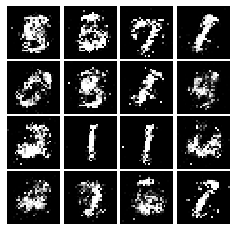

Epoch: 4, Iter: 2280, D: 0.2815, G:0.2273


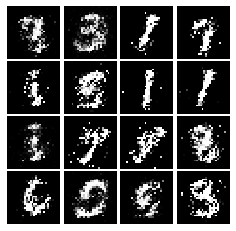

Epoch: 4, Iter: 2300, D: 0.202, G:0.2097


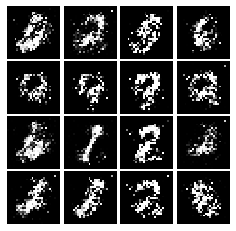

Epoch: 4, Iter: 2320, D: 0.1898, G:0.2068


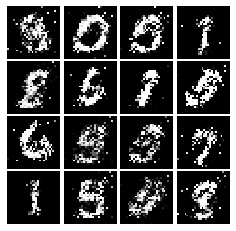

Epoch: 4, Iter: 2340, D: 0.2033, G:0.2289


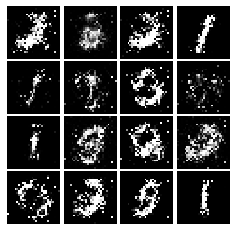

Epoch: 5, Iter: 2360, D: 0.2077, G:0.2318


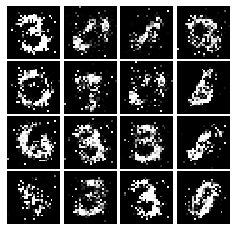

Epoch: 5, Iter: 2380, D: 0.2001, G:0.1827


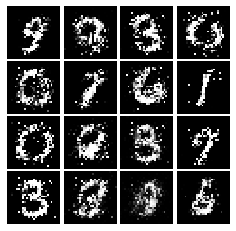

Epoch: 5, Iter: 2400, D: 0.2253, G:0.1689


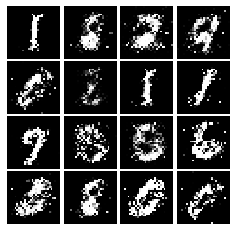

Epoch: 5, Iter: 2420, D: 0.215, G:0.1946


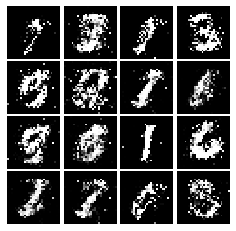

Epoch: 5, Iter: 2440, D: 0.21, G:0.1824


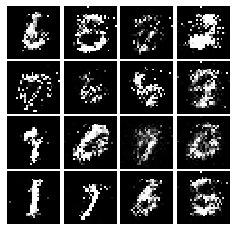

Epoch: 5, Iter: 2460, D: 0.2439, G:0.2107


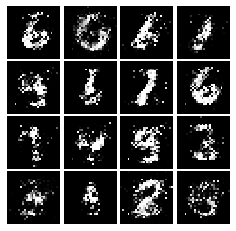

Epoch: 5, Iter: 2480, D: 0.2261, G:0.1675


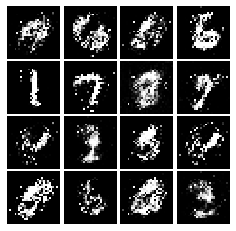

Epoch: 5, Iter: 2500, D: 0.2146, G:0.2211


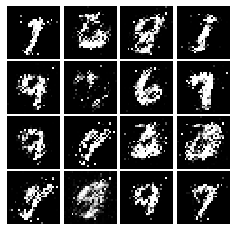

Epoch: 5, Iter: 2520, D: 0.2582, G:0.1486


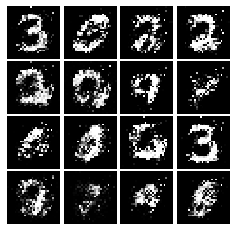

Epoch: 5, Iter: 2540, D: 0.2322, G:0.1769


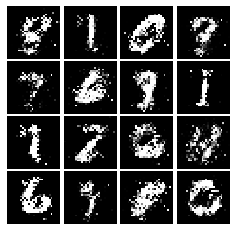

Epoch: 5, Iter: 2560, D: 0.2074, G:0.1496


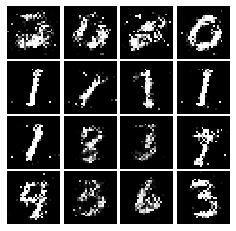

Epoch: 5, Iter: 2580, D: 0.2092, G:0.1794


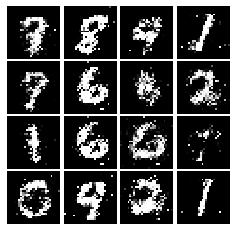

Epoch: 5, Iter: 2600, D: 0.2499, G:0.1743


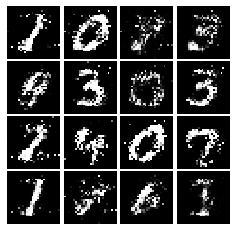

Epoch: 5, Iter: 2620, D: 0.2272, G:0.1522


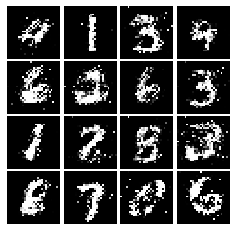

Epoch: 5, Iter: 2640, D: 0.2335, G:0.1655


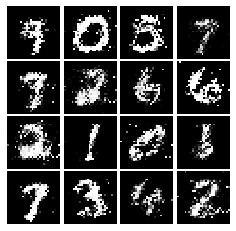

Epoch: 5, Iter: 2660, D: 0.2306, G:0.153


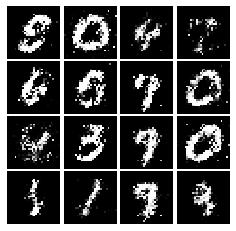

Epoch: 5, Iter: 2680, D: 0.2592, G:0.1357


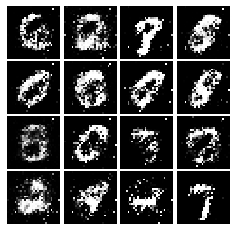

Epoch: 5, Iter: 2700, D: 0.2287, G:0.1656


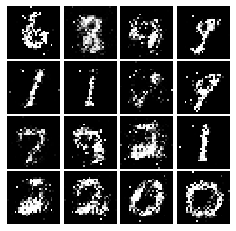

Epoch: 5, Iter: 2720, D: 0.212, G:0.1808


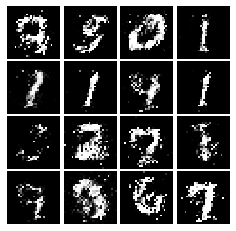

Epoch: 5, Iter: 2740, D: 0.2346, G:0.1567


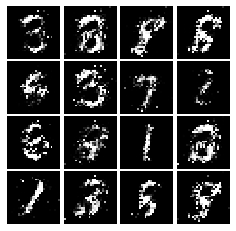

Epoch: 5, Iter: 2760, D: 0.2368, G:0.1753


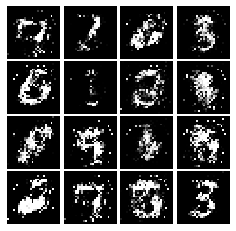

Epoch: 5, Iter: 2780, D: 0.2415, G:0.1696


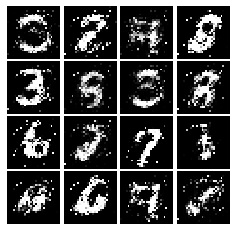

Epoch: 5, Iter: 2800, D: 0.2211, G:0.1782


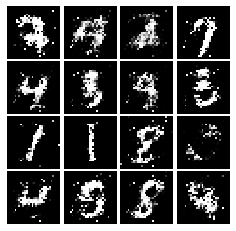

Epoch: 6, Iter: 2820, D: 0.239, G:0.1388


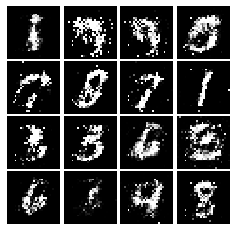

Epoch: 6, Iter: 2840, D: 0.2377, G:0.1642


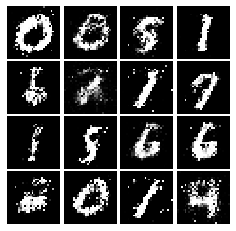

Epoch: 6, Iter: 2860, D: 0.2272, G:0.171


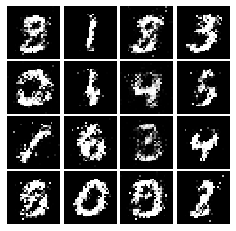

Epoch: 6, Iter: 2880, D: 0.2109, G:0.1492


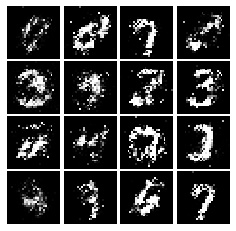

Epoch: 6, Iter: 2900, D: 0.2263, G:0.1529


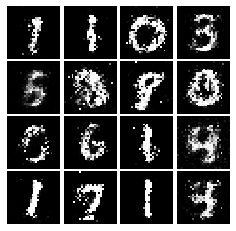

Epoch: 6, Iter: 2920, D: 0.2336, G:0.1667


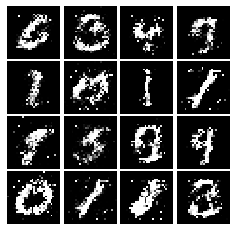

Epoch: 6, Iter: 2940, D: 0.2266, G:0.1825


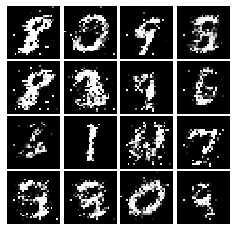

Epoch: 6, Iter: 2960, D: 0.252, G:0.1811


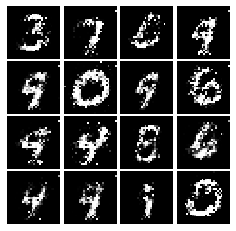

Epoch: 6, Iter: 2980, D: 0.2443, G:0.1608


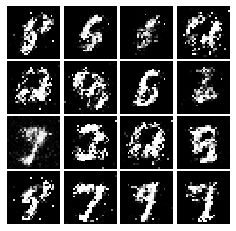

Epoch: 6, Iter: 3000, D: 0.235, G:0.151


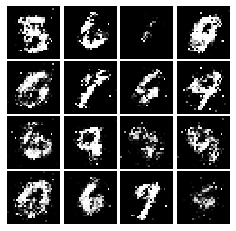

Epoch: 6, Iter: 3020, D: 0.2313, G:0.1597


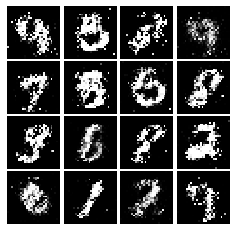

Epoch: 6, Iter: 3040, D: 0.2177, G:0.1663


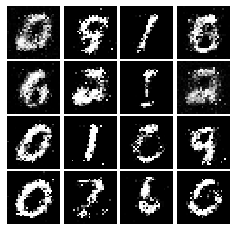

Epoch: 6, Iter: 3060, D: 0.2453, G:0.1522


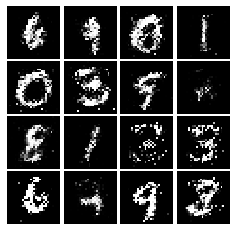

Epoch: 6, Iter: 3080, D: 0.2267, G:0.1948


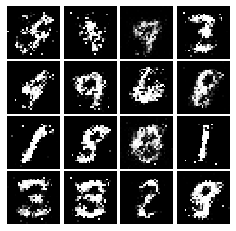

Epoch: 6, Iter: 3100, D: 0.2154, G:0.1628


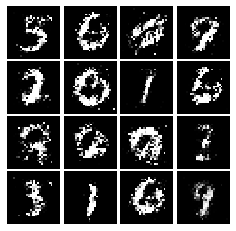

Epoch: 6, Iter: 3120, D: 0.2111, G:0.1531


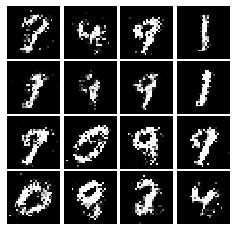

Epoch: 6, Iter: 3140, D: 0.231, G:0.1769


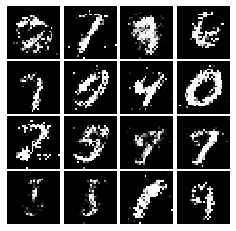

Epoch: 6, Iter: 3160, D: 0.2322, G:0.1425


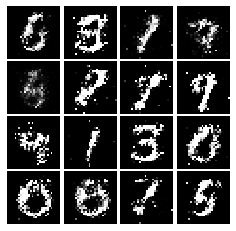

Epoch: 6, Iter: 3180, D: 0.2351, G:0.1834


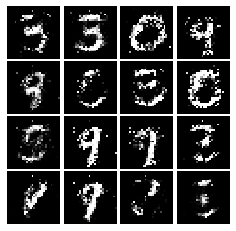

Epoch: 6, Iter: 3200, D: 0.2417, G:0.174


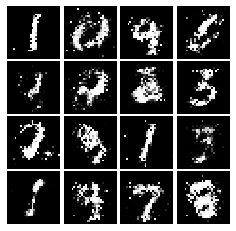

Epoch: 6, Iter: 3220, D: 0.2422, G:0.1589


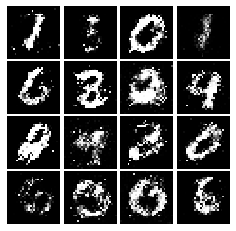

Epoch: 6, Iter: 3240, D: 0.2361, G:0.1732


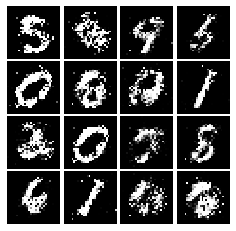

Epoch: 6, Iter: 3260, D: 0.2492, G:0.1626


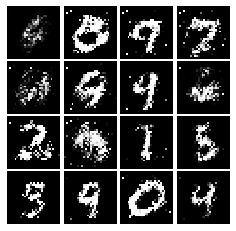

Epoch: 6, Iter: 3280, D: 0.2222, G:0.2049


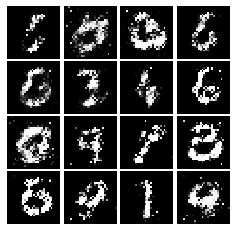

Epoch: 7, Iter: 3300, D: 0.2333, G:0.1898


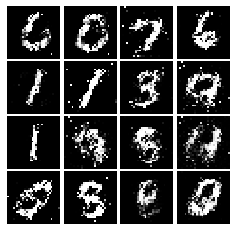

Epoch: 7, Iter: 3320, D: 0.2264, G:0.2063


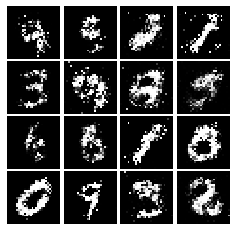

Epoch: 7, Iter: 3340, D: 0.2345, G:0.1699


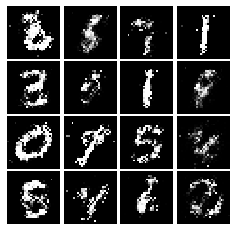

Epoch: 7, Iter: 3360, D: 0.237, G:0.1729


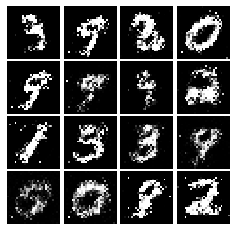

Epoch: 7, Iter: 3380, D: 0.2322, G:0.1923


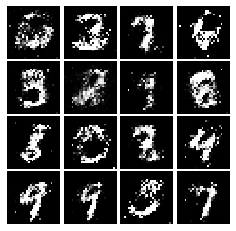

Epoch: 7, Iter: 3400, D: 0.2517, G:0.173


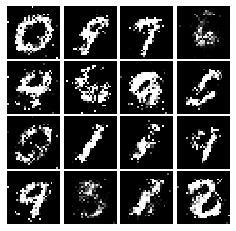

Epoch: 7, Iter: 3420, D: 0.2368, G:0.1871


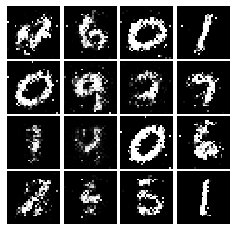

Epoch: 7, Iter: 3440, D: 0.262, G:0.1625


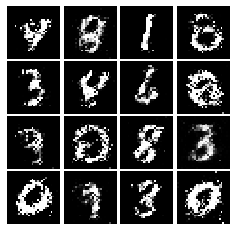

Epoch: 7, Iter: 3460, D: 0.203, G:0.1704


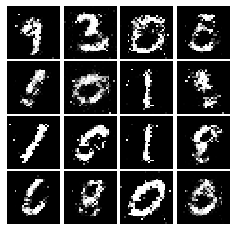

Epoch: 7, Iter: 3480, D: 0.228, G:0.1563


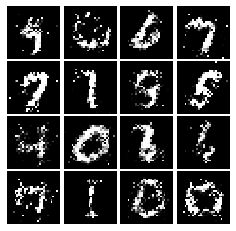

Epoch: 7, Iter: 3500, D: 0.2175, G:0.175


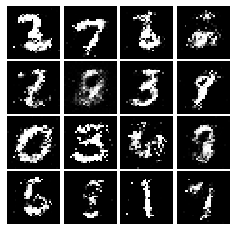

Epoch: 7, Iter: 3520, D: 0.2358, G:0.1515


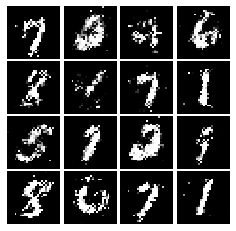

Epoch: 7, Iter: 3540, D: 0.237, G:0.1613


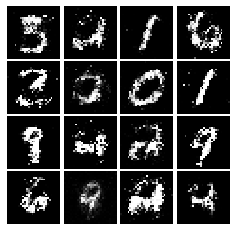

Epoch: 7, Iter: 3560, D: 0.216, G:0.1434


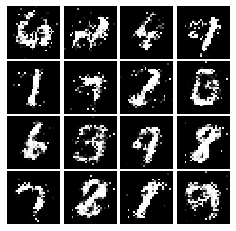

Epoch: 7, Iter: 3580, D: 0.2304, G:0.1775


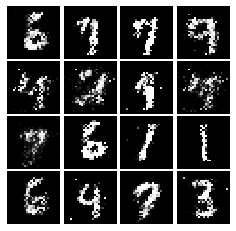

Epoch: 7, Iter: 3600, D: 0.2209, G:0.1492


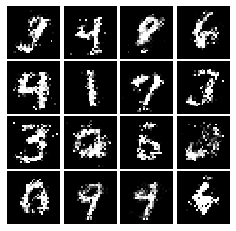

Epoch: 7, Iter: 3620, D: 0.2352, G:0.148


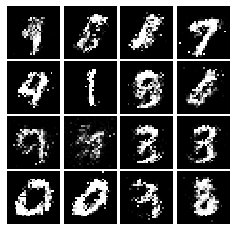

Epoch: 7, Iter: 3640, D: 0.2284, G:0.1473


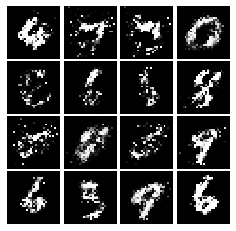

Epoch: 7, Iter: 3660, D: 0.2145, G:0.1669


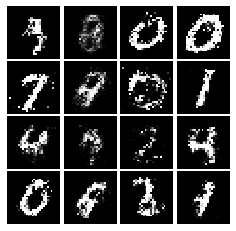

Epoch: 7, Iter: 3680, D: 0.2186, G:0.1672


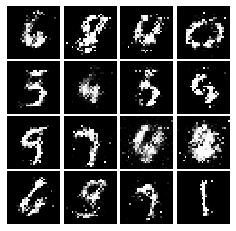

Epoch: 7, Iter: 3700, D: 0.2195, G:0.1878


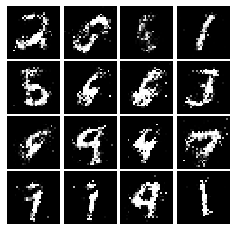

Epoch: 7, Iter: 3720, D: 0.219, G:0.1858


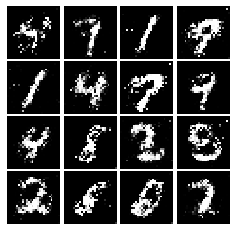

Epoch: 7, Iter: 3740, D: 0.2559, G:0.1456


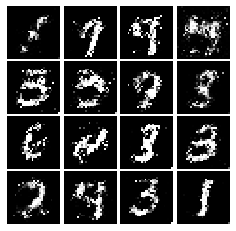

Epoch: 8, Iter: 3760, D: 0.2298, G:0.1635


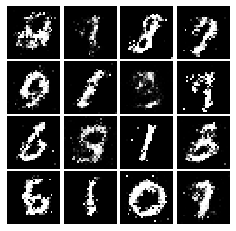

Epoch: 8, Iter: 3780, D: 0.238, G:0.1641


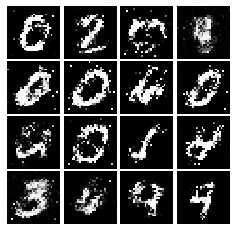

Epoch: 8, Iter: 3800, D: 0.209, G:0.2257


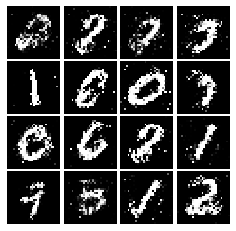

Epoch: 8, Iter: 3820, D: 0.2302, G:0.1675


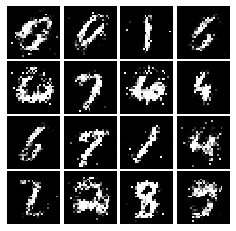

Epoch: 8, Iter: 3840, D: 0.2296, G:0.1593


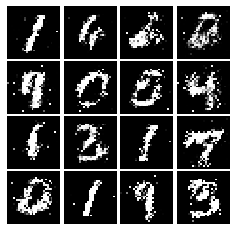

Epoch: 8, Iter: 3860, D: 0.2334, G:0.161


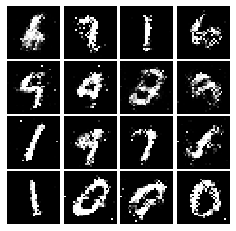

Epoch: 8, Iter: 3880, D: 0.2288, G:0.155


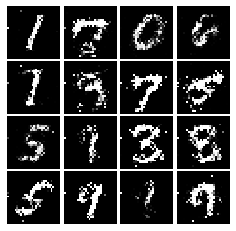

Epoch: 8, Iter: 3900, D: 0.2314, G:0.1546


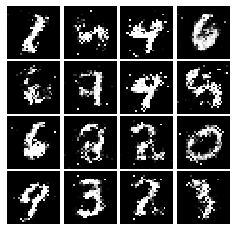

Epoch: 8, Iter: 3920, D: 0.2204, G:0.1682


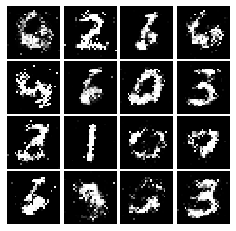

Epoch: 8, Iter: 3940, D: 0.2411, G:0.1363


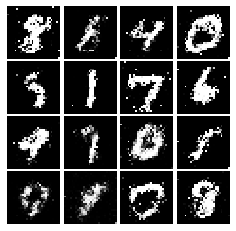

Epoch: 8, Iter: 3960, D: 0.2455, G:0.1639


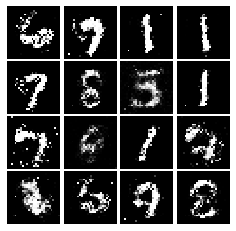

Epoch: 8, Iter: 3980, D: 0.2402, G:0.175


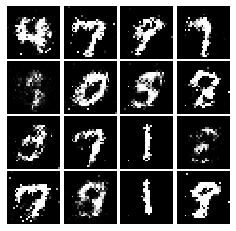

Epoch: 8, Iter: 4000, D: 0.2246, G:0.1582


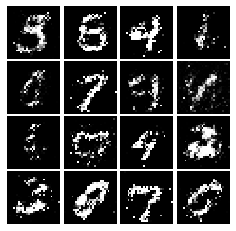

Epoch: 8, Iter: 4020, D: 0.2448, G:0.1607


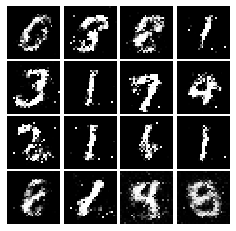

Epoch: 8, Iter: 4040, D: 0.2225, G:0.1837


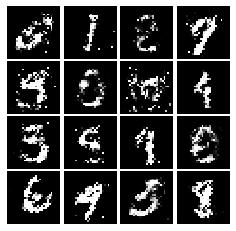

Epoch: 8, Iter: 4060, D: 0.2378, G:0.1973


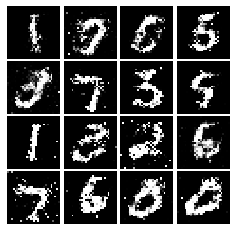

Epoch: 8, Iter: 4080, D: 0.2497, G:0.1521


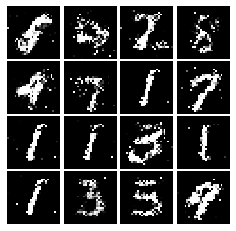

Epoch: 8, Iter: 4100, D: 0.2502, G:0.1421


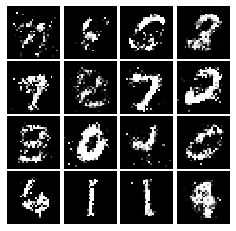

Epoch: 8, Iter: 4120, D: 0.2322, G:0.1638


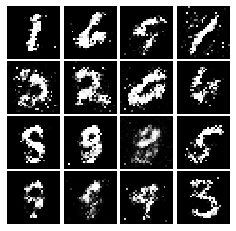

Epoch: 8, Iter: 4140, D: 0.2385, G:0.149


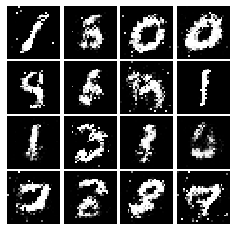

Epoch: 8, Iter: 4160, D: 0.2302, G:0.1641


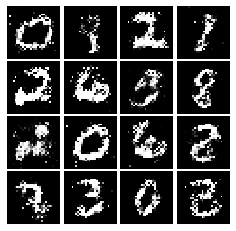

Epoch: 8, Iter: 4180, D: 0.2418, G:0.1211


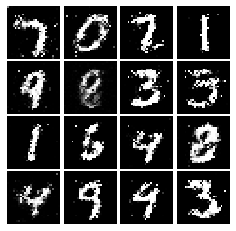

Epoch: 8, Iter: 4200, D: 0.2271, G:0.1554


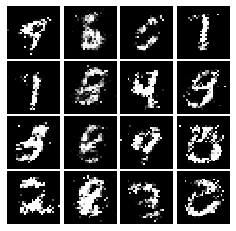

Epoch: 8, Iter: 4220, D: 0.2027, G:0.1659


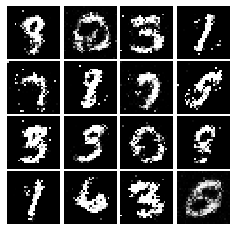

Epoch: 9, Iter: 4240, D: 0.2666, G:0.1401


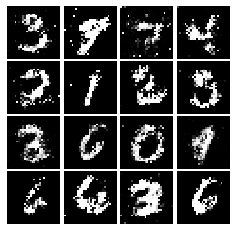

Epoch: 9, Iter: 4260, D: 0.2556, G:0.1445


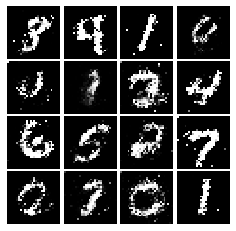

Epoch: 9, Iter: 4280, D: 0.2403, G:0.1719


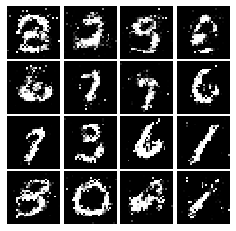

Epoch: 9, Iter: 4300, D: 0.2269, G:0.1787


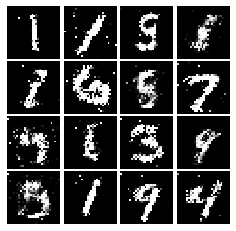

Epoch: 9, Iter: 4320, D: 0.235, G:0.169


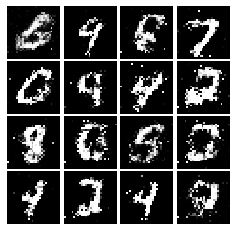

Epoch: 9, Iter: 4340, D: 0.2347, G:0.164


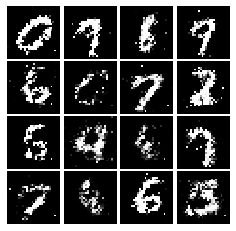

Epoch: 9, Iter: 4360, D: 0.2475, G:0.165


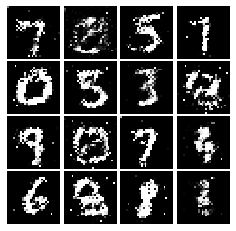

Epoch: 9, Iter: 4380, D: 0.251, G:0.1666


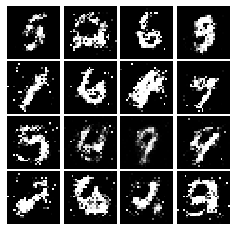

Epoch: 9, Iter: 4400, D: 0.2137, G:0.169


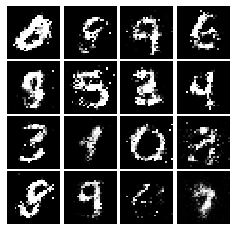

Epoch: 9, Iter: 4420, D: 0.2182, G:0.1562


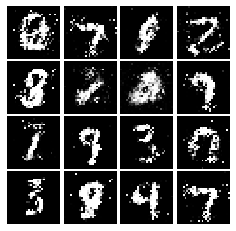

Epoch: 9, Iter: 4440, D: 0.2471, G:0.1573


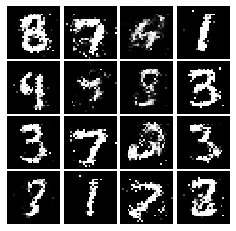

Epoch: 9, Iter: 4460, D: 0.2414, G:0.152


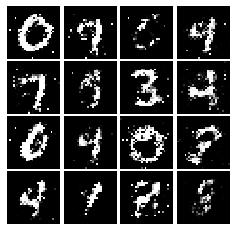

Epoch: 9, Iter: 4480, D: 0.2334, G:0.1641


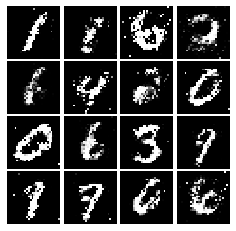

Epoch: 9, Iter: 4500, D: 0.2696, G:0.1591


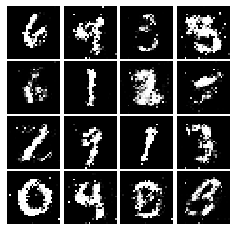

Epoch: 9, Iter: 4520, D: 0.238, G:0.1614


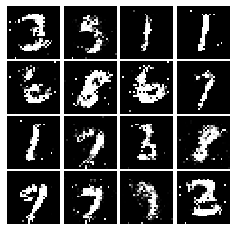

Epoch: 9, Iter: 4540, D: 0.2318, G:0.146


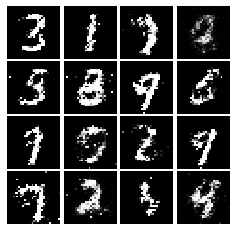

Epoch: 9, Iter: 4560, D: 0.2378, G:0.1583


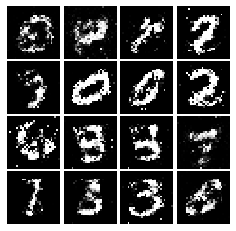

Epoch: 9, Iter: 4580, D: 0.2483, G:0.1512


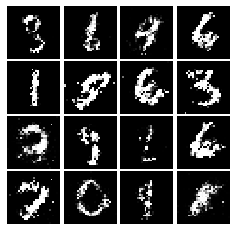

Epoch: 9, Iter: 4600, D: 0.2446, G:0.1544


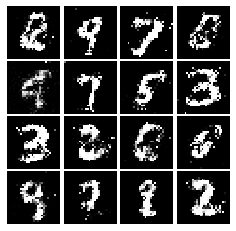

Epoch: 9, Iter: 4620, D: 0.2389, G:0.162


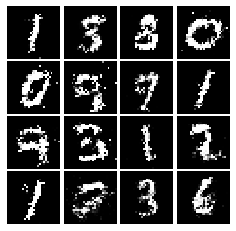

Epoch: 9, Iter: 4640, D: 0.2475, G:0.1624


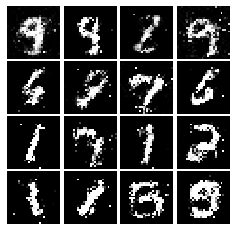

Epoch: 9, Iter: 4660, D: 0.2408, G:0.1641


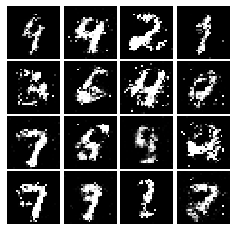

Epoch: 9, Iter: 4680, D: 0.2245, G:0.2378


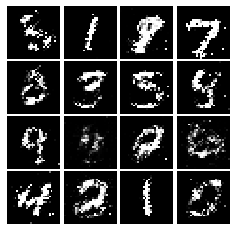

Final images


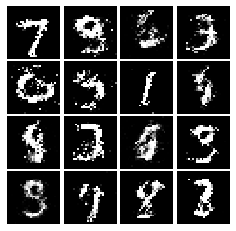

In [9]:
# YOUR TRAINING CODE HERE
D = discriminator()
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver = tf.keras.optimizers.Adam(learning_rate=1e-3, beta_1=0.5, beta_2=0.999)
G_solver = tf.keras.optimizers.Adam(learning_rate=1e-3, beta_1=0.5, beta_2=0.999)
    
# Run it!
train(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Section 2. Deeply Convolutional GANs [45 pts]

In this section, you will need to:
1. Implement DCGAN architecture
2. Train it on MNIST dataset for GAN/LSGAN loss function.

# Deeply Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks 

### Section 2.1. DCGAN model architecture [20 pts]
Implement your generator and discriminator model as follows:

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [0]:
def DC_Discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    tf.keras.layers.Reshape([28, 28, 1]),
    tf.keras.layers.Conv2D(32, (5, 5), strides= (1, 1), padding='valid', use_bias=True, activation = partial(tf.nn.leaky_relu, alpha = 0.01)),
    tf.keras.layers.MaxPool2D(pool_size = (2, 2), strides = 2, padding = 'same'),
    tf.keras.layers.Conv2D(64, (5, 5), strides= (1, 1), padding='valid', use_bias=True, activation = partial(tf.nn.leaky_relu, alpha = 0.01)),
    tf.keras.layers.MaxPool2D(pool_size = (2, 2), strides = 2, padding = 'same'),
    tf.keras.layers.Reshape([1024]),
    tf.keras.layers.Dense(1024, activation = partial(tf.nn.leaky_relu, alpha = 0.01)),
    tf.keras.layers.Dense(1)])    
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return model

#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [0]:
def DC_Generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.Sequential([
    # TODO: implement architecture
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    tf.keras.layers.Dense(1024, use_bias=True, input_shape=(noise_dim,), activation = 'relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dense(7*7*128, use_bias=True, activation = 'relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Reshape([7, 7, 128]),
    tf.keras.layers.Conv2DTranspose(filters = 64, kernel_size = (4, 4), strides=(2, 2), use_bias=True, activation = 'relu', padding = 'same'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2DTranspose(filters = 1, kernel_size = (4, 4), strides=(2, 2), use_bias=True, activation=tf.nn.tanh, padding = 'same')])
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    
    return model

### Section 2.2 Train a DCGAN Model with GAN / LSGAN loss function [15 pts]
Now, train your new model with GAN loss function. Observe the visualized result of your model, and describe what you see.

Epoch: 0, Iter: 0, D: 1.33, G:0.6527
Instructions for updating:
Use tf.identity instead.


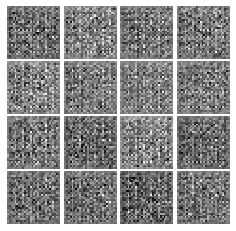

Epoch: 0, Iter: 20, D: 0.547, G:1.078


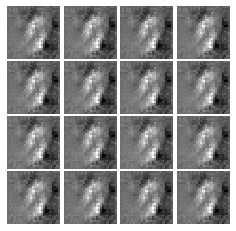

Epoch: 0, Iter: 40, D: 5.863, G:0.0004592


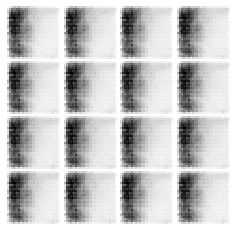

Epoch: 0, Iter: 60, D: 0.01233, G:4.624


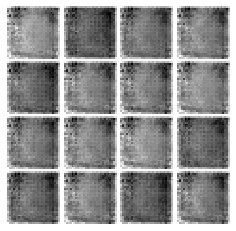

Epoch: 0, Iter: 80, D: 0.001817, G:6.448


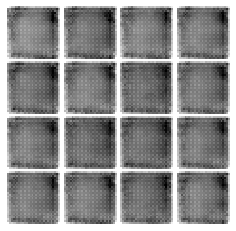

Epoch: 0, Iter: 100, D: 0.000853, G:7.198


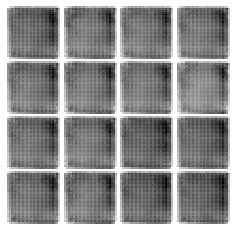

Epoch: 0, Iter: 120, D: 0.0005677, G:7.552


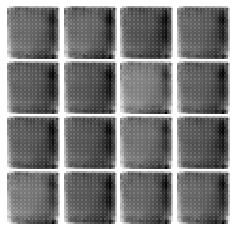

Epoch: 0, Iter: 140, D: 0.0009423, G:6.873


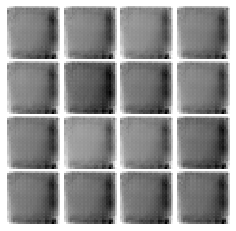

Epoch: 0, Iter: 160, D: 0.2156, G:25.77


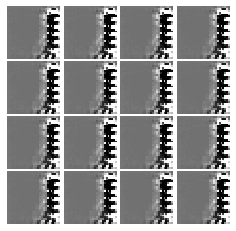

Epoch: 0, Iter: 180, D: 0.1503, G:2.945


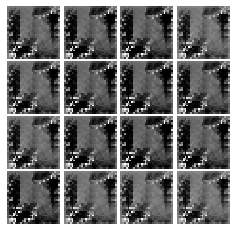

Epoch: 0, Iter: 200, D: 0.7252, G:7.73


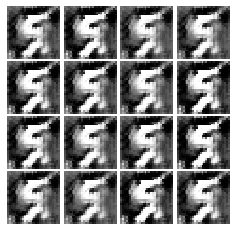

Epoch: 0, Iter: 220, D: 0.4443, G:3.062


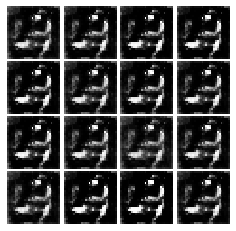

Epoch: 0, Iter: 240, D: 0.9805, G:0.3563


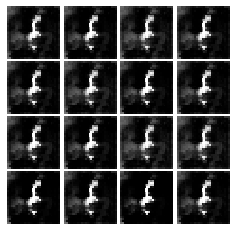

Epoch: 0, Iter: 260, D: 0.1614, G:3.981


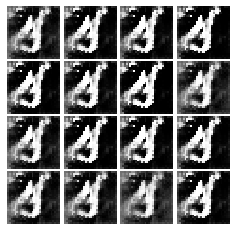

Epoch: 0, Iter: 280, D: 0.1814, G:2.87


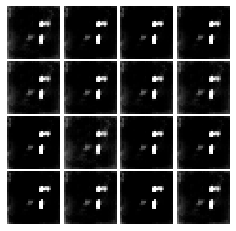

Epoch: 0, Iter: 300, D: 0.2465, G:3.219


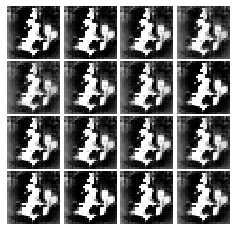

Epoch: 0, Iter: 320, D: 2.779, G:2.207


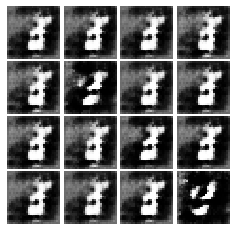

Epoch: 0, Iter: 340, D: 0.6895, G:2.096


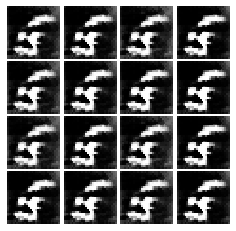

Epoch: 0, Iter: 360, D: 1.429, G:1.802


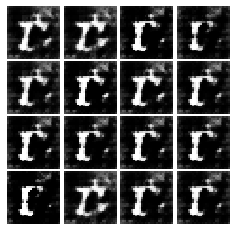

Epoch: 0, Iter: 380, D: 0.8895, G:1.543


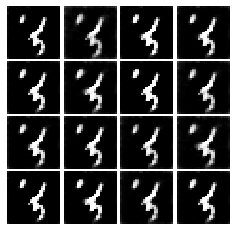

Epoch: 0, Iter: 400, D: 1.028, G:2.843


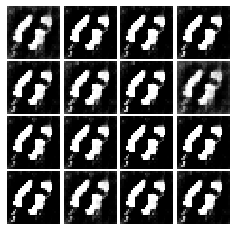

Epoch: 0, Iter: 420, D: 0.5909, G:1.797


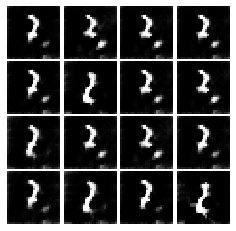

Epoch: 0, Iter: 440, D: 0.9393, G:3.056


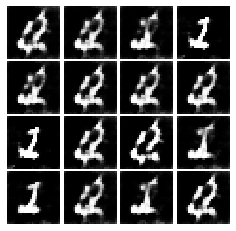

Epoch: 0, Iter: 460, D: 0.7516, G:2.043


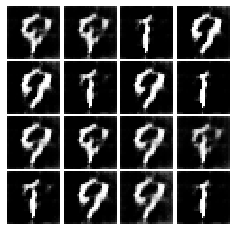

Epoch: 1, Iter: 480, D: 0.9338, G:1.996


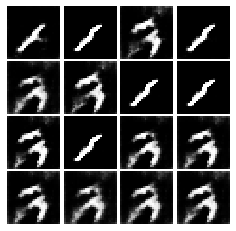

Epoch: 1, Iter: 500, D: 0.3605, G:2.448


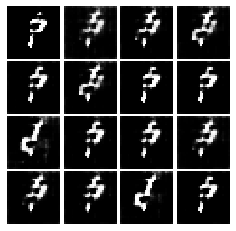

Epoch: 1, Iter: 520, D: 0.8998, G:2.345


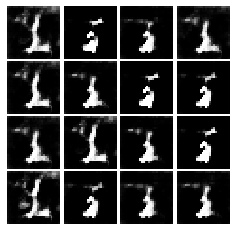

Epoch: 1, Iter: 540, D: 0.6682, G:1.999


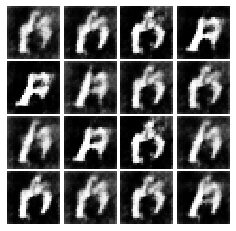

Epoch: 1, Iter: 560, D: 0.703, G:1.859


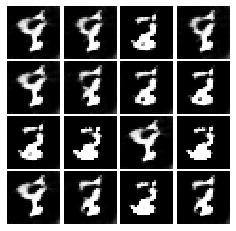

Epoch: 1, Iter: 580, D: 0.524, G:2.461


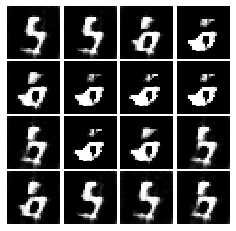

Epoch: 1, Iter: 600, D: 0.5426, G:2.617


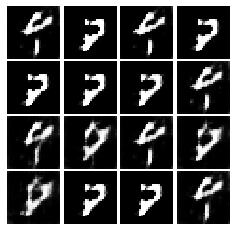

Epoch: 1, Iter: 620, D: 0.9062, G:2.411


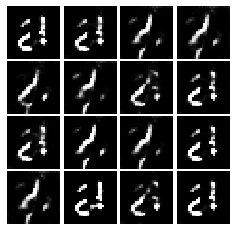

Epoch: 1, Iter: 640, D: 0.8595, G:4.604


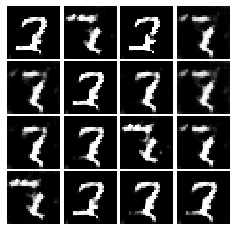

Epoch: 1, Iter: 660, D: 0.8834, G:1.586


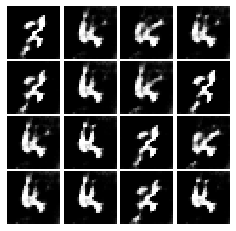

Epoch: 1, Iter: 680, D: 0.3703, G:3.089


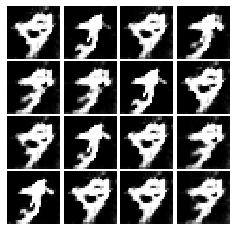

Epoch: 1, Iter: 700, D: 0.8358, G:2.226


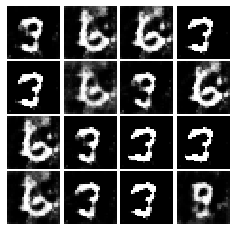

Epoch: 1, Iter: 720, D: 0.3212, G:3.367


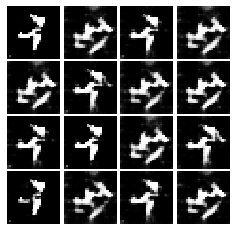

Epoch: 1, Iter: 740, D: 0.9377, G:1.539


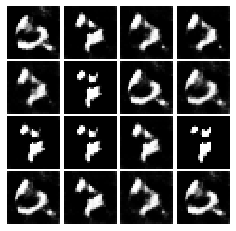

Epoch: 1, Iter: 760, D: 0.1933, G:3.732


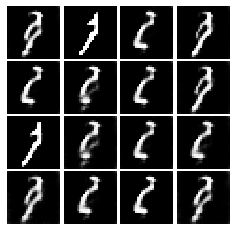

Epoch: 1, Iter: 780, D: 0.675, G:2.675


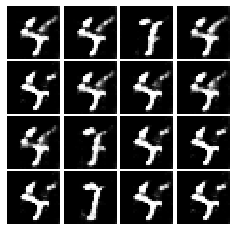

Epoch: 1, Iter: 800, D: 0.5152, G:2.955


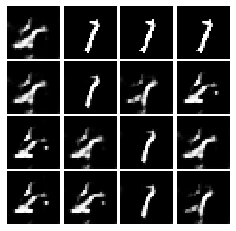

Epoch: 1, Iter: 820, D: 0.9483, G:4.395


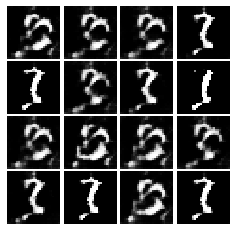

Epoch: 1, Iter: 840, D: 0.3955, G:2.967


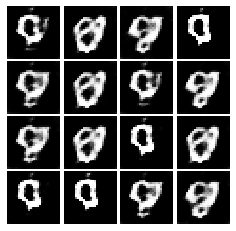

Epoch: 1, Iter: 860, D: 0.482, G:3.645


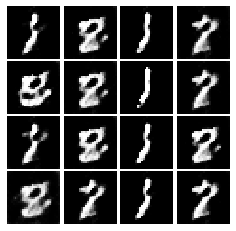

Epoch: 1, Iter: 880, D: 0.4465, G:2.479


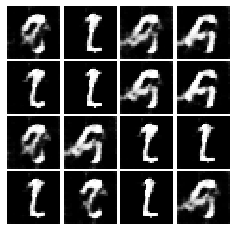

Epoch: 1, Iter: 900, D: 0.8388, G:3.329


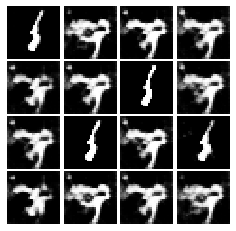

Epoch: 1, Iter: 920, D: 0.3333, G:7.009


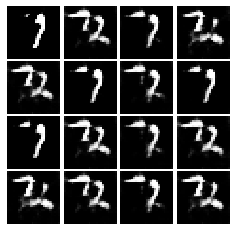

Epoch: 2, Iter: 940, D: 0.6054, G:2.631


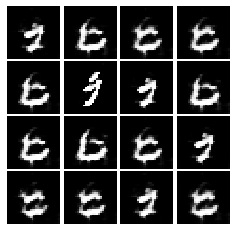

Epoch: 2, Iter: 960, D: 0.9538, G:2.813


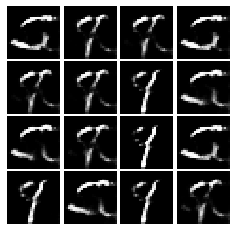

Epoch: 2, Iter: 980, D: 0.3985, G:3.23


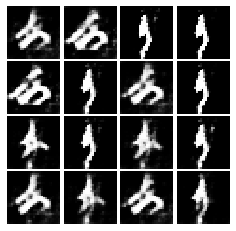

Epoch: 2, Iter: 1000, D: 0.1235, G:3.807


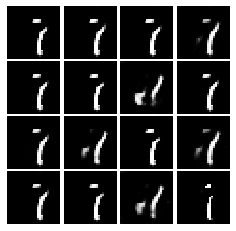

Epoch: 2, Iter: 1020, D: 0.4122, G:3.039


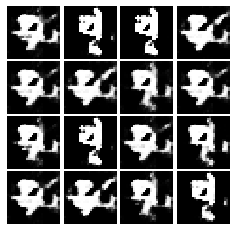

Epoch: 2, Iter: 1040, D: 0.1819, G:2.718


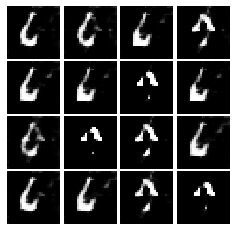

Epoch: 2, Iter: 1060, D: 0.3245, G:3.96


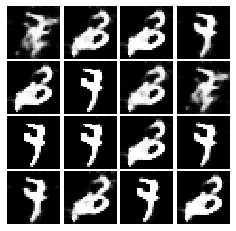

Epoch: 2, Iter: 1080, D: 0.3868, G:2.497


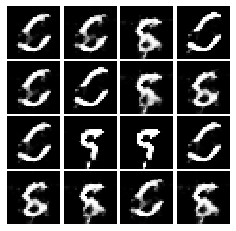

Epoch: 2, Iter: 1100, D: 0.481, G:2.95


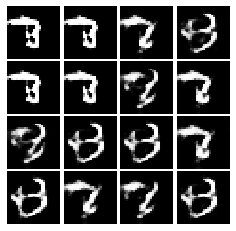

Epoch: 2, Iter: 1120, D: 0.4077, G:3.056


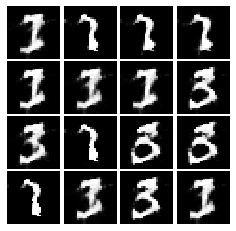

Epoch: 2, Iter: 1140, D: 1.177, G:2.819


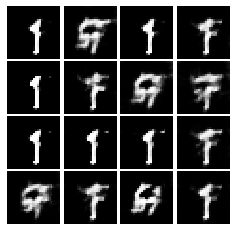

Epoch: 2, Iter: 1160, D: 0.2798, G:3.198


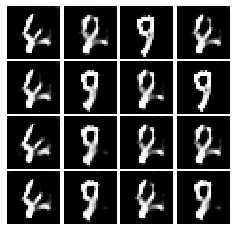

Epoch: 2, Iter: 1180, D: 0.3497, G:3.501


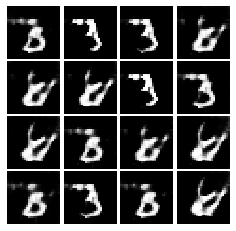

Epoch: 2, Iter: 1200, D: 0.2654, G:4.725


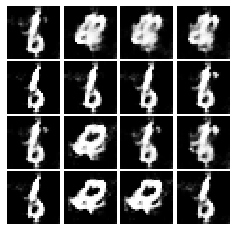

Epoch: 2, Iter: 1220, D: 0.4824, G:3.804


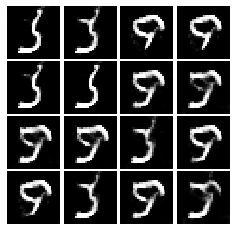

Epoch: 2, Iter: 1240, D: 0.5259, G:4.283


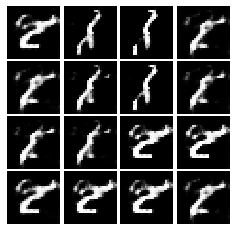

Epoch: 2, Iter: 1260, D: 0.6242, G:2.789


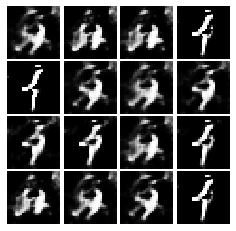

Epoch: 2, Iter: 1280, D: 0.4752, G:2.201


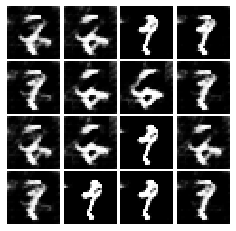

Epoch: 2, Iter: 1300, D: 0.2085, G:3.667


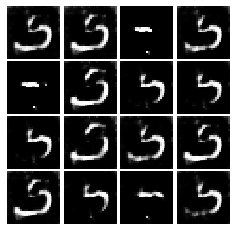

Epoch: 2, Iter: 1320, D: 0.8317, G:3.935


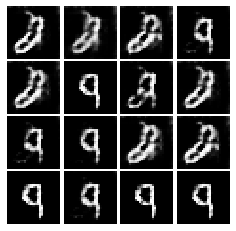

Epoch: 2, Iter: 1340, D: 0.1444, G:3.368


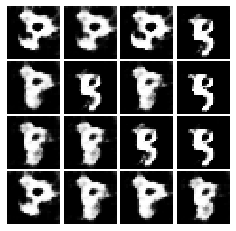

Epoch: 2, Iter: 1360, D: 0.1305, G:3.966


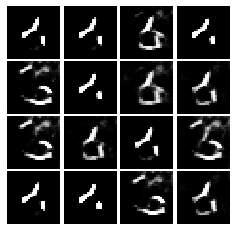

Epoch: 2, Iter: 1380, D: 0.2265, G:5.063


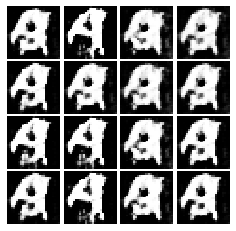

Epoch: 2, Iter: 1400, D: 0.4123, G:2.523


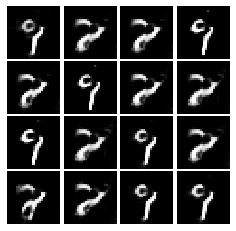

Epoch: 3, Iter: 1420, D: 0.1471, G:4.283


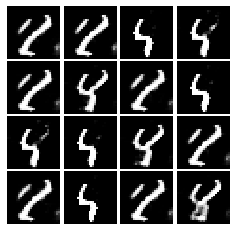

Epoch: 3, Iter: 1440, D: 0.1727, G:4.211


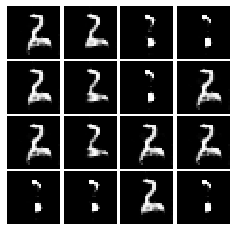

Epoch: 3, Iter: 1460, D: 0.2365, G:3.819


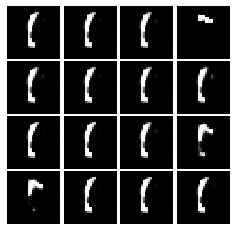

Epoch: 3, Iter: 1480, D: 0.9719, G:3.616


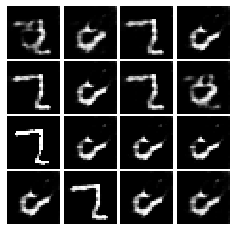

Epoch: 3, Iter: 1500, D: 0.5332, G:3.2


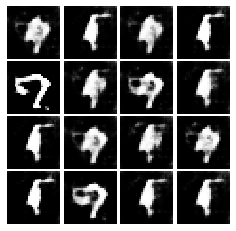

Epoch: 3, Iter: 1520, D: 0.4114, G:3.318


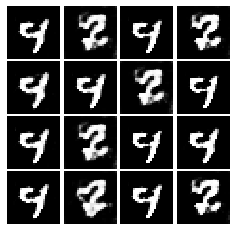

Epoch: 3, Iter: 1540, D: 0.3952, G:3.855


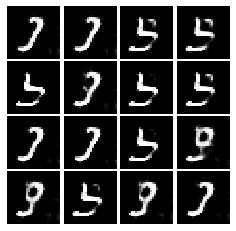

Epoch: 3, Iter: 1560, D: 0.6427, G:4.164


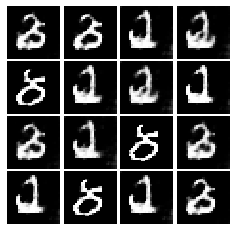

Epoch: 3, Iter: 1580, D: 0.1956, G:3.915


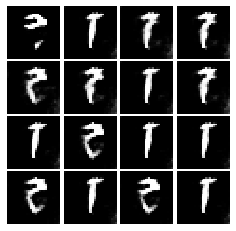

Epoch: 3, Iter: 1600, D: 0.3183, G:3.351


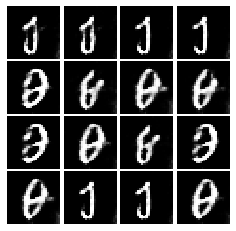

Epoch: 3, Iter: 1620, D: 0.2096, G:3.608


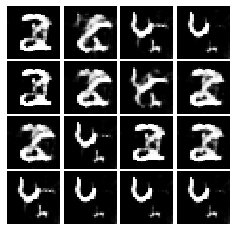

Epoch: 3, Iter: 1640, D: 0.3649, G:2.66


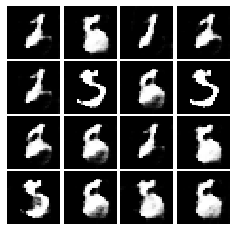

Epoch: 3, Iter: 1660, D: 0.633, G:3.058


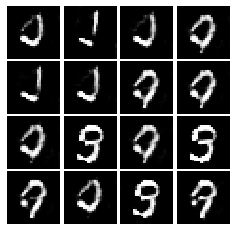

Epoch: 3, Iter: 1680, D: 0.3015, G:3.613


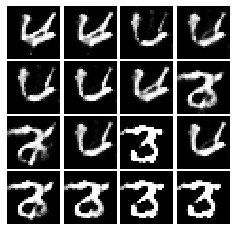

Epoch: 3, Iter: 1700, D: 0.5589, G:3.707


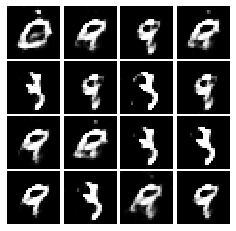

Epoch: 3, Iter: 1720, D: 0.529, G:2.793


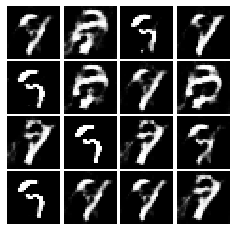

Epoch: 3, Iter: 1740, D: 0.2771, G:3.003


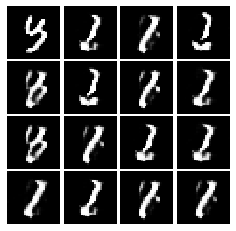

Epoch: 3, Iter: 1760, D: 0.4109, G:5.458


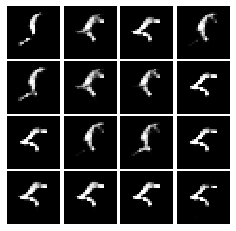

Epoch: 3, Iter: 1780, D: 0.1787, G:4.586


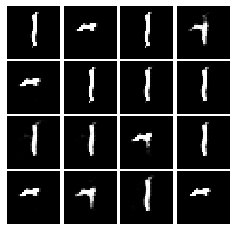

Epoch: 3, Iter: 1800, D: 0.2334, G:3.801


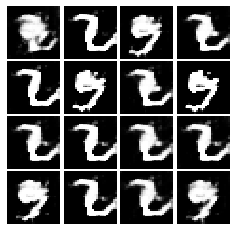

Epoch: 3, Iter: 1820, D: 0.6695, G:6.569


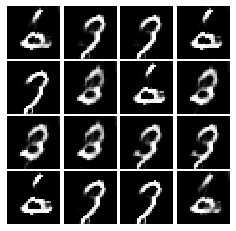

Epoch: 3, Iter: 1840, D: 0.3944, G:4.297


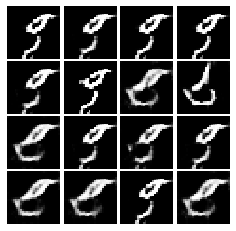

Epoch: 3, Iter: 1860, D: 0.6632, G:2.863


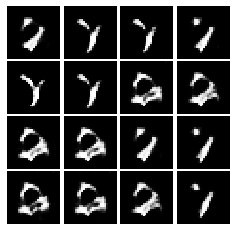

Epoch: 4, Iter: 1880, D: 0.2421, G:3.375


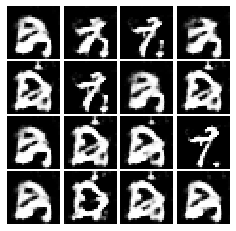

Epoch: 4, Iter: 1900, D: 1.359, G:2.469


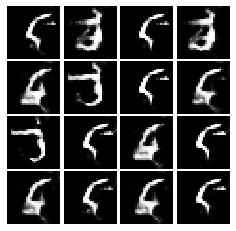

Epoch: 4, Iter: 1920, D: 0.3839, G:3.546


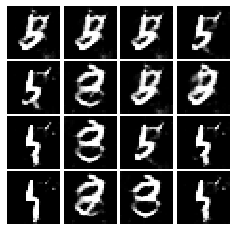

Epoch: 4, Iter: 1940, D: 0.1659, G:4.713


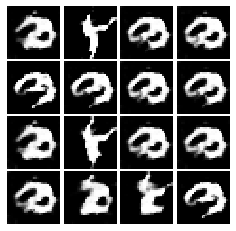

Epoch: 4, Iter: 1960, D: 0.4698, G:4.739


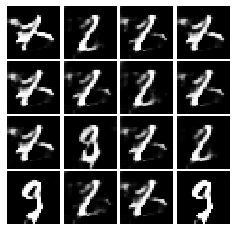

Epoch: 4, Iter: 1980, D: 0.2395, G:4.295


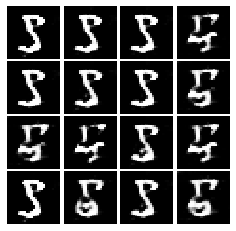

Epoch: 4, Iter: 2000, D: 0.4799, G:2.54


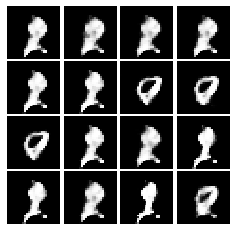

Epoch: 4, Iter: 2020, D: 0.2293, G:4.683


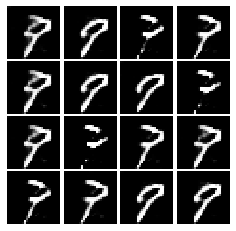

Epoch: 4, Iter: 2040, D: 0.04668, G:5.541


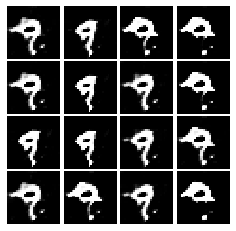

Epoch: 4, Iter: 2060, D: 0.2932, G:3.496


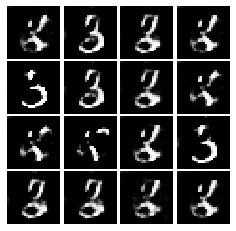

Epoch: 4, Iter: 2080, D: 0.256, G:3.579


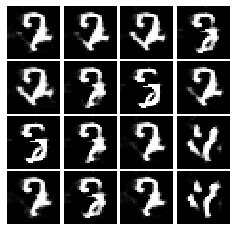

Epoch: 4, Iter: 2100, D: 0.2881, G:4.083


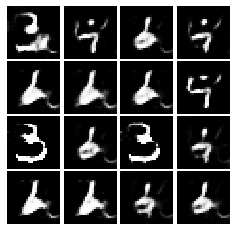

Epoch: 4, Iter: 2120, D: 0.8197, G:2.435


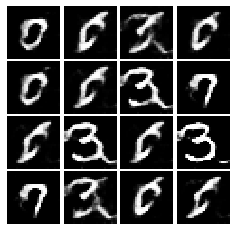

Epoch: 4, Iter: 2140, D: 0.4309, G:2.633


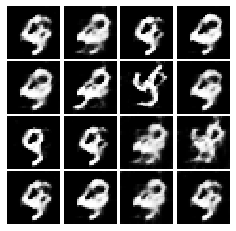

Epoch: 4, Iter: 2160, D: 0.5113, G:2.434


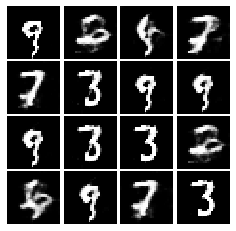

Epoch: 4, Iter: 2180, D: 0.8123, G:2.982


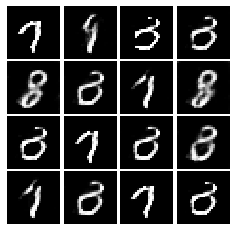

Epoch: 4, Iter: 2200, D: 0.3253, G:3.752


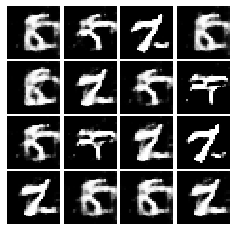

Epoch: 4, Iter: 2220, D: 0.2962, G:4.117


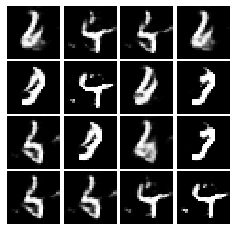

Epoch: 4, Iter: 2240, D: 0.4218, G:3.998


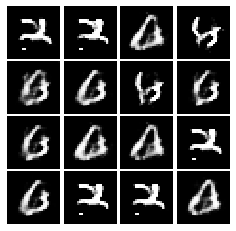

Epoch: 4, Iter: 2260, D: 0.8716, G:2.847


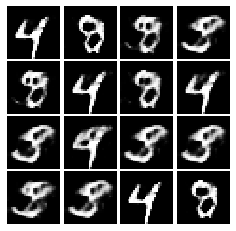

Epoch: 4, Iter: 2280, D: 0.1714, G:3.526


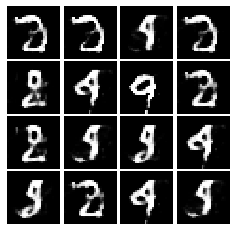

Epoch: 4, Iter: 2300, D: 0.4474, G:2.774


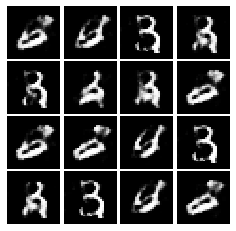

Epoch: 4, Iter: 2320, D: 0.6582, G:6.683


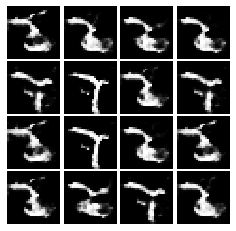

Epoch: 4, Iter: 2340, D: 1.542, G:7.392


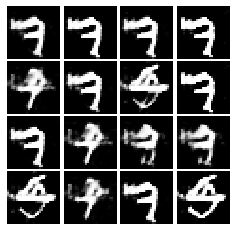

Epoch: 5, Iter: 2360, D: 0.4807, G:3.421


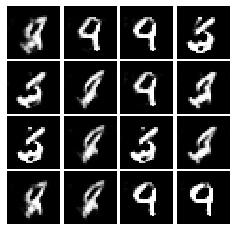

Epoch: 5, Iter: 2380, D: 0.266, G:3.895


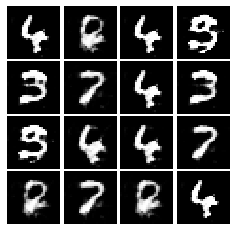

Epoch: 5, Iter: 2400, D: 0.1561, G:4.472


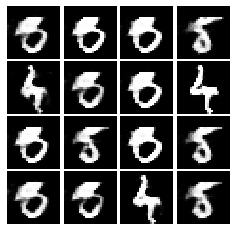

Epoch: 5, Iter: 2420, D: 0.8254, G:4.104


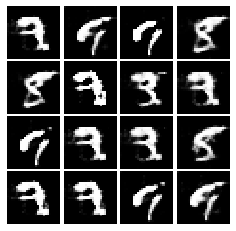

Epoch: 5, Iter: 2440, D: 0.3021, G:4.324


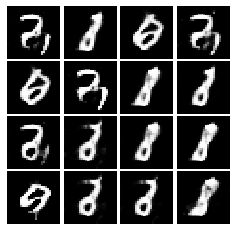

Epoch: 5, Iter: 2460, D: 0.2807, G:3.87


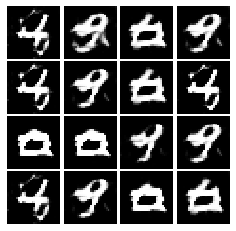

Epoch: 5, Iter: 2480, D: 0.2775, G:3.52


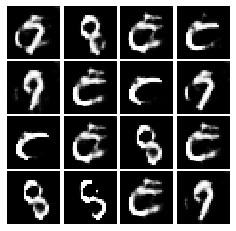

Epoch: 5, Iter: 2500, D: 0.13, G:5.068


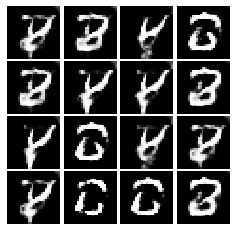

Epoch: 5, Iter: 2520, D: 0.1817, G:3.899


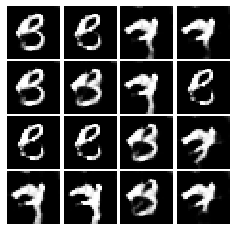

Epoch: 5, Iter: 2540, D: 0.2453, G:5.212


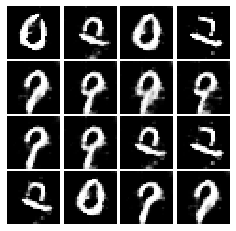

Epoch: 5, Iter: 2560, D: 0.378, G:3.153


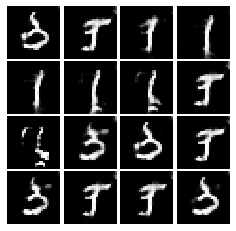

Epoch: 5, Iter: 2580, D: 0.1995, G:5.349


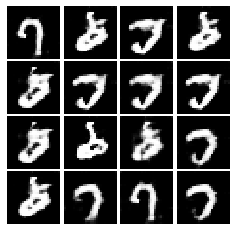

Epoch: 5, Iter: 2600, D: 0.1897, G:3.155


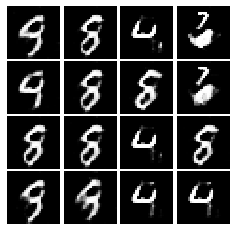

Epoch: 5, Iter: 2620, D: 0.2046, G:4.162


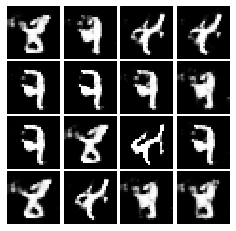

Epoch: 5, Iter: 2640, D: 0.1308, G:5.636


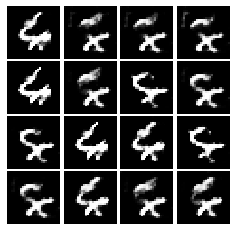

Epoch: 5, Iter: 2660, D: 0.1588, G:4.369


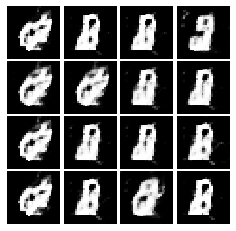

Epoch: 5, Iter: 2680, D: 0.1205, G:4.414


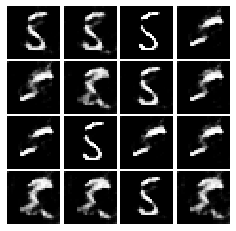

Epoch: 5, Iter: 2700, D: 0.2812, G:5.309


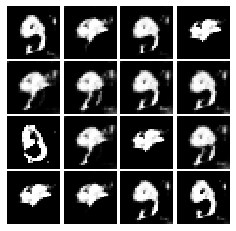

Epoch: 5, Iter: 2720, D: 0.4747, G:4.546


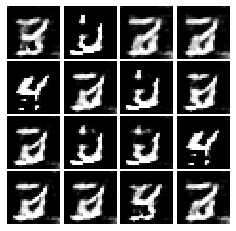

Epoch: 5, Iter: 2740, D: 0.5921, G:5.459


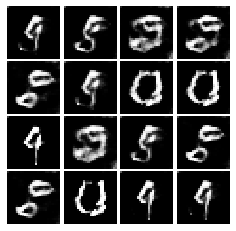

Epoch: 5, Iter: 2760, D: 1.387, G:3.625


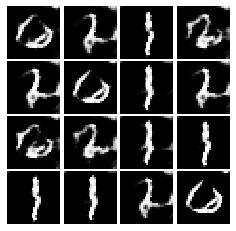

Epoch: 5, Iter: 2780, D: 0.4416, G:4.464


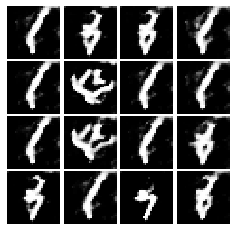

Epoch: 5, Iter: 2800, D: 0.2427, G:4.015


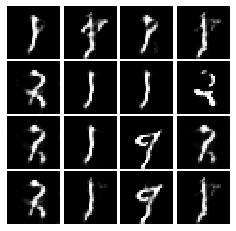

Epoch: 6, Iter: 2820, D: 0.5333, G:3.795


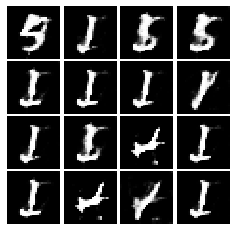

Epoch: 6, Iter: 2840, D: 0.6833, G:4.851


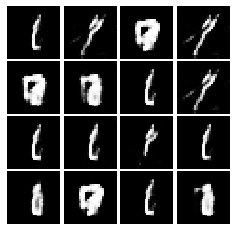

Epoch: 6, Iter: 2860, D: 0.3474, G:4.397


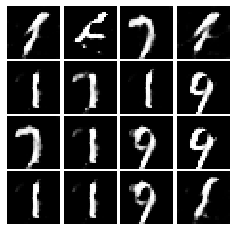

Epoch: 6, Iter: 2880, D: 0.4393, G:2.155


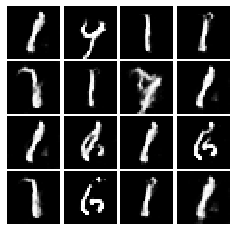

Epoch: 6, Iter: 2900, D: 0.3502, G:2.981


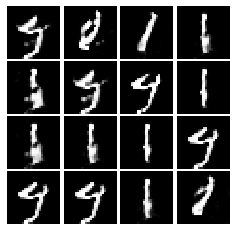

Epoch: 6, Iter: 2920, D: 0.6869, G:2.563


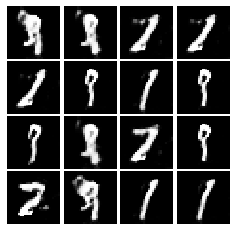

Epoch: 6, Iter: 2940, D: 0.8355, G:4.523


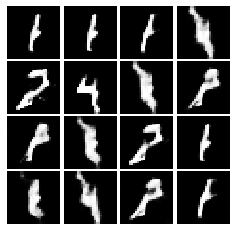

Epoch: 6, Iter: 2960, D: 0.4165, G:2.454


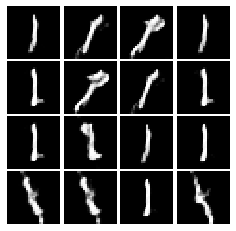

Epoch: 6, Iter: 2980, D: 0.5492, G:3.664


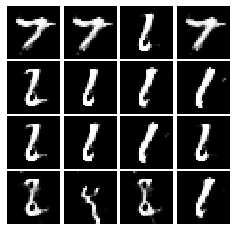

Epoch: 6, Iter: 3000, D: 0.3538, G:2.866


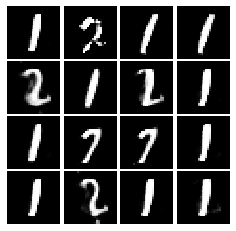

Epoch: 6, Iter: 3020, D: 0.5925, G:2.289


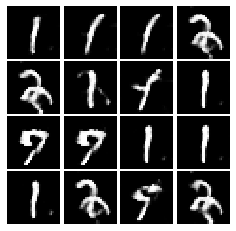

Epoch: 6, Iter: 3040, D: 0.3501, G:3.953


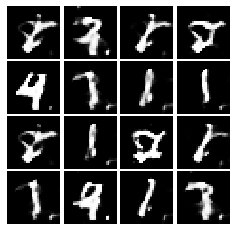

Epoch: 6, Iter: 3060, D: 0.2489, G:3.678


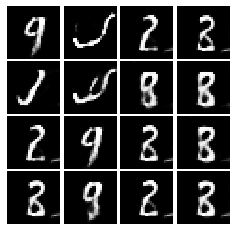

Epoch: 6, Iter: 3080, D: 0.3322, G:3.762


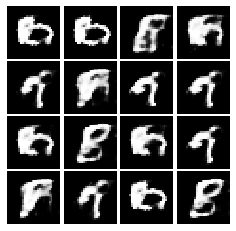

Epoch: 6, Iter: 3100, D: 0.3154, G:3.885


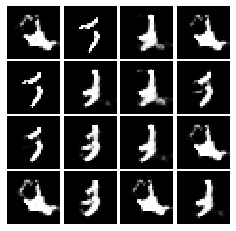

Epoch: 6, Iter: 3120, D: 0.954, G:5.53


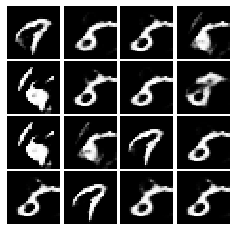

Epoch: 6, Iter: 3140, D: 0.2002, G:4.192


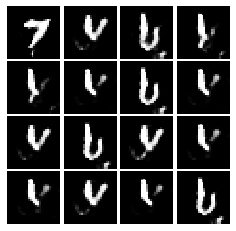

Epoch: 6, Iter: 3160, D: 0.2072, G:5.709


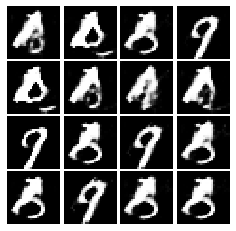

Epoch: 6, Iter: 3180, D: 0.2521, G:3.889


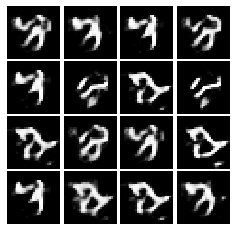

Epoch: 6, Iter: 3200, D: 0.346, G:6.192


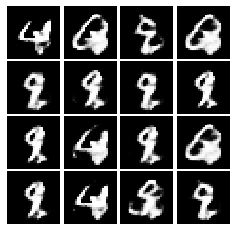

Epoch: 6, Iter: 3220, D: 0.236, G:3.702


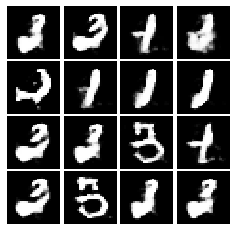

Epoch: 6, Iter: 3240, D: 0.4803, G:4.059


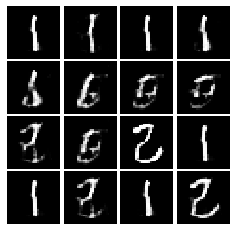

Epoch: 6, Iter: 3260, D: 0.1803, G:4.155


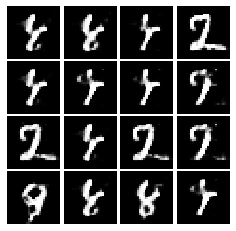

Epoch: 6, Iter: 3280, D: 0.2274, G:4.334


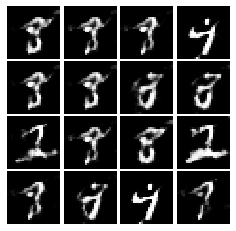

Epoch: 7, Iter: 3300, D: 0.1664, G:3.847


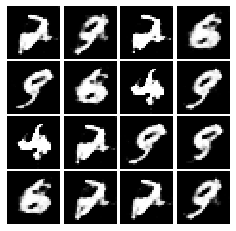

Epoch: 7, Iter: 3320, D: 0.1481, G:4.881


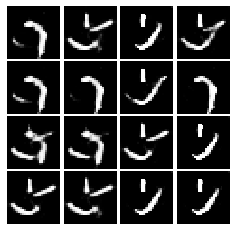

Epoch: 7, Iter: 3340, D: 0.2021, G:3.853


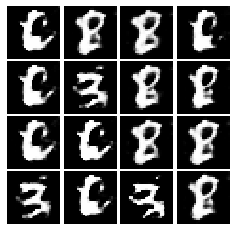

Epoch: 7, Iter: 3360, D: 0.1714, G:4.41


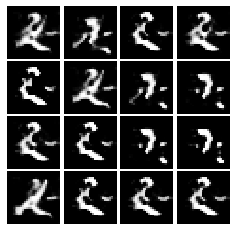

Epoch: 7, Iter: 3380, D: 0.3038, G:5.759


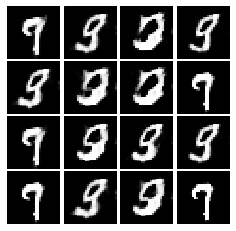

Epoch: 7, Iter: 3400, D: 0.1735, G:4.079


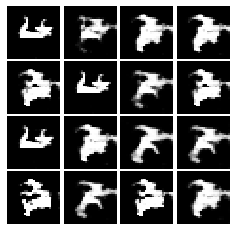

Epoch: 7, Iter: 3420, D: 0.4913, G:5.699


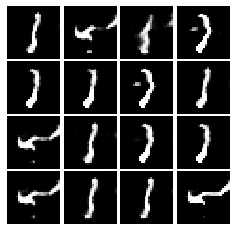

Epoch: 7, Iter: 3440, D: 0.3861, G:3.821


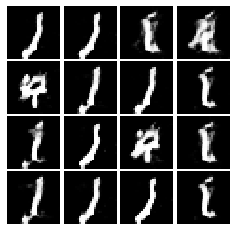

Epoch: 7, Iter: 3460, D: 0.5986, G:8.207


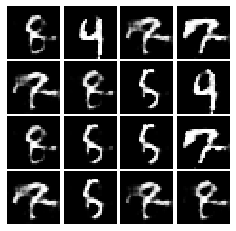

Epoch: 7, Iter: 3480, D: 1.126, G:2.434


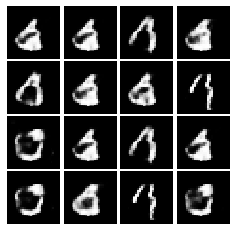

Epoch: 7, Iter: 3500, D: 0.1745, G:6.112


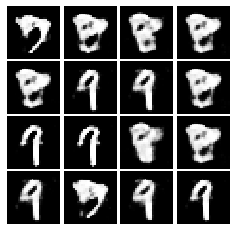

Epoch: 7, Iter: 3520, D: 0.4526, G:3.343


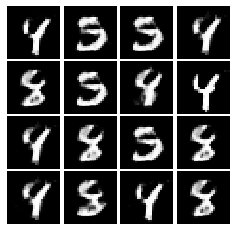

Epoch: 7, Iter: 3540, D: 0.1356, G:4.851


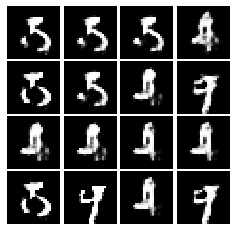

Epoch: 7, Iter: 3560, D: 0.09017, G:5.283


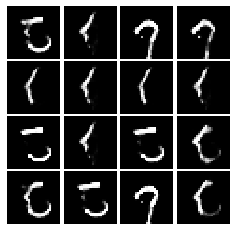

Epoch: 7, Iter: 3580, D: 0.1494, G:5.031


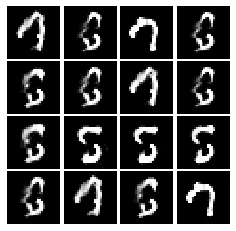

Epoch: 7, Iter: 3600, D: 0.3552, G:3.838


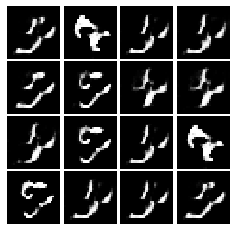

Epoch: 7, Iter: 3620, D: 0.1907, G:3.941


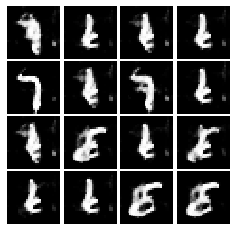

Epoch: 7, Iter: 3640, D: 0.1304, G:7.148


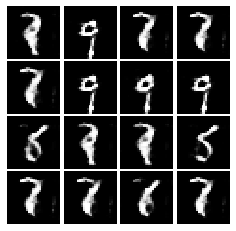

Epoch: 7, Iter: 3660, D: 0.2098, G:3.862


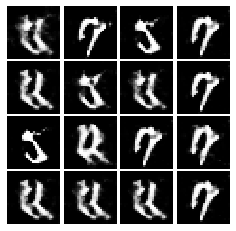

Epoch: 7, Iter: 3680, D: 0.2431, G:3.922


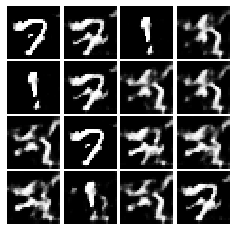

Epoch: 7, Iter: 3700, D: 0.1683, G:3.61


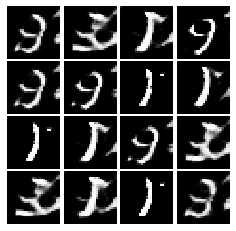

Epoch: 7, Iter: 3720, D: 0.1738, G:5.092


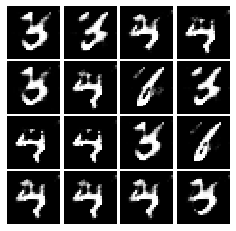

Epoch: 7, Iter: 3740, D: 0.4811, G:6.656


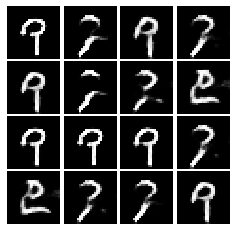

Epoch: 8, Iter: 3760, D: 0.4193, G:2.62


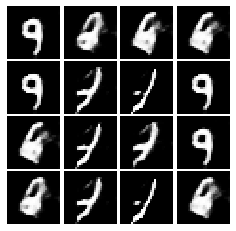

Epoch: 8, Iter: 3780, D: 0.2615, G:4.823


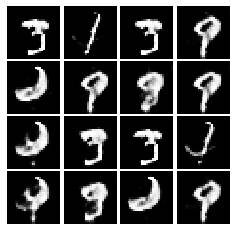

Epoch: 8, Iter: 3800, D: 0.2242, G:4.652


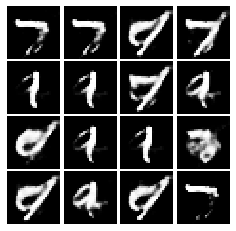

Epoch: 8, Iter: 3820, D: 0.6175, G:3.151


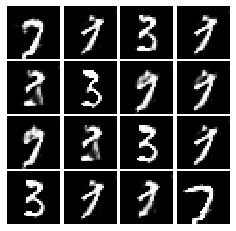

Epoch: 8, Iter: 3840, D: 0.3242, G:4.647


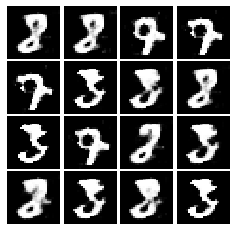

Epoch: 8, Iter: 3860, D: 0.1567, G:4.933


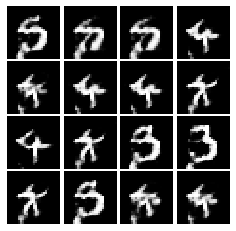

Epoch: 8, Iter: 3880, D: 0.3294, G:3.365


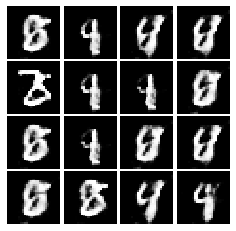

Epoch: 8, Iter: 3900, D: 0.1825, G:4.53


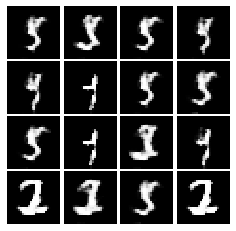

Epoch: 8, Iter: 3920, D: 0.1492, G:5.269


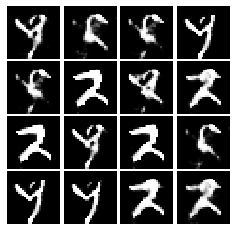

Epoch: 8, Iter: 3940, D: 0.2634, G:5.481


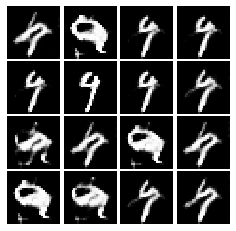

Epoch: 8, Iter: 3960, D: 0.6642, G:7.723


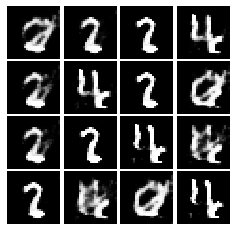

Epoch: 8, Iter: 3980, D: 0.2341, G:4.59


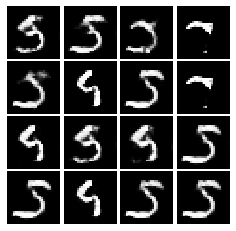

Epoch: 8, Iter: 4000, D: 0.2724, G:4.152


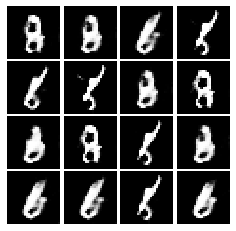

Epoch: 8, Iter: 4020, D: 0.05866, G:5.503


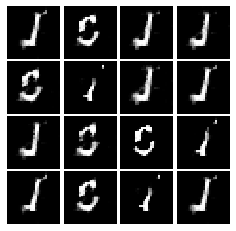

Epoch: 8, Iter: 4040, D: 0.06885, G:4.867


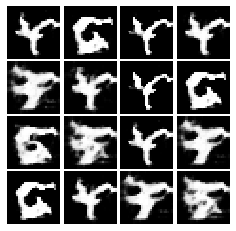

Epoch: 8, Iter: 4060, D: 0.6042, G:3.604


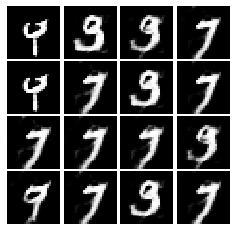

Epoch: 8, Iter: 4080, D: 0.3374, G:4.466


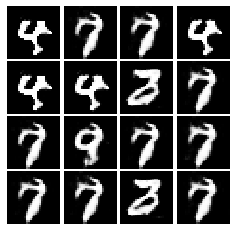

Epoch: 8, Iter: 4100, D: 0.3555, G:7.352


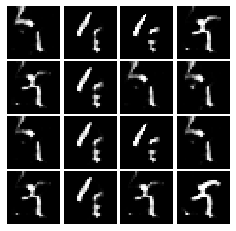

Epoch: 8, Iter: 4120, D: 0.1157, G:4.237


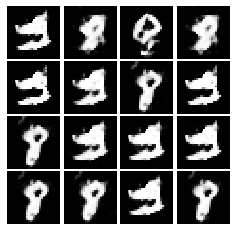

Epoch: 8, Iter: 4140, D: 0.1333, G:3.918


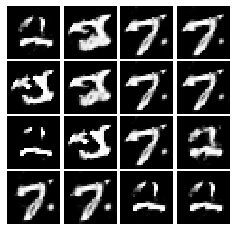

Epoch: 8, Iter: 4160, D: 0.09607, G:4.54


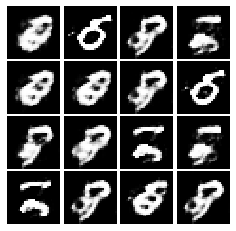

Epoch: 8, Iter: 4180, D: 0.3065, G:4.463


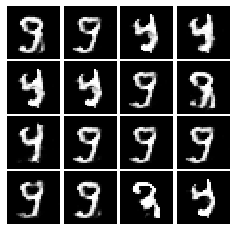

Epoch: 8, Iter: 4200, D: 0.2528, G:4.242


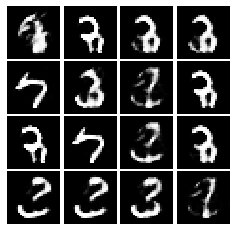

Epoch: 8, Iter: 4220, D: 0.2759, G:5.226


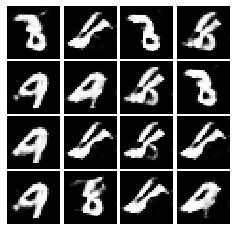

Epoch: 9, Iter: 4240, D: 0.169, G:3.533


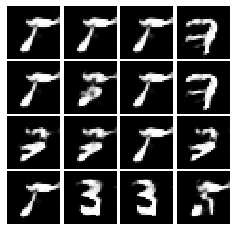

Epoch: 9, Iter: 4260, D: 0.2124, G:4.005


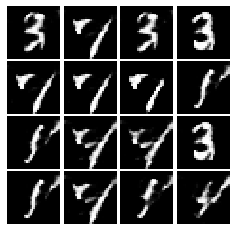

Epoch: 9, Iter: 4280, D: 0.6436, G:5.246


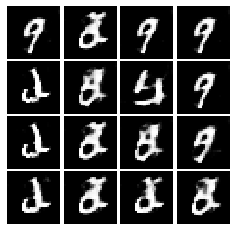

Epoch: 9, Iter: 4300, D: 0.5124, G:3.581


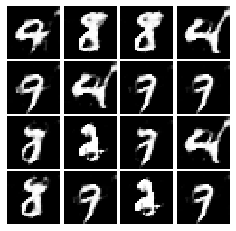

Epoch: 9, Iter: 4320, D: 0.5305, G:4.44


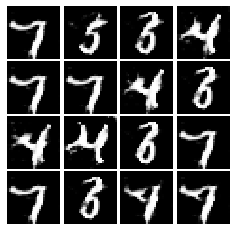

Epoch: 9, Iter: 4340, D: 0.2434, G:4.24


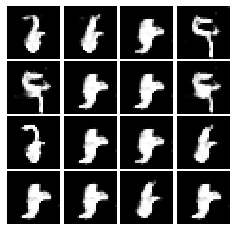

Epoch: 9, Iter: 4360, D: 0.1011, G:5.178


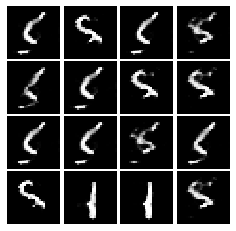

Epoch: 9, Iter: 4380, D: 0.1962, G:9.58


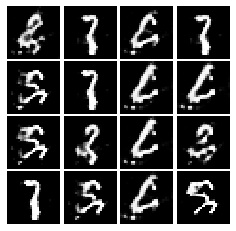

Epoch: 9, Iter: 4400, D: 1.367, G:5.756


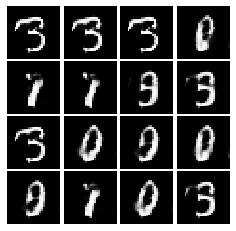

Epoch: 9, Iter: 4420, D: 0.2458, G:5.85


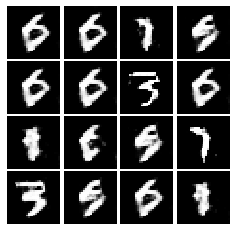

Epoch: 9, Iter: 4440, D: 0.5651, G:4.427


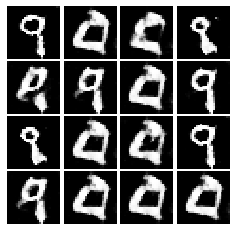

Epoch: 9, Iter: 4460, D: 0.1446, G:10.07


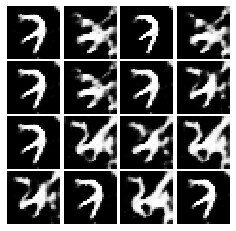

Epoch: 9, Iter: 4480, D: 0.2221, G:3.629


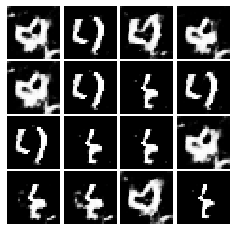

Epoch: 9, Iter: 4500, D: 0.286, G:3.969


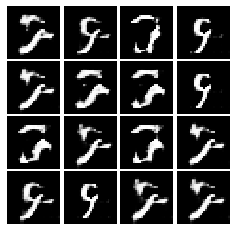

Epoch: 9, Iter: 4520, D: 0.1483, G:4.769


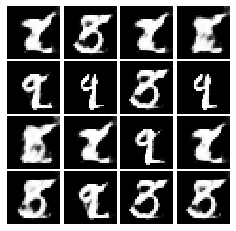

Epoch: 9, Iter: 4540, D: 0.2319, G:3.73


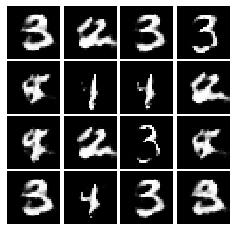

Epoch: 9, Iter: 4560, D: 0.1422, G:4.141


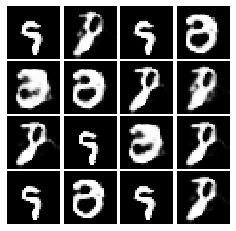

Epoch: 9, Iter: 4580, D: 0.1733, G:4.796


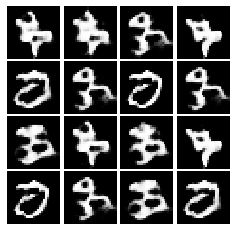

Epoch: 9, Iter: 4600, D: 0.08892, G:5.094


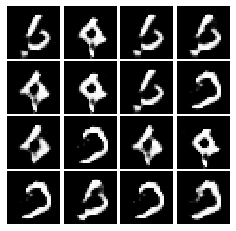

Epoch: 9, Iter: 4620, D: 0.05694, G:5.437


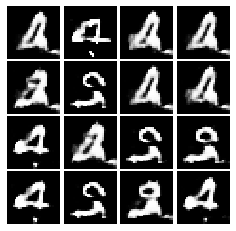

Epoch: 9, Iter: 4640, D: 0.1142, G:4.888


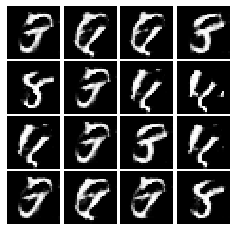

Epoch: 9, Iter: 4660, D: 0.114, G:4.407


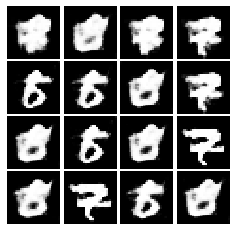

Epoch: 9, Iter: 4680, D: 0.161, G:4.687


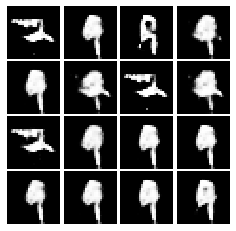

Final images


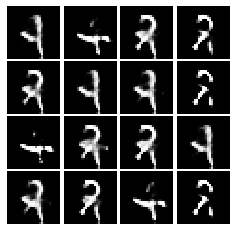

In [25]:
# YOUR TRAINING CODE HERE
D = DC_Discriminator()
G = DC_Generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver = tf.keras.optimizers.Adam(learning_rate=1e-3, beta_1=0.5, beta_2=0.999)
G_solver = tf.keras.optimizers.Adam(learning_rate=1e-3, beta_1=0.5, beta_2=0.999)
    
# Run it!
train(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

Now, train your DCGAN model with LSGAN loss function. Observe the visualized result of your model, and describe what you see.

Epoch: 0, Iter: 0, D: 0.5434, G:0.4012


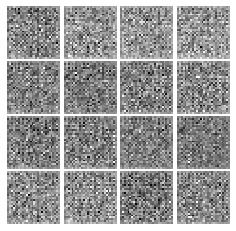

Epoch: 0, Iter: 20, D: 0.1344, G:0.3568


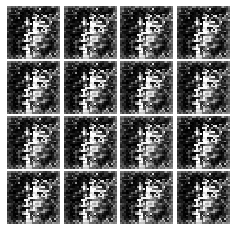

Epoch: 0, Iter: 40, D: 0.2029, G:0.5097


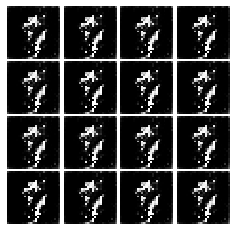

Epoch: 0, Iter: 60, D: 0.02358, G:0.6438


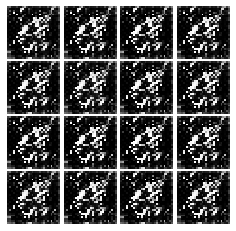

Epoch: 0, Iter: 80, D: 0.03357, G:0.5302


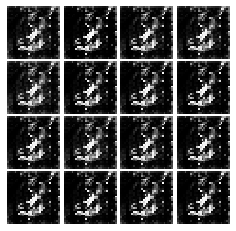

Epoch: 0, Iter: 100, D: 0.03399, G:0.8466


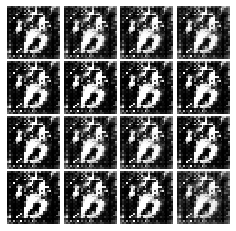

Epoch: 0, Iter: 120, D: 0.01402, G:0.512


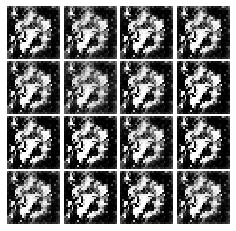

Epoch: 0, Iter: 140, D: 0.01525, G:0.5402


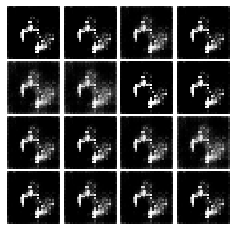

Epoch: 0, Iter: 160, D: 0.1301, G:0.4207


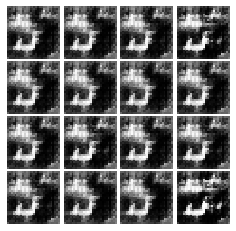

Epoch: 0, Iter: 180, D: 0.01017, G:0.5113


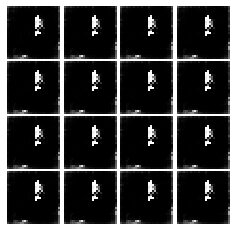

Epoch: 0, Iter: 200, D: 0.005272, G:0.5171


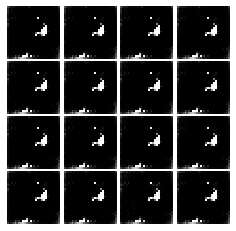

Epoch: 0, Iter: 220, D: 0.04443, G:0.5124


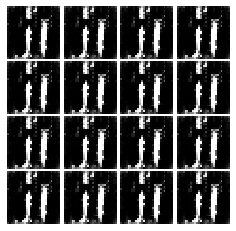

Epoch: 0, Iter: 240, D: 0.03683, G:0.4532


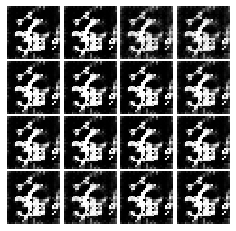

Epoch: 0, Iter: 260, D: 0.01746, G:0.4935


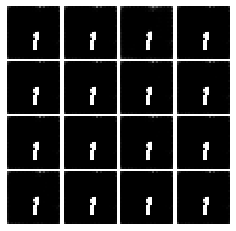

Epoch: 0, Iter: 280, D: 0.05462, G:0.6802


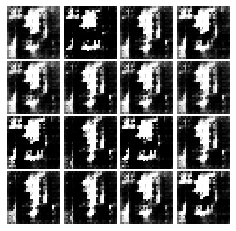

Epoch: 0, Iter: 300, D: 0.0633, G:0.3888


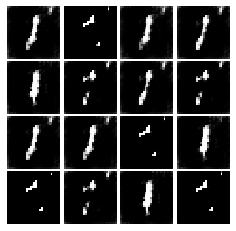

Epoch: 0, Iter: 320, D: 0.02742, G:0.5537


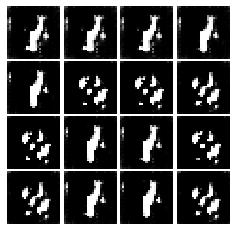

Epoch: 0, Iter: 340, D: 0.05966, G:0.4222


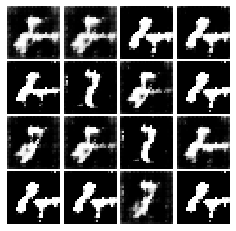

Epoch: 0, Iter: 360, D: 0.04899, G:0.6439


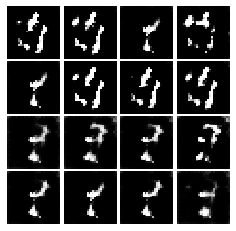

Epoch: 0, Iter: 380, D: 0.07219, G:0.6077


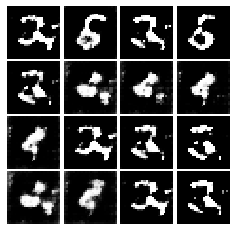

Epoch: 0, Iter: 400, D: 0.06935, G:0.5297


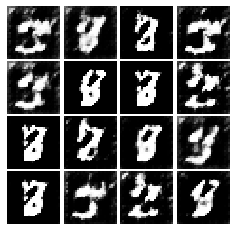

Epoch: 0, Iter: 420, D: 0.04868, G:0.4722


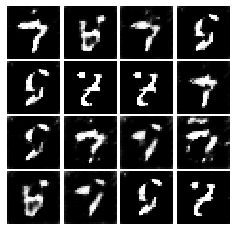

Epoch: 0, Iter: 440, D: 0.07353, G:0.4624


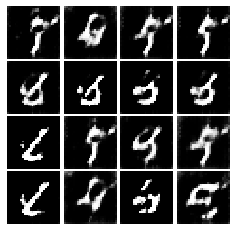

Epoch: 0, Iter: 460, D: 0.04753, G:0.6811


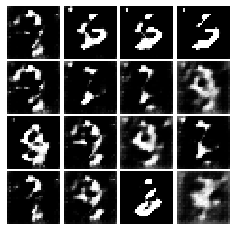

Epoch: 1, Iter: 480, D: 0.07448, G:0.4704


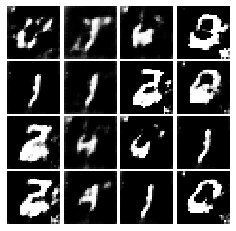

Epoch: 1, Iter: 500, D: 0.09709, G:0.3676


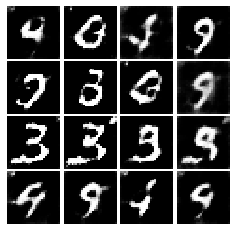

Epoch: 1, Iter: 520, D: 0.07822, G:0.5049


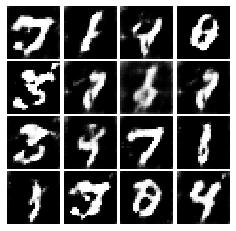

Epoch: 1, Iter: 540, D: 0.07976, G:0.4151


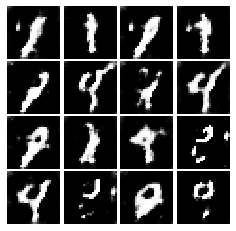

Epoch: 1, Iter: 560, D: 0.104, G:0.4025


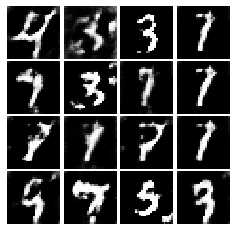

Epoch: 1, Iter: 580, D: 0.09184, G:0.3006


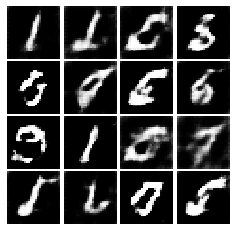

Epoch: 1, Iter: 600, D: 0.09334, G:0.4222


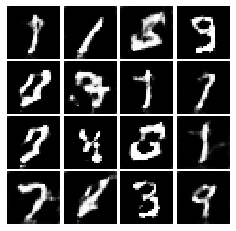

Epoch: 1, Iter: 620, D: 0.1357, G:0.3396


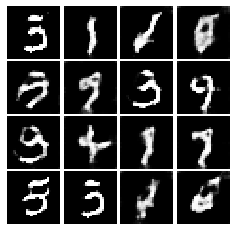

Epoch: 1, Iter: 640, D: 0.1234, G:0.3719


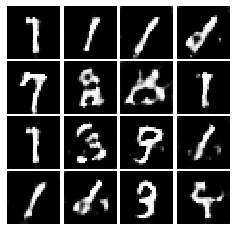

Epoch: 1, Iter: 660, D: 0.1142, G:0.3531


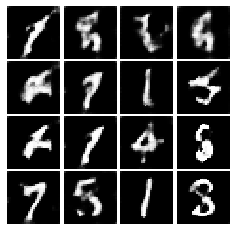

Epoch: 1, Iter: 680, D: 0.1235, G:0.3428


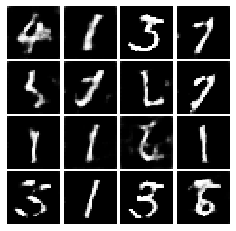

Epoch: 1, Iter: 700, D: 0.08324, G:0.3433


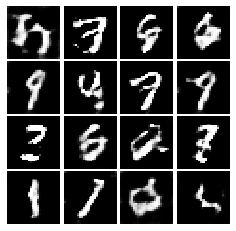

Epoch: 1, Iter: 720, D: 0.1259, G:0.4619


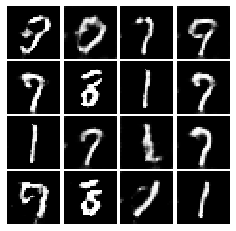

Epoch: 1, Iter: 740, D: 0.1553, G:0.2874


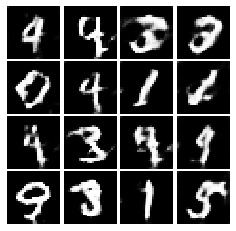

Epoch: 1, Iter: 760, D: 0.1484, G:0.2787


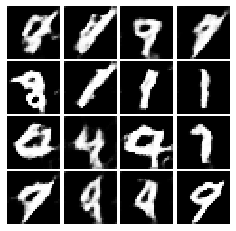

Epoch: 1, Iter: 780, D: 0.1431, G:0.3113


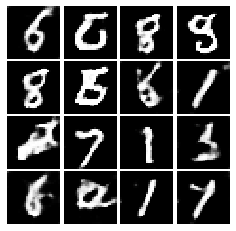

Epoch: 1, Iter: 800, D: 0.1447, G:0.3337


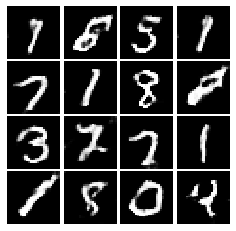

Epoch: 1, Iter: 820, D: 0.1587, G:0.2859


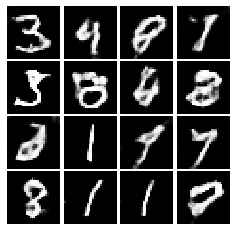

Epoch: 1, Iter: 840, D: 0.1405, G:0.3141


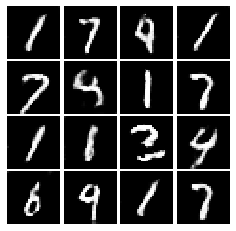

Epoch: 1, Iter: 860, D: 0.1417, G:0.2596


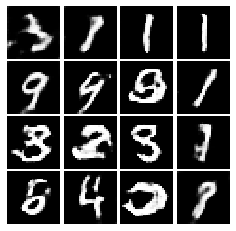

Epoch: 1, Iter: 880, D: 0.1331, G:0.2736


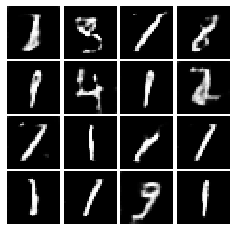

Epoch: 1, Iter: 900, D: 0.148, G:0.342


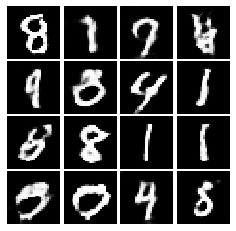

Epoch: 1, Iter: 920, D: 0.1638, G:0.2118


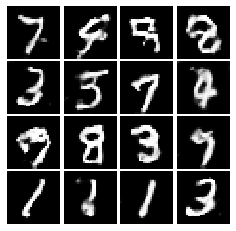

Epoch: 2, Iter: 940, D: 0.1515, G:0.2785


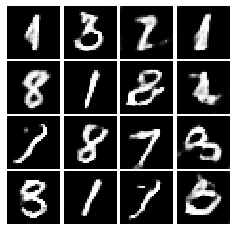

Epoch: 2, Iter: 960, D: 0.1645, G:0.2961


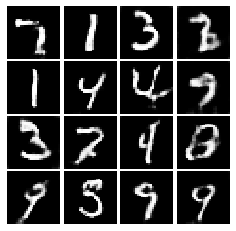

Epoch: 2, Iter: 980, D: 0.1609, G:0.2465


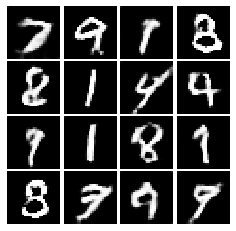

Epoch: 2, Iter: 1000, D: 0.14, G:0.2163


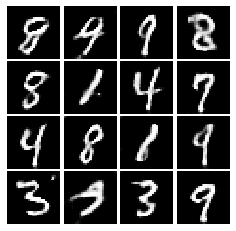

Epoch: 2, Iter: 1020, D: 0.1764, G:0.4029


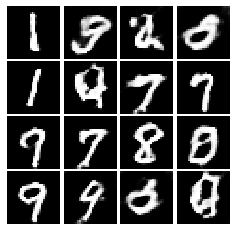

Epoch: 2, Iter: 1040, D: 0.188, G:0.2243


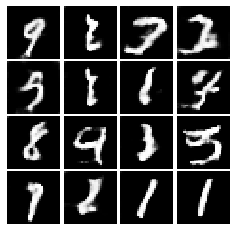

Epoch: 2, Iter: 1060, D: 0.1376, G:0.2906


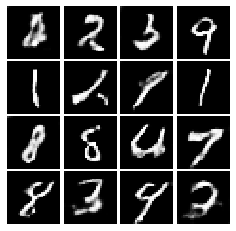

Epoch: 2, Iter: 1080, D: 0.1327, G:0.2136


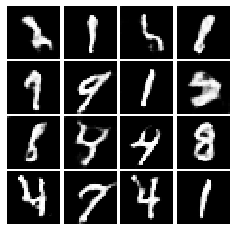

Epoch: 2, Iter: 1100, D: 0.184, G:0.2381


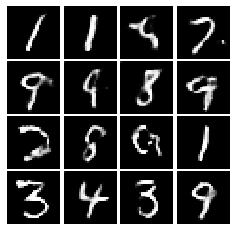

Epoch: 2, Iter: 1120, D: 0.1626, G:0.2431


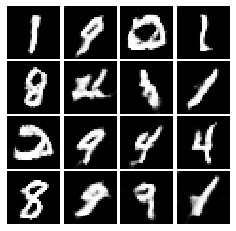

Epoch: 2, Iter: 1140, D: 0.153, G:0.1856


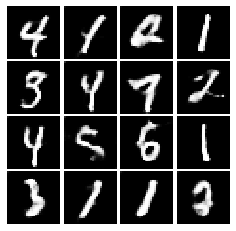

Epoch: 2, Iter: 1160, D: 0.1473, G:0.2425


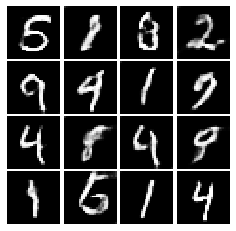

Epoch: 2, Iter: 1180, D: 0.1802, G:0.2311


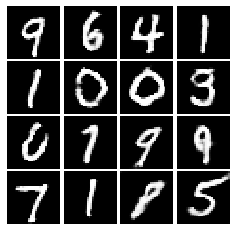

Epoch: 2, Iter: 1200, D: 0.168, G:0.191


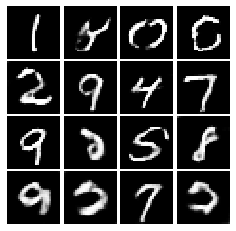

Epoch: 2, Iter: 1220, D: 0.1952, G:0.1692


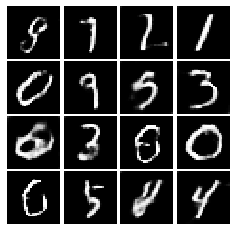

Epoch: 2, Iter: 1240, D: 0.1476, G:0.2352


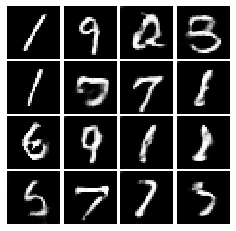

Epoch: 2, Iter: 1260, D: 0.1642, G:0.1934


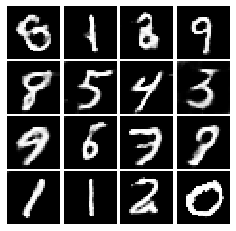

Epoch: 2, Iter: 1280, D: 0.1581, G:0.241


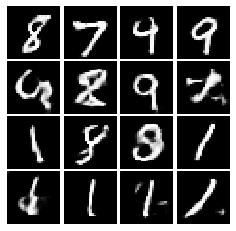

Epoch: 2, Iter: 1300, D: 0.1658, G:0.2878


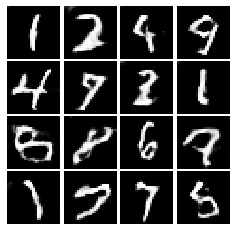

Epoch: 2, Iter: 1320, D: 0.1419, G:0.3624


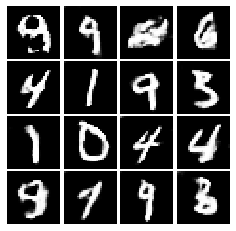

Epoch: 2, Iter: 1340, D: 0.1886, G:0.2165


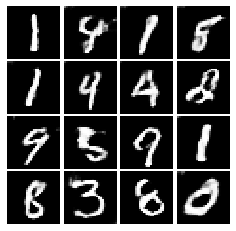

Epoch: 2, Iter: 1360, D: 0.21, G:0.2205


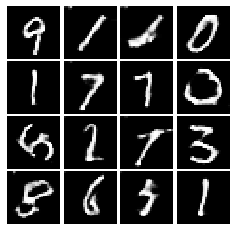

Epoch: 2, Iter: 1380, D: 0.1564, G:0.2252


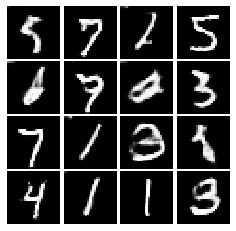

Epoch: 2, Iter: 1400, D: 0.1516, G:0.2719


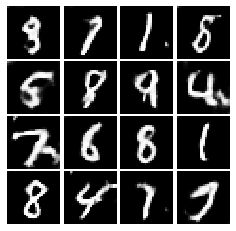

Epoch: 3, Iter: 1420, D: 0.1817, G:0.2169


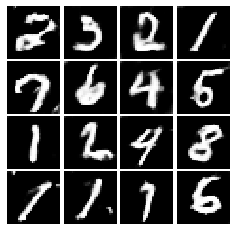

Epoch: 3, Iter: 1440, D: 0.1681, G:0.2496


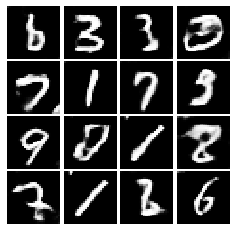

Epoch: 3, Iter: 1460, D: 0.1549, G:0.2679


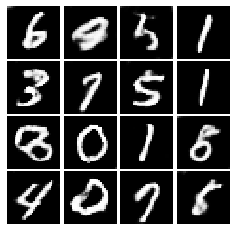

Epoch: 3, Iter: 1480, D: 0.2072, G:0.269


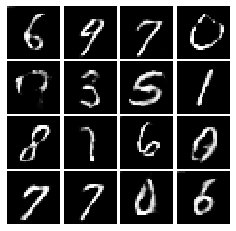

Epoch: 3, Iter: 1500, D: 0.1837, G:0.2404


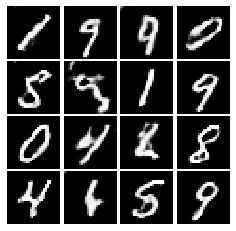

Epoch: 3, Iter: 1520, D: 0.1702, G:0.2573


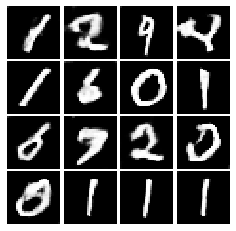

Epoch: 3, Iter: 1540, D: 0.2006, G:0.2628


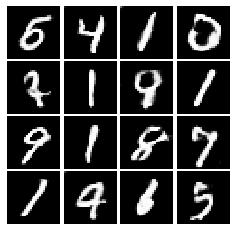

Epoch: 3, Iter: 1560, D: 0.1771, G:0.3026


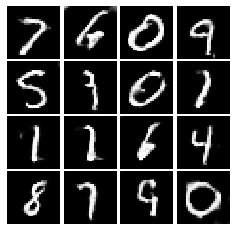

Epoch: 3, Iter: 1580, D: 0.1839, G:0.2344


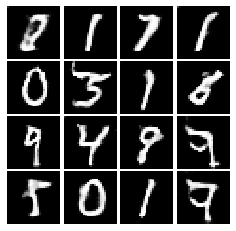

Epoch: 3, Iter: 1600, D: 0.1739, G:0.2822


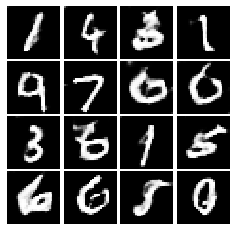

Epoch: 3, Iter: 1620, D: 0.1703, G:0.2383


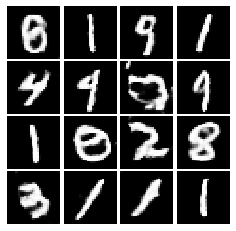

Epoch: 3, Iter: 1640, D: 0.134, G:0.2808


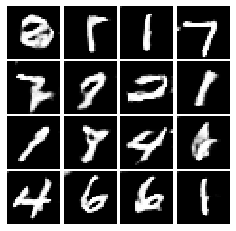

Epoch: 3, Iter: 1660, D: 0.1698, G:0.2726


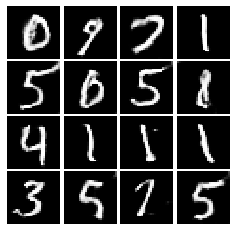

Epoch: 3, Iter: 1680, D: 0.1888, G:0.2352


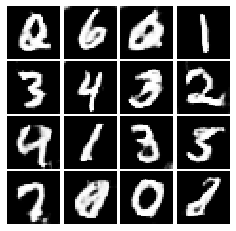

Epoch: 3, Iter: 1700, D: 0.1399, G:0.2774


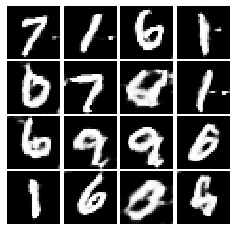

Epoch: 3, Iter: 1720, D: 0.1782, G:0.2044


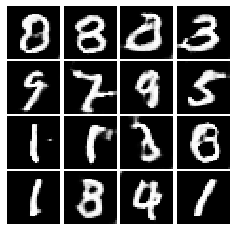

Epoch: 3, Iter: 1740, D: 0.1816, G:0.2298


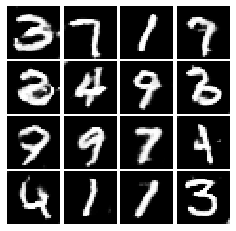

Epoch: 3, Iter: 1760, D: 0.1737, G:0.2386


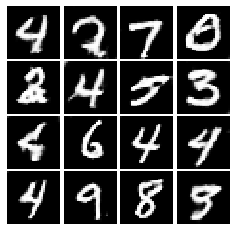

Epoch: 3, Iter: 1780, D: 0.1831, G:0.2095


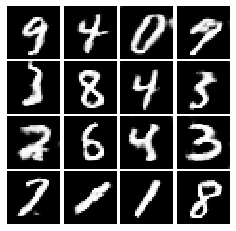

Epoch: 3, Iter: 1800, D: 0.2066, G:0.2378


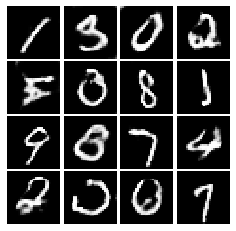

Epoch: 3, Iter: 1820, D: 0.1714, G:0.2859


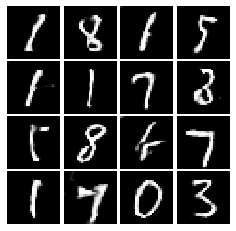

Epoch: 3, Iter: 1840, D: 0.1589, G:0.2275


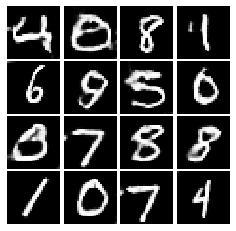

Epoch: 3, Iter: 1860, D: 0.1887, G:0.207


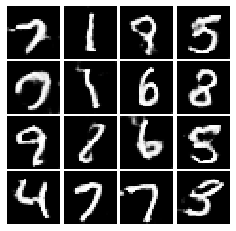

Epoch: 4, Iter: 1880, D: 0.1475, G:0.2989


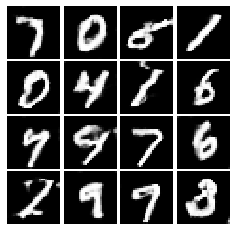

Epoch: 4, Iter: 1900, D: 0.154, G:0.2365


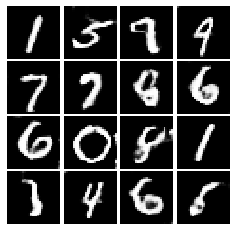

Epoch: 4, Iter: 1920, D: 0.1663, G:0.2319


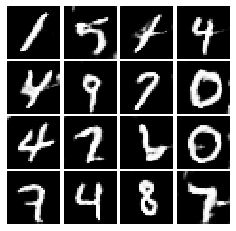

Epoch: 4, Iter: 1940, D: 0.1463, G:0.2406


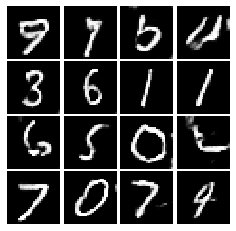

Epoch: 4, Iter: 1960, D: 0.1753, G:0.2495


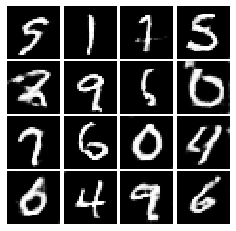

Epoch: 4, Iter: 1980, D: 0.1605, G:0.2587


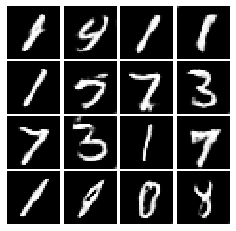

Epoch: 4, Iter: 2000, D: 0.2, G:0.1699


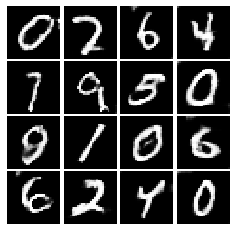

Epoch: 4, Iter: 2020, D: 0.2101, G:0.2254


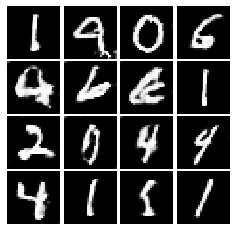

Epoch: 4, Iter: 2040, D: 0.1661, G:0.3496


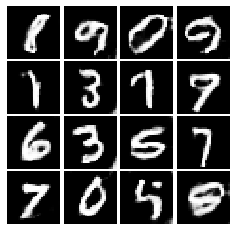

Epoch: 4, Iter: 2060, D: 0.1387, G:0.286


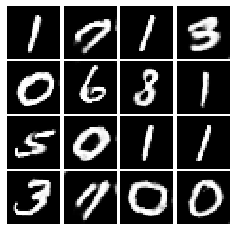

Epoch: 4, Iter: 2080, D: 0.1852, G:0.206


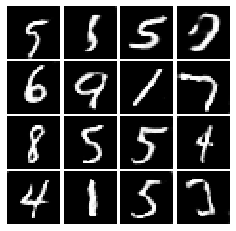

Epoch: 4, Iter: 2100, D: 0.1784, G:0.2474


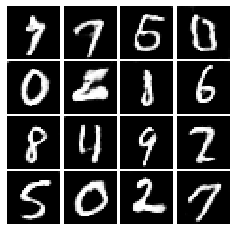

Epoch: 4, Iter: 2120, D: 0.1846, G:0.2395


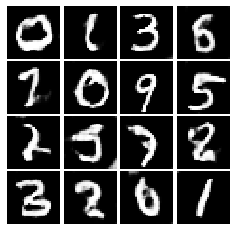

Epoch: 4, Iter: 2140, D: 0.2205, G:0.2415


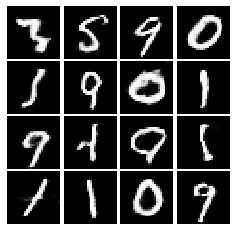

Epoch: 4, Iter: 2160, D: 0.2169, G:0.2129


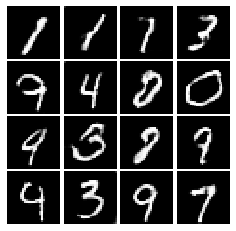

Epoch: 4, Iter: 2180, D: 0.1694, G:0.2206


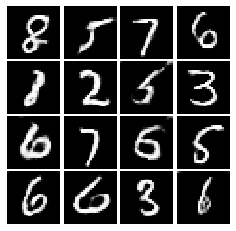

Epoch: 4, Iter: 2200, D: 0.204, G:0.1718


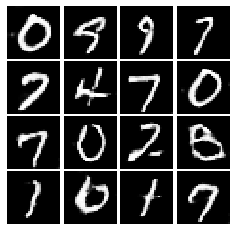

Epoch: 4, Iter: 2220, D: 0.1934, G:0.2579


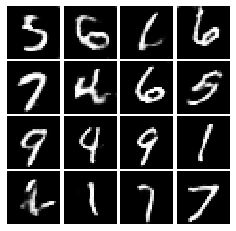

Epoch: 4, Iter: 2240, D: 0.1925, G:0.2079


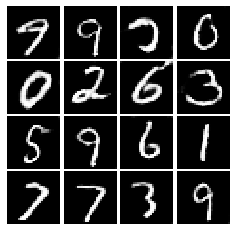

Epoch: 4, Iter: 2260, D: 0.2009, G:0.2252


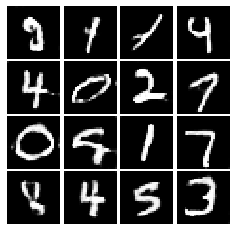

Epoch: 4, Iter: 2280, D: 0.1769, G:0.2438


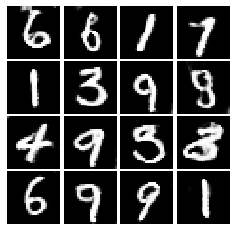

Epoch: 4, Iter: 2300, D: 0.2193, G:0.2375


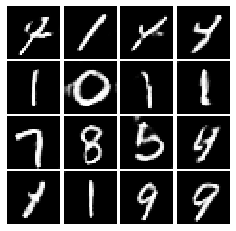

Epoch: 4, Iter: 2320, D: 0.195, G:0.2708


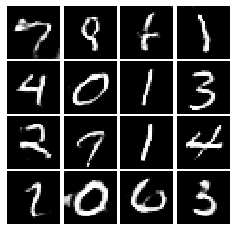

Epoch: 4, Iter: 2340, D: 0.1804, G:0.3157


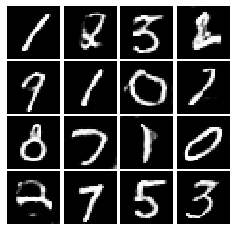

Epoch: 5, Iter: 2360, D: 0.1775, G:0.2522


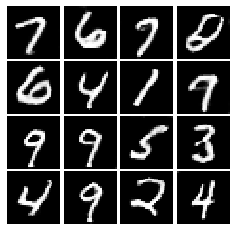

Epoch: 5, Iter: 2380, D: 0.1853, G:0.2062


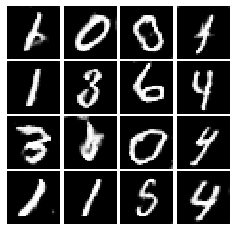

Epoch: 5, Iter: 2400, D: 0.1533, G:0.3671


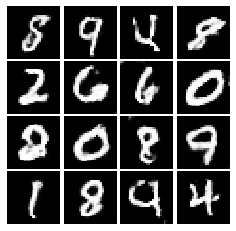

Epoch: 5, Iter: 2420, D: 0.2066, G:0.2801


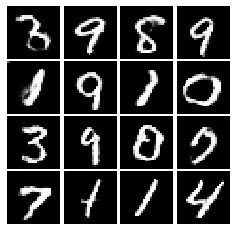

Epoch: 5, Iter: 2440, D: 0.1634, G:0.2231


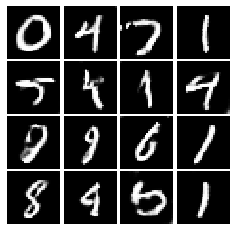

Epoch: 5, Iter: 2460, D: 0.148, G:0.3034


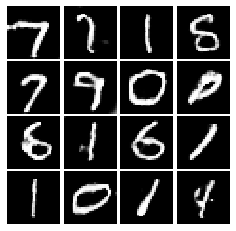

Epoch: 5, Iter: 2480, D: 0.146, G:0.268


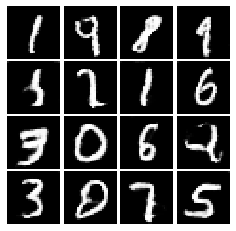

Epoch: 5, Iter: 2500, D: 0.1687, G:0.2133


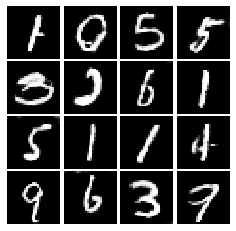

Epoch: 5, Iter: 2520, D: 0.2177, G:0.2758


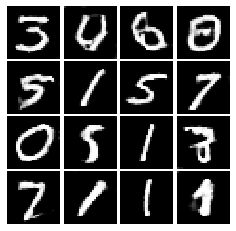

Epoch: 5, Iter: 2540, D: 0.183, G:0.1891


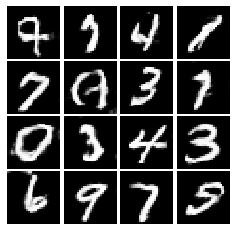

Epoch: 5, Iter: 2560, D: 0.2124, G:0.2093


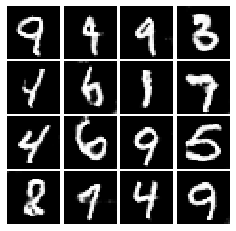

Epoch: 5, Iter: 2580, D: 0.1925, G:0.2159


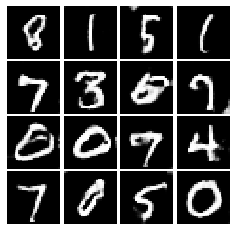

Epoch: 5, Iter: 2600, D: 0.2012, G:0.1777


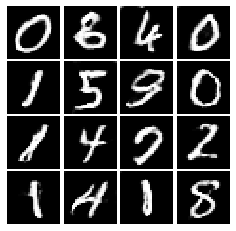

Epoch: 5, Iter: 2620, D: 0.1915, G:0.3898


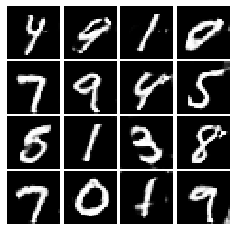

Epoch: 5, Iter: 2640, D: 0.1584, G:0.2335


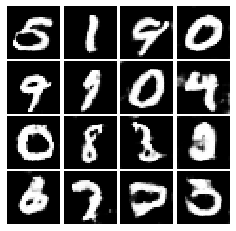

Epoch: 5, Iter: 2660, D: 0.1376, G:0.283


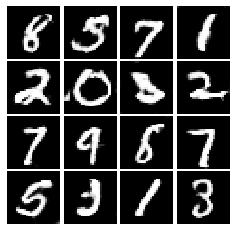

Epoch: 5, Iter: 2680, D: 0.178, G:0.2384


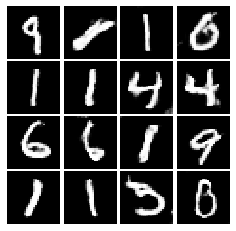

Epoch: 5, Iter: 2700, D: 0.1748, G:0.2098


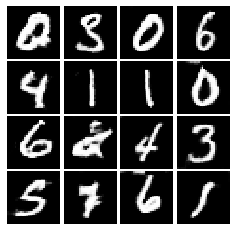

Epoch: 5, Iter: 2720, D: 0.1788, G:0.2385


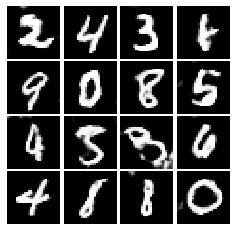

Epoch: 5, Iter: 2740, D: 0.1781, G:0.2695


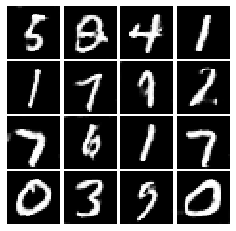

Epoch: 5, Iter: 2760, D: 0.1604, G:0.1997


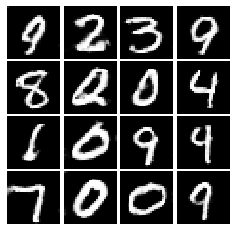

Epoch: 5, Iter: 2780, D: 0.1716, G:0.2354


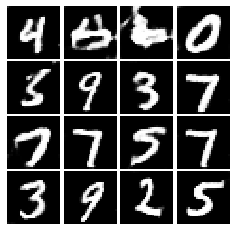

Epoch: 5, Iter: 2800, D: 0.1595, G:0.2323


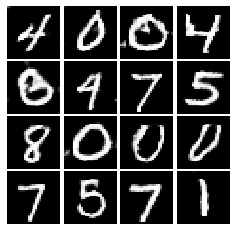

Epoch: 6, Iter: 2820, D: 0.1767, G:0.2575


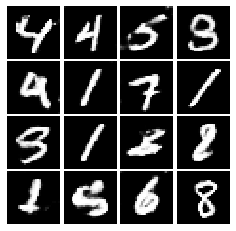

Epoch: 6, Iter: 2840, D: 0.1901, G:0.3802


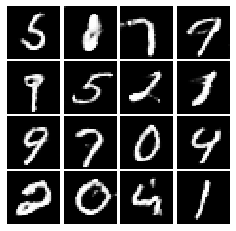

Epoch: 6, Iter: 2860, D: 0.1623, G:0.3326


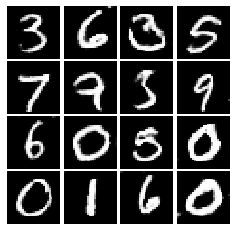

Epoch: 6, Iter: 2880, D: 0.175, G:0.2826


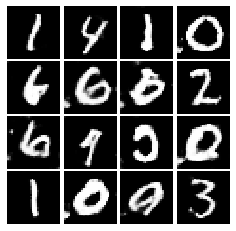

Epoch: 6, Iter: 2900, D: 0.1735, G:0.2034


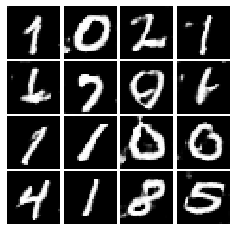

Epoch: 6, Iter: 2920, D: 0.1782, G:0.2052


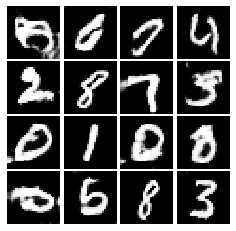

Epoch: 6, Iter: 2940, D: 0.1706, G:0.201


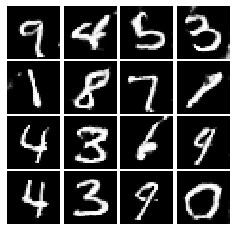

Epoch: 6, Iter: 2960, D: 0.1653, G:0.2194


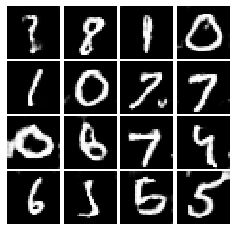

Epoch: 6, Iter: 2980, D: 0.1719, G:0.2527


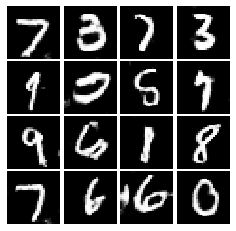

Epoch: 6, Iter: 3000, D: 0.1677, G:0.2458


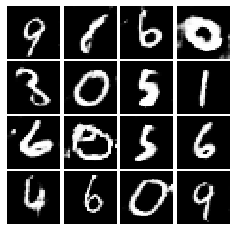

Epoch: 6, Iter: 3020, D: 0.1717, G:0.3495


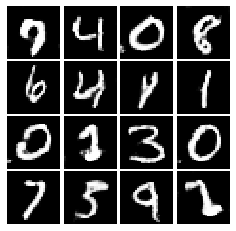

Epoch: 6, Iter: 3040, D: 0.1354, G:0.2898


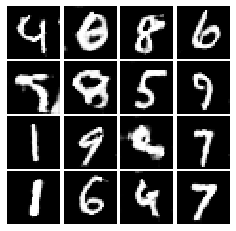

Epoch: 6, Iter: 3060, D: 0.1436, G:0.2757


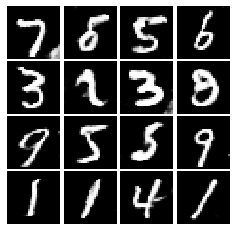

Epoch: 6, Iter: 3080, D: 0.1583, G:0.2145


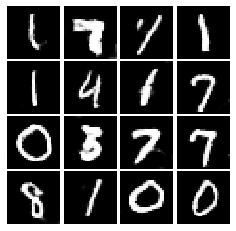

Epoch: 6, Iter: 3100, D: 0.1355, G:0.288


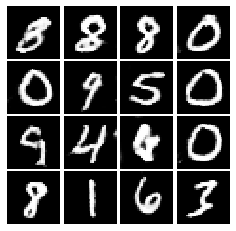

Epoch: 6, Iter: 3120, D: 0.2285, G:0.1982


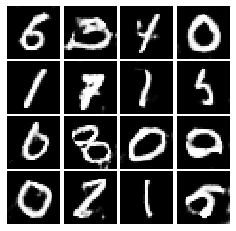

Epoch: 6, Iter: 3140, D: 0.1567, G:0.2402


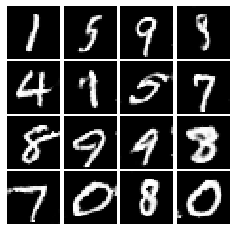

Epoch: 6, Iter: 3160, D: 0.1487, G:0.2591


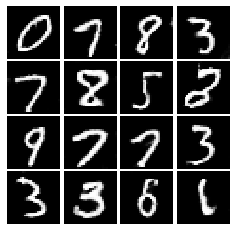

Epoch: 6, Iter: 3180, D: 0.1544, G:0.2843


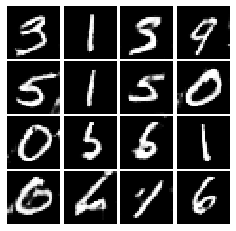

Epoch: 6, Iter: 3200, D: 0.1319, G:0.3103


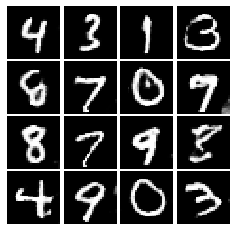

Epoch: 6, Iter: 3220, D: 0.1508, G:0.2536


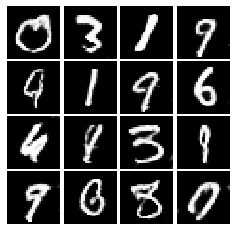

Epoch: 6, Iter: 3240, D: 0.171, G:0.3778


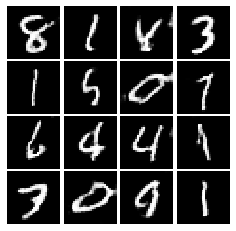

Epoch: 6, Iter: 3260, D: 0.159, G:0.335


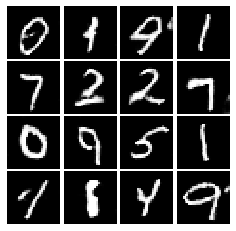

Epoch: 6, Iter: 3280, D: 0.176, G:0.3375


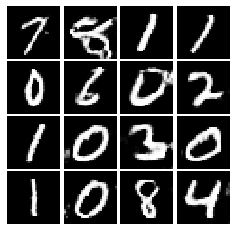

Epoch: 7, Iter: 3300, D: 0.1702, G:0.2877


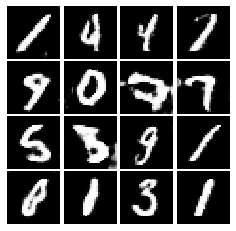

Epoch: 7, Iter: 3320, D: 0.1434, G:0.2707


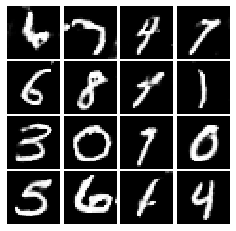

Epoch: 7, Iter: 3340, D: 0.1368, G:0.4141


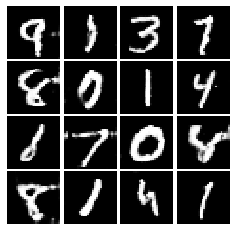

Epoch: 7, Iter: 3360, D: 0.1741, G:0.2945


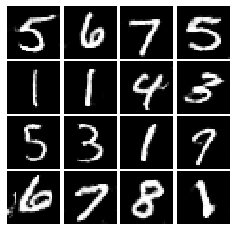

Epoch: 7, Iter: 3380, D: 0.1899, G:0.3144


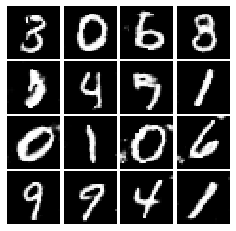

Epoch: 7, Iter: 3400, D: 0.1479, G:0.2611


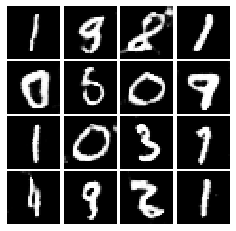

Epoch: 7, Iter: 3420, D: 0.1243, G:0.294


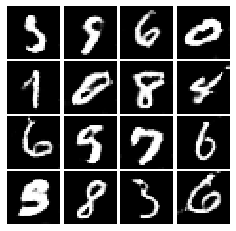

Epoch: 7, Iter: 3440, D: 0.1639, G:0.2275


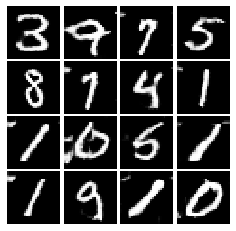

Epoch: 7, Iter: 3460, D: 0.1973, G:0.2462


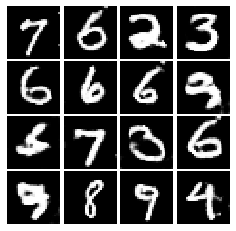

Epoch: 7, Iter: 3480, D: 0.2141, G:0.484


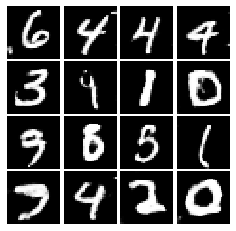

Epoch: 7, Iter: 3500, D: 0.1358, G:0.3022


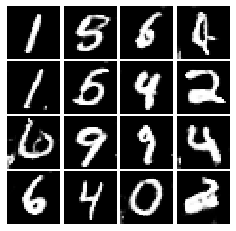

Epoch: 7, Iter: 3520, D: 0.159, G:0.3173


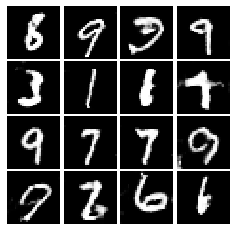

Epoch: 7, Iter: 3540, D: 0.1397, G:0.3034


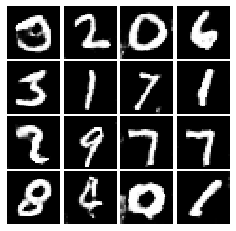

Epoch: 7, Iter: 3560, D: 0.1386, G:0.2283


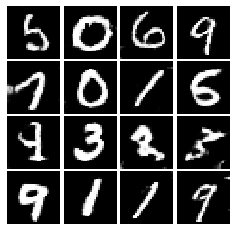

Epoch: 7, Iter: 3580, D: 0.1777, G:0.3318


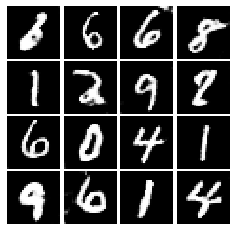

Epoch: 7, Iter: 3600, D: 0.1477, G:0.2852


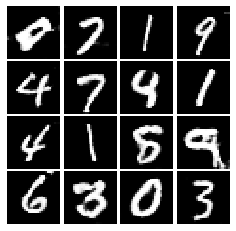

Epoch: 7, Iter: 3620, D: 0.1589, G:0.3242


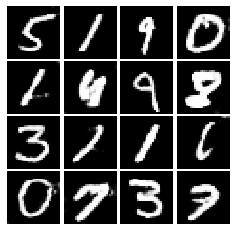

Epoch: 7, Iter: 3640, D: 0.1688, G:0.1958


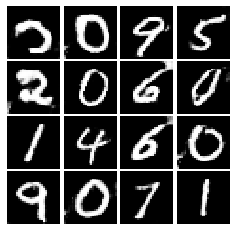

Epoch: 7, Iter: 3660, D: 0.1682, G:0.2462


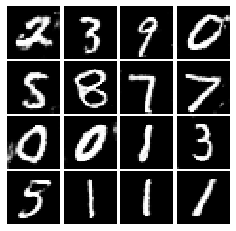

Epoch: 7, Iter: 3680, D: 0.1526, G:0.3031


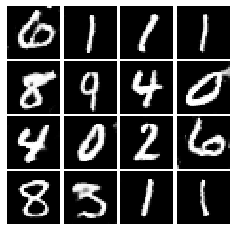

Epoch: 7, Iter: 3700, D: 0.1463, G:0.2684


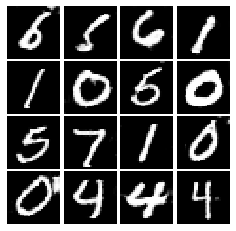

Epoch: 7, Iter: 3720, D: 0.1508, G:0.2859


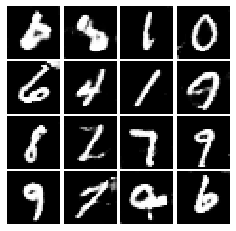

Epoch: 7, Iter: 3740, D: 0.1658, G:0.3539


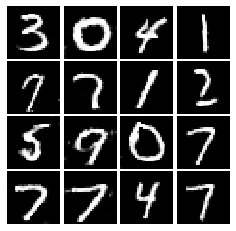

Epoch: 8, Iter: 3760, D: 0.1467, G:0.2696


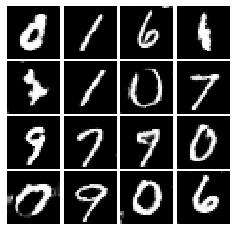

Epoch: 8, Iter: 3780, D: 0.1612, G:0.2382


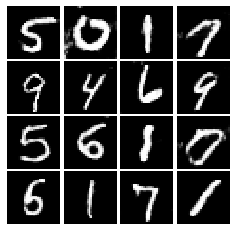

Epoch: 8, Iter: 3800, D: 0.1447, G:0.3448


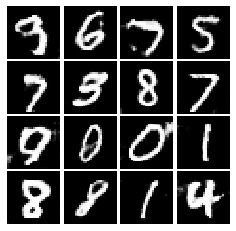

Epoch: 8, Iter: 3820, D: 0.2425, G:0.09609


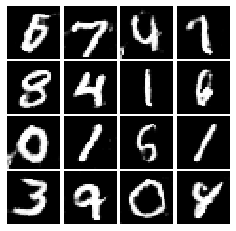

Epoch: 8, Iter: 3840, D: 0.1609, G:0.2586


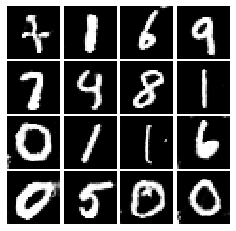

Epoch: 8, Iter: 3860, D: 0.1584, G:0.2913


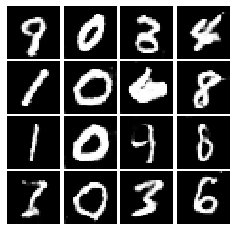

Epoch: 8, Iter: 3880, D: 0.1445, G:0.2653


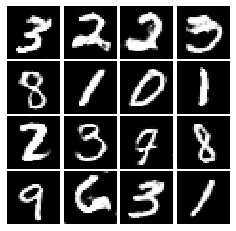

Epoch: 8, Iter: 3900, D: 0.1525, G:0.2121


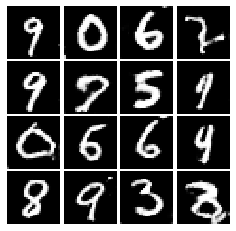

Epoch: 8, Iter: 3920, D: 0.1414, G:0.2864


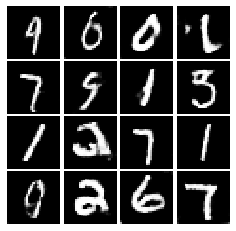

Epoch: 8, Iter: 3940, D: 0.1642, G:0.2184


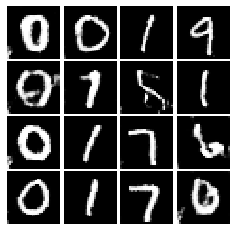

Epoch: 8, Iter: 3960, D: 0.1873, G:0.249


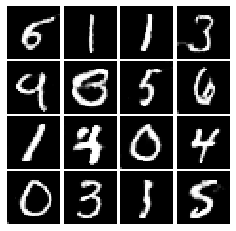

Epoch: 8, Iter: 3980, D: 0.1474, G:0.2512


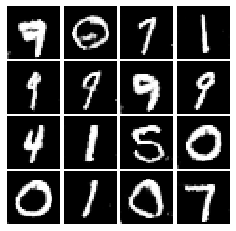

Epoch: 8, Iter: 4000, D: 0.1865, G:0.2581


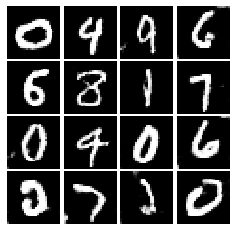

Epoch: 8, Iter: 4020, D: 0.149, G:0.2501


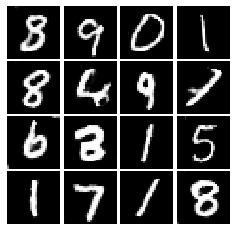

Epoch: 8, Iter: 4040, D: 0.155, G:0.2676


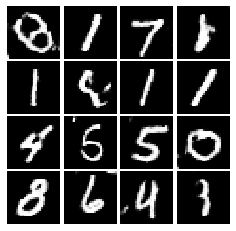

Epoch: 8, Iter: 4060, D: 0.1608, G:0.3511


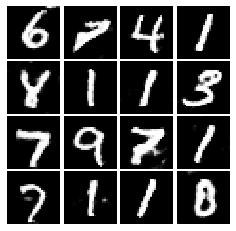

Epoch: 8, Iter: 4080, D: 0.1521, G:0.2773


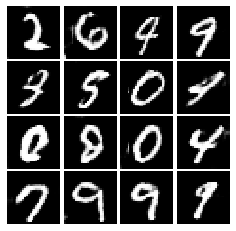

Epoch: 8, Iter: 4100, D: 0.1467, G:0.2969


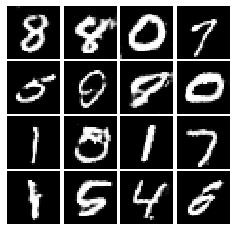

Epoch: 8, Iter: 4120, D: 0.1458, G:0.2603


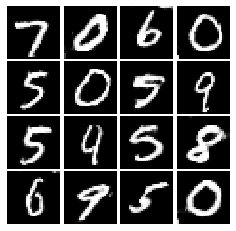

Epoch: 8, Iter: 4140, D: 0.1432, G:0.1517


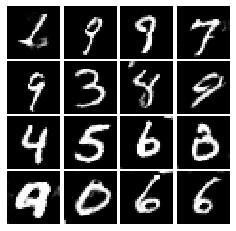

Epoch: 8, Iter: 4160, D: 0.133, G:0.2365


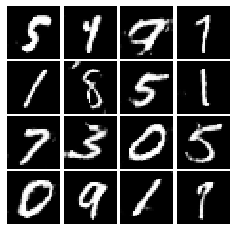

Epoch: 8, Iter: 4180, D: 0.1389, G:0.2851


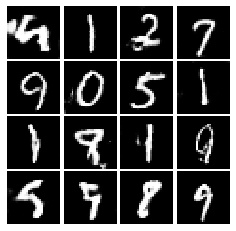

Epoch: 8, Iter: 4200, D: 0.1295, G:0.256


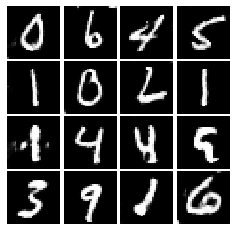

Epoch: 8, Iter: 4220, D: 0.1841, G:0.2429


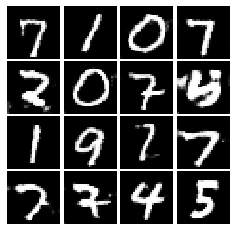

Epoch: 9, Iter: 4240, D: 0.1268, G:0.2315


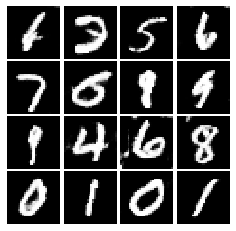

Epoch: 9, Iter: 4260, D: 0.1507, G:0.2748


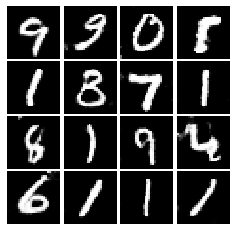

Epoch: 9, Iter: 4280, D: 0.1639, G:0.25


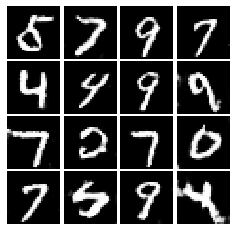

Epoch: 9, Iter: 4300, D: 0.1656, G:0.2602


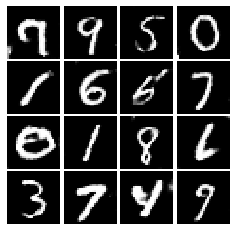

Epoch: 9, Iter: 4320, D: 0.1403, G:0.2571


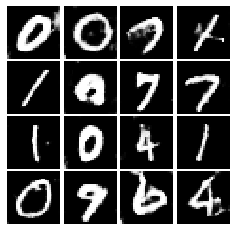

Epoch: 9, Iter: 4340, D: 0.1257, G:0.3629


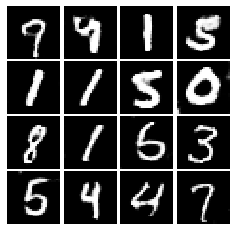

Epoch: 9, Iter: 4360, D: 0.1548, G:0.3799


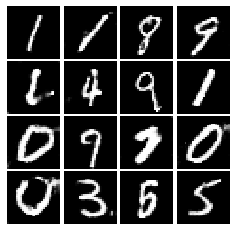

Epoch: 9, Iter: 4380, D: 0.1434, G:0.2296


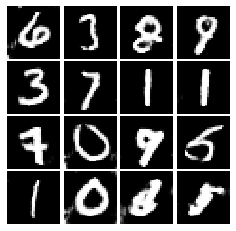

Epoch: 9, Iter: 4400, D: 0.1399, G:0.2201


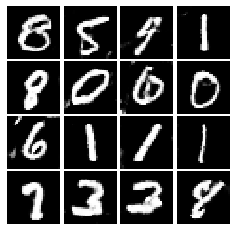

Epoch: 9, Iter: 4420, D: 0.1271, G:0.2803


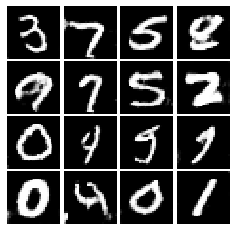

Epoch: 9, Iter: 4440, D: 0.1695, G:0.3381


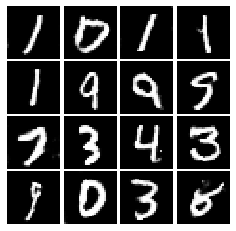

Epoch: 9, Iter: 4460, D: 0.1216, G:0.336


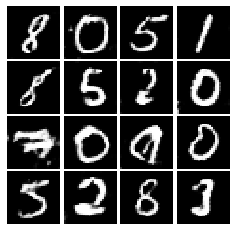

Epoch: 9, Iter: 4480, D: 0.1326, G:0.2523


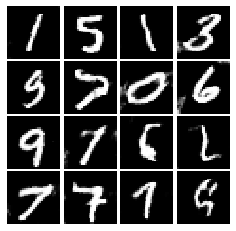

Epoch: 9, Iter: 4500, D: 0.1404, G:0.1776


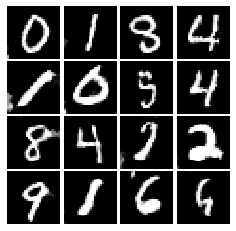

Epoch: 9, Iter: 4520, D: 0.1332, G:0.4004


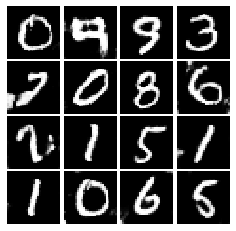

Epoch: 9, Iter: 4540, D: 0.1487, G:0.2051


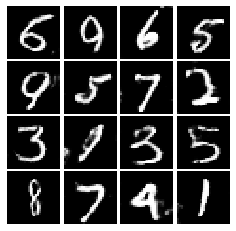

Epoch: 9, Iter: 4560, D: 0.1268, G:0.3783


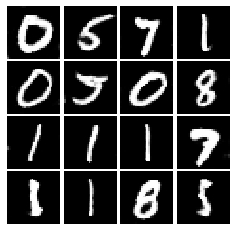

Epoch: 9, Iter: 4580, D: 0.1132, G:0.3107


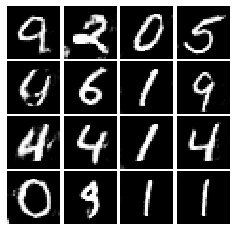

Epoch: 9, Iter: 4600, D: 0.1311, G:0.2487


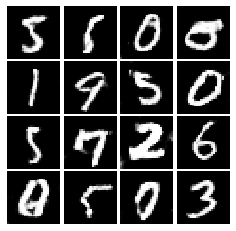

Epoch: 9, Iter: 4620, D: 0.1341, G:0.3201


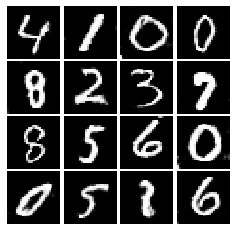

Epoch: 9, Iter: 4640, D: 0.1083, G:0.3898


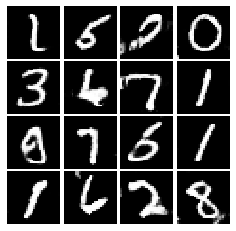

Epoch: 9, Iter: 4660, D: 0.1259, G:0.2002


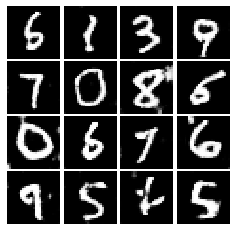

Epoch: 9, Iter: 4680, D: 0.1064, G:0.2699


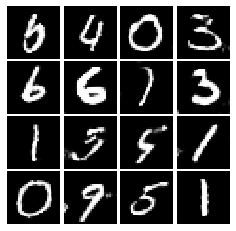

Final images


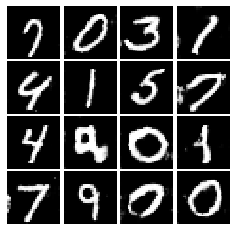

In [27]:
# YOUR TRAINING CODE HERE
D = DC_Discriminator()
G = DC_Generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver = tf.keras.optimizers.Adam(learning_rate=1e-3, beta_1=0.5, beta_2=0.999)
G_solver = tf.keras.optimizers.Adam(learning_rate=1e-3, beta_1=0.5, beta_2=0.999)
    
# Run it!
train(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

### Section 2.3 Conclusion. [10 pts]
You have successfully trained you GAN models. Hurray! Now, we want you to answer the following question in few sentences.
1. Have you observed any difference between GAN and LSGAN (e.g. training, generation quality)?
2. What is the difference between output of the simple GAN (Part 1) and output of the DCGAN ? 
3. How can you quantitatively evaluate your GAN model? Is the metric(s) meaningful? Is there any drawback about this metric(s)?

In [0]:
1 - The LSGAN produces better images than the GAN loss function.
2 - The output of the DCGAN network has much less noise compared to the noise present in the simple GAN network.
3 - Quantitatively evaluating the GAN model can be done by training the generator to maximize the probability of the discriminator classifying it as an image from the mnist dataset.